<div style="background-color: #F8F8F8; padding: 25px; border-radius: 15px;
            border-top:1px solid #FB4F14; border-bottom:1px solid #FB4F14;
            border-left:8px solid #FB4F14; border-right:8px solid #001489;">

<h1 style="color:#001489; text-align:center; font-family:'Helvetica Neue', sans-serif; font-size:44px; font-weight:bold;">
  Kaggle Mini-Project:<br>Natural Language Processing with Disaster Tweets
</h1>
  <div style="text-align:center; margin-top:10px;">
    <a href="https://www.kaggle.com/c/nlp-getting-started/overview"
      style="color:#1E90FF; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:28px; font-weight:normal;" 
      target="_blank">
      Kaggle Competition
      </a>
  </div>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:6px 0;">

  <h2 style="color: #DA291C; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 40px; font-weight: bold;">
    By: Travis Reinart
  </h2>
  <h3 style="color: #000000; text-align:center; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: bold;">
    September 3, 2025
  </h3>

  <h4 style="color:#000000; text-align:center; font-family:'Helvetica Neue', sans-serif; font-size:18px; font-weight:normal; border-top:1px solid #DCDCDC; padding-top:10px; margin-top:15px;">
    Week 4 NLP Disaster Tweets Peer-Graded Assignment<br>
    <em>CSCA 5642: Introduction to Deep Learning</em>
  </h4>

  <div style="text-align:center; margin-top:10px;">
    <a href="https://github.com/treinart/CSCA-5642-Introduction-to-Deep-Learning/tree/main/Week%204"
       style="color:#0046AE; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:28px; font-weight:bold;"
       target="_blank" rel="noopener">
       GitHub-Week 4 NLP with Disaster Kaggle Mini-Project
    </a>
  </div>

  <div style="text-align:center; margin-top:8px;">
    <a href="https://treinart.github.io/CSCA-5642-Introduction-to-Deep-Learning/Week4_Kaggle_NLP_Disaster_Tweets.html"
       style="color:#0046AE; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:22px; font-weight:normal;"
       target="_blank" rel="noopener">
       View NLP Disaster Tweet Analysis (Live HTML)
    </a>
  </div>

  <h6 style="color:#FB4F14; text-align:center; font-family:'Helvetica Neue', sans-serif; font-size:12px; font-weight:normal; margin-bottom:2px;">
    Copyright (c) 2025 Travis Reinart
  </h6>
  <h6 style="color:#FB4F14; text-align:center; font-family:'Helvetica Neue', sans-serif; font-size:12px; font-weight:normal; margin-top:0;">
    Licensed under the <a href="https://opensource.org/licenses/MIT" target="_blank" rel="noopener" style="color:#001489; text-decoration:underline;">MIT License</a>.
  </h6>

  <hr style="border:none; border-top:8px solid #001489; margin:10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:24px; border-radius:10px; border-left:8px solid #FB4F14; border-right:8px solid #001489;">

  <h2 style="color:#001489; margin:0 0 10px 0;">Section 1: Introduction</h2>

<p>
This notebook documents a complete approach to the <em>NLP with Disaster Tweets</em> challenge on Kaggle. The task is a binary classification of tweet text, with the final score determined by the F1 metric.
After reviewing the competition and the past leaderboard scores, a personal goal of <strong>F1 ≥ 0.84</strong> was set. To achieve this, research was done to see how top competitors successfully handled this specific problem. After reading through several high-scoring examples on Kaggle, GitHub, and in articles, a clear pattern emerged.
</p>
<p>
High-scoring solutions consistently follow a structured, multi-stage approach, rather than relying on a single model. The most successful strategies found in the research include:
</p>
<ul style="margin:6px 0 0 18px;">
    <li><b>Starting with a Strong Baseline:</b> Nearly all top solutions begin with a fast and reliable TF-IDF model to get a solid initial score and understand the data from a bag-of-words perspective.</li>
    <li><b>Leveraging Word Order:</b> To improve upon the baseline, models that understand word sequence and context, like LSTMs or GRUs with pre-trained GloVe embeddings, are essential for capturing nuance.</li>
    <li><b>Using State-of-the-Art Transformers:</b> For maximum performance, fine-tuning a powerful, pre-trained Transformer like RoBERTa or DeBERTa is the standard approach. Research papers on the topic confirm these models are superior for this type of task.</li>
    <li><b>Ensembling for the Win:</b> The very best scores are almost always achieved by blending the predictions from these different models, as each architecture captures different signals in the noisy data.</li>
</ul>
<p>
This research directly led to the following four-stage modeling plan for this project:
</p>
<ol style="margin:6px 0 0 18px;">
    <li><strong>Linear Baselines:</strong> Fast and reliable TF-IDF models (Logistic Regression and SVM) are used to establish an initial performance benchmark.</li>
    <li><strong>Recurrent Neural Network:</strong> A sequence-aware BiGRU with Attention is then built to leverage word order and context.</li>
    <li><strong>Transformer Model:</strong> A large, pre-trained DeBERTa-v3 Transformer is fine-tuned for state-of-the-art performance.</li>
    <li><strong>Ensemble Blending:</strong> Finally, the predictions from the best-performing models are blended together to capture their diverse strengths and maximize the final F1 score.</li>
</ol>

  <h4 style="color:#FB4F14; margin-top:16px;">Dataset at a glance</h4>
  <ul>
    <li><b>Files:</b> <code>train.csv</code>, <code>test.csv</code>, <code>sample_submission.csv</code></li>
    <li><b>Train size:</b> 7,613 rows × 5 columns: <code>id</code>, <code>keyword</code>, <code>location</code>, <code>text</code>, <code>target</code></li>
    <li><b>Test size:</b> 3,263 rows × 4 columns: <code>id</code>, <code>keyword</code>, <code>location</code>, <code>text</code></li>
    <li><b>Target balance (train):</b> 0 → 4,342 tweets, 1 → 3,271 tweets</li>
    <li><b>Missingness:</b> <code>keyword</code> ~0.8% missing, <code>location</code> ~33% missing</li>
    <li><b>Length:</b> mean ~101 chars and ~15 tokens; 95th percentile ~140 chars and ~24 tokens</li>
    <li><b>Noise indicators:</b> URLs in ~52% of tweets, <code>@mentions</code> in ~26%, <code>#hashtags</code> in ~23%</li>
  </ul>

  <h4 style="color:#FB4F14; margin-top:16px;">How this project fits with the BBC News mini project</h4> 

  <p style="margin:0 0 6px 0;">
    If I wasn’t aiming for ≥0.84 on Kaggle, I’d reuse the BBC News pipeline and call it done. With disciplined CV and threshold tuning, a solid TF-IDF + Logistic Regression or Linear SVM baseline on Disaster Tweets usually lands around F1 ≈ 0.79–0.82. That is enough to satisfy the rubric and show a working classifier. For ≥0.84 you need a sequence model. Use a lean BiGRU/LSTM or a compact Transformer like DeBERTa with 5 fold CV, then blend with the TF-IDF logits.
  </p>

  <p style="margin:0 0 10px 0;">
    Both assignments sit inside the <i>Machine Learning Theory and Hands-on Practice with Python</i> specialization. The BBC mini project was a supervised text task placed inside the Unsupervised course to practice workflow and evaluation on clean data. The BBC News Classification mini project came in the <b>Unsupervised Algorithms in Machine Learning</b> course (Week 4) and used a simple, well-separated text domain. This notebook is for <b>Introduction to Deep Learning</b> (Week 4) and pushes into sequence models for short, noisy tweets. Both are text classification tasks, but the modeling focus is different and the target here is a higher Kaggle score.
  </p>
 
 <p style="margin:0 0 6px 0;">
  If you would like to review the BBC News Classification Kaggle mini project from
  <b>Unsupervised Algorithms in Machine Learning</b> (Week 4), use the live HTML link below.
</p>

<p style="text-align:left; margin-top:8px;">
  <a href="https://treinart.github.io/CSCA-5632-Unsupervised-Algorithms-in-Machine-Learning/Week4_Kaggle_BBC_News_Classification.html"
     style="color:#1E90FF; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:18px; font-weight:normal;"
     target="_blank">
     Review: BBC News Classification Kaggle Mini Project (Week 4, Unsupervised ML) Live HTML
  </a>
</p>

  <table style="width:100%; border-collapse:collapse; margin:8px 0 14px 0; font-size:14px;">
    <thead>
      <tr style="background:#111;">
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Item</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">BBC News Mini Project<br><span>(Unsupervised course, Week 4)</span></th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Disaster Tweets Mini Project<br><span>(Deep Learning course, Week 4)</span></th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td style="padding:6px;">Kaggle link</td>
        <td style="text-align:left; margin-top:8px;">
          <a href="https://www.kaggle.com/competitions/learn-ai-bbc/overview"
             style="color:#1E90FF; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:18px; font-weight:normal;" 
             target="_blank">
             Kaggle Competition: BBC News Classification
          </a>
        </td>
        <td style="text-align:left; margin-top:8px;">
          <a href="https://www.kaggle.com/c/nlp-getting-started/overview"
             style="color:#1E90FF; text-decoration:underline; font-family:'Helvetica Neue', sans-serif; font-size:18px; font-weight:normal;" 
             target="_blank">
             Kaggle Competition: NLP with Disaster Tweets
          </a>
        </td>
      </tr>
      <tr>
        <td style="padding:6px;">Primary emphasis</td>
        <td style="padding:6px;">Classic features, clean topics, strong linear baselines</td>
        <td style="padding:6px;">Sequential modeling and context, short noisy text, leaderboard focus</td>
      </tr>
      <tr>
        <td style="padding:6px;">Reasonable first model</td>
        <td style="padding:6px;">TF-IDF + Logistic Regression</td>
        <td style="padding:6px;">BiGRU/LSTM or a compact Transformer, with blending if helpful</td>
      </tr>
      <tr>
        <td style="padding:6px;">Target outcome</td>
        <td style="padding:6px;">Solid supervised baseline on clean data</td>
        <td style="padding:6px;">F1 > 0.84 on hidden test, with disciplined CV and threshold tuning</td>
      </tr>
    </tbody>
  </table>

  <h4 style="color:#FB4F14; margin-top:10px;">Why Disaster Tweets is harder than BBC News</h4>
  <p style="margin:0 0 6px 0;">
    Both are text classifiers, but the Twitter data needs stronger context handling. Think reliable family car versus an F1 car. Both are cars, yet the F1 build needs different parts and tighter tolerances to hit pace.
  </p>

  <table style="width:100%; border-collapse:collapse; margin:10px 0; font-size:14px;">
    <thead>
      <tr style="background:#111;">
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Feature</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">BBC News Data</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Twitter Data</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td style="padding:6px;">Length</td>
        <td style="padding:6px;">Long articles</td>
        <td style="padding:6px;">Very short, little context</td>
      </tr>
      <tr>
        <td style="padding:6px;">Language</td>
        <td style="padding:6px;">Formal, edited</td>
        <td style="padding:6px;">Informal, slang, typos, abbreviations</td>
      </tr>
      <tr>
        <td style="padding:6px;">Nuance</td>
        <td style="padding:6px;">Factual and direct</td>
        <td style="padding:6px;">Sarcasm, metaphor, jokes</td>
      </tr>
      <tr>
        <td style="padding:6px;">Structure</td>
        <td style="padding:6px;">Clean paragraphs</td>
        <td style="padding:6px;">URLs, @mentions, #hashtags</td>
      </tr>
    </tbody>
  </table>

  <p style="margin:6px 0 0 0;">
    Bottom line: same task family, different demands. BBC rewarded sparse n-grams. Disaster Tweets rewards models that read context in sequence and avoid keyword traps.
  </p>

  <p>
    The biggest trap is nuance. A bag-of-words model sees “fire” and lights up either way:
  </p>
  <blockquote style="border-left:4px solid #444; margin:8px 0; padding:8px 12px;">
    “Our house is on fire, we need help! #californiafires” (disaster)<br>
    “This new album is straight fire! 🔥🔥🔥” (not a disaster)
  </blockquote>

  <h4 style="color:#FB4F14; margin:18px 0 8px 0;">Evaluation Metric: F1 Score</h4>
  <p style="margin:0 0 8px 0;">
    The competition uses the F1 score, the harmonic mean of precision and recall. The metric rewards balance: keep false positives low to protect precision, and keep false negatives low to protect recall.
  </p>

  $$
  F_1 = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
  $$

  $$
  \text{Precision}=\frac{TP}{TP+FP} \qquad \text{Recall}=\frac{TP}{TP+FN}
  $$

  <ul style="margin:0 0 10px 18px;">
    <li><b>TP (True Positive)</b>: predicted 1 and ground truth is 1.</li>
    <li><b>FP (False Positive)</b>: predicted 1 and ground truth is 0.</li>
    <li><b>FN (False Negative)</b>: predicted 0 and ground truth is 1.</li>
  </ul>

  <p style="margin:8px 0 0 0;">
    I will select the decision threshold on out-of-fold probabilities to maximize F1 instead of using 0.5.
  </p>

  <h4 style="color:#FB4F14; margin-top:16px;">Submission file</h4>
  <p>For each <code>id</code> in the test set, predict <code>target</code> ∈ {0,1}.</p>
  <pre style="background:#0b0b0b; color:#F8F8F8; padding:10px; border-radius:6px; border:1px solid #222; font-size:20px; overflow:auto;">
id,target
0,0
2,0
3,1
9,0
11,0</pre>

  <h4 style="color:#FB4F14; margin-top:16px;">Why PyTorch in this notebook?</h4>
  <p>
    PyTorch is used here because it keeps the training loop flexible and pairs cleanly with Hugging Face Transformers. That matters for this project: stratified K-folds, out-of-fold probabilities, best-epoch F1, and quick tweaks like AMP and gradient accumulation are all straightforward without bending the framework.
  </p>
  <ul style="margin:6px 0 0 18px;">
    <li><b>Transformer-friendly:</b> most examples, checkpoints, and utilities land in PyTorch first, so setup is lighter.</li>
    <li><b>Simple custom loops:</b> OOF CV, pick the best epoch by F1, and save/restore fold states. Few lines, no heavy callback stack.</li>
    <li><b>Lean data pipeline:</b> small, readable <code>Dataset</code>/<code>DataLoader</code> for tokenization, padding, and batching.</li>
    <li><b>Training extras:</b> DeBERTa uses AMP (<code>torch.cuda.amp</code>), AdamW, and linear warmup/decay. The BiGRU uses Adam without warmup.</li>
  </ul>
  <p style="margin-top:8px;">
    Switching frameworks doesn’t magically change the score. With the same model and training, TensorFlow/Keras and PyTorch usually land within a rounding error. PyTorch is used here because it keeps the build-and-tweak loop quick for this project.
  </p>
  <p style="margin-top:8px;">
    The Week&nbsp;3 CNN Cancer Detection notebook I used TensorFlow with Keras. This project switches to PyTorch to try a different stack, and because it fits the sequence modeling and CV workflow a bit more cleanly here. That doesn’t make TF/Keras “wrong”, it’s just a better fit for this task and setup.
  </p>

  <h4 style="color:#FB4F14; margin-top:16px;">Model family and plan</h4>
  <p>
    My goal is a leaderboard score above 0.84. I will not rely on a plain TF-IDF baseline or a single large BERT run. TF-IDF misses context. A single fine tuned Transformer can wobble on sarcasm and very short sequences, and 5 fold stability under tight compute can be brittle.
  </p>
  <p>
    The core sequential model will be a gated RNN, specifically a bidirectional GRU with an attention head on top of pretrained GloVe embeddings. It keeps computation simple, respects word order, and highlights the tokens that drive the decision. I will still compare it to a compact Transformer to reach the target if needed, then blend the models if the out-of-fold F1 improves.
  </p>

  <h5 style="color:#FB4F14; margin:10px 0 6px 0;">Why this architecture fits the metric</h5>
  <p style="margin:0 0 6px 0;">
    A TF-IDF + Logistic Regression model scores with <code>p(y=1|x) = σ(wᵀx + b)</code>, where <code>x</code> is a sparse count vector. The weight on the token “fire” acts the same in both examples above. Order and context are not in the feature space. A GRU encodes a sequence <code>(t₁,…,tₙ)</code> into hidden states <code>h₁,…,hₙ</code> where each <code>hᵢ</code> depends on surrounding tokens. An attention pool forms <code>z = Σᵢ αᵢ hᵢ</code> with <code>α</code> learned from the sequence. The classifier then uses <code>σ(vᵀz + c)</code>. The same token shifts meaning because its representation changes with context. That is what improves recall without spiking false positives, which lifts F1.
  </p>
  <p style="margin:0 0 6px 0;">
    For comparison, a Transformer replaces <code>hᵢ</code> with contextual states from self-attention, often summarized by a <code>[CLS]</code> vector. It is stronger, but also heavier. I will use it as a targeted comparator and as a blend partner if it adds measurable F1 on out-of-fold predictions.
  </p>

  <h4 style="color:#FB4F14; margin-top:16px;">Sections Plan </h4>
  <ol style="margin:0 0 0 18px; line-height:1.6;">
    <li><b>Section 1: Introduction</b>: Problem, data, metric, and project summary.</li>
    <li><b>Section 2: Setup</b>: Environment verification, library imports, and utility functions.</li>
    <li><b>Section 3: Data Loading & Audit</b>: Loading CSVs, integrity checks, and initial cleaning.</li>
    <li><b>Section 4: EDA</b>: Visualizing text features, keywords, and class separation.</li>
    <li><b>Section 5: Linear Baselines</b>: 5-fold CV with TF-IDF, Logistic Regression, and SVM.</li>
    <li><b>Section 6: Gated RNN Model</b>: 5-fold CV with a BiGRU, Attention, and GloVe embeddings.</li>
    <li><b>Section 7: Transformer Model</b>: 5-fold CV fine-tuning a pre-trained DeBERTa model.</li>
    <li><b>Section 8: Ensembling & Submission</b>: Blending model predictions and generating the final submission file.</li>
    <li><b>Section 9: Error Analysis</b>: A deep dive into model errors and disagreements.</li>
    <li><b>Section 10: Conclusion</b>: Final results, model performance comparison, key takeaways, and references.</li>
  </ol>

  <hr style="border:none; border-top:8px solid #001489; margin:12px 0 0 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
<h3 style="color: #FB4F14;">1.1 Kaggle Competition: Submission Screenshot</h3> 

  <p>
This screenshot shows the five submissions to the Kaggle <strong><em>NLP with Disaster Tweets</em></strong> competition. The best-performing model was the single <strong>DeBERTa Transformer</strong>, which achieved a final Kaggle submission score of <strong>0.84615</strong>, successfully surpassing the project's goal. Interestingly, the final ensemble blend scored slightly lower at <strong>0.83941</strong>. BiGRU + Attention scored <strong>0.8201</strong>, TF-IDF + LR scored <strong>0.79834</strong>, and last was TF-IDF + SVM with a score of <strong>0.78823</strong>. The list highlights steady progress from linear baselines to neural models and confirms that the transformer is currently the strongest single model while a simple blend remains competitive.
  </p> 

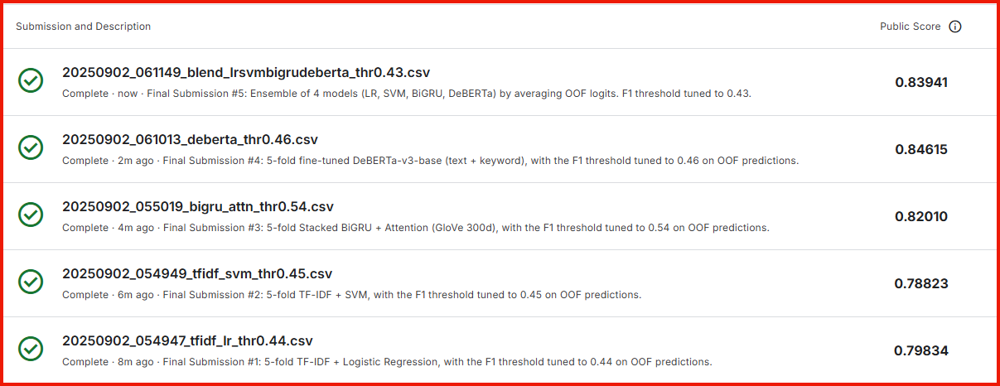

<div style="text-align:center; margin-top:8px;">
    <a href="https://www.kaggle.com/competitions/nlp-getting-started/leaderboard"
      style="color:#1E90FF; text-decoration:underline; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 24px; font-weight: normal;" 
      target="_blank">
      Kaggle Competition: NLP with Disaster Tweets Leaderboard
    </a>
</div>
</h4>

  <hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FB4F14; border-right: 8px solid #001489;">
<h2 style="color: #001489;">Section 2: Setup and Library Imports</h2>

The first step in any project is to establish a clean and reproducible environment. Here, the notebook is set up by confirming data sources, providing an optional cell to install missing packages, importing all necessary libraries, and running diagnostics to ensure everything is ready for analysis.

<h3 style="color:#FB4F14;">Section Plan:</h3>
<ol>
<li><strong>Data Sources:</strong> Confirm files, shapes, and basic integrity.</li>
<li><strong>Package Installation:</strong> An optional cell to install any missing NLP libraries.</li>
<li><strong>Environment Notes:</strong> Optional setup guide for a high-performance WSL2 environment.</li>
<li><strong>Core Library Imports:</strong> A central location for all libraries used in the notebook.</li>
<li><strong>Diagnostics:</strong> Print library versions, set seeds for reproducibility, and check for GPU access.</li>
<li><strong>Submission Utilities:</strong> Define helper functions for creating Kaggle submission files.</li>
</ol>

<hr style="border: none; border-top: 8px solid #001489; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
<h3 style="color: #FB4F14;">2.1 Data Sources</h3>

This project is built around Kaggle’s <i>NLP with Disaster Tweets</i> competition. The task is a binary text classification problem: predict whether a given tweet describes a real disaster.

<div style="text-align:center; margin-top:8px;">
  <a href="https://www.kaggle.com/c/nlp-getting-started/data"
     style="color:#1E90FF; text-decoration:underline; text-decoration; text-decoration: underline; font-family: 'Helvetica Neue', sans-serif; font-size: 22px; font-weight: normal;"
     target="_blank">Kaggle Competition Datasets</a>
</div>

<p style="margin-top:10px;">The dataset is small enough to be included directly with the project files for reproducibility.</p>

<table style="width:100%; border-collapse:collapse; font-size:14px;">
  <thead>
    <tr style="background:#111;">
      <th align="left" style="padding:6px; border-bottom:1px solid #333;">File</th>
      <th align="left" style="padding:6px; border-bottom:1px solid #333;">Description</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td style="padding:6px;"><code>📄 train.csv</code></td>
      <td style="padding:6px;">7,613 rows × 5 columns: <code>id</code>, <code>keyword</code>, <code>location</code>, <code>text</code>, <code>target</code>.</td>
    </tr>
    <tr>
      <td style="padding:6px;"><code>📄 test.csv</code></td>
      <td style="padding:6px;">3,263 rows × 4 columns: <code>id</code>, <code>keyword</code>, <code>location</code>, <code>text</code>.</td>
    </tr>
    <tr>
      <td style="padding:6px;"><code>📄 sample_submission.csv</code></td>
      <td style="padding:6px;">Submission template with two columns: <code>id,target</code>.</td>
    </tr>
  </tbody>
</table>

<small><small>This notebook was developed using the Jupyter Notebook extension within Visual Studio Code. Generative AI was used as a supplementary tool to assist with code debugging and to refine language for clarity. The core logic and all final analysis are original.</small></small>

<hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
<h3 style="color: #FB4F14;">2.2 <strong style="color: #001489;"><em>Optional:</em></strong> Install Missing Packages</h3>

To ensure the notebook runs smoothly, this optional cell can be used to install any missing packages. Using `%pip` directly within Jupyter guarantees the packages are installed in the correct environment where the kernel is running.

**Instructions:**
1.  Uncomment the relevant `%pip install` line(s) below.
2.  Run this cell.
3.  Wait for the "Successfully installed" message.
4.  In the Jupyter menu, select **Kernel → Restart**.
5.  Re-run the import cell.

**Note:** Restarting the kernel is required after installation so the notebook can detect the new packages.

<hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

In [5]:
# Uncomment and run the lines below to install any missing packages.

# Project environment & tools
# %pip install notebook
# %pip install jupyterlab
# %pip install ipywidgets
# %pip install ipykernel
# %pip install qtconsole
# %pip install kaggle

# Core data science and utilities
# %pip install numpy
# %pip install pandas
# %pip install scipy
# %pip install scikit-learn
# %pip install tqdm
# %pip install joblib

# Visualization
# %pip install matplotlib
# %pip install seaborn
# %pip install wordcloud

# NLP utilities
# %pip install nltk
# %pip install emoji
# %pip install ftfy
# %pip install spacy
# After installing spaCy, you can download a model in a separate cell:
#/ !python -m spacy download en_core_web_sm

# PyTorch (choose one block)

# PyTorch CPU only
# %pip install torch --index-url https://download.pytorch.org/whl/cpu

# PyTorch with CUDA 12.1 (Windows or WSL with NVIDIA driver)
# %pip install torch --index-url https://download.pytorch.org/whl/cu121
# %pip install torchvision --index-url https://download.pytorch.org/whl/cu121
# %pip install torchaudio --index-url https://download.pytorch.org/whl/cu121

# PyTorch with CUDA 12.1 (Windows or WSL with NVIDIA driver)
# %pip install --upgrade torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

# Transformers stack
# %pip install transformers
# %pip install datasets
# %pip install accelerate
# %pip install tokenizers
# %pip install sentencepiece
# %pip install evaluate

# Optional helpers
# %pip install umap-learn
# %pip install python-dotenv

# Optional: export the notebook to HTML (uncomment and delete the leading slash to run)
# Most Jupyter installs include nbconvert. If the command fails, install nbconvert first.
#/ !jupyter nbconvert --version
# %pip install nbconvert

# --- Convert Jupyter Notebook .ipynb to .html ---
# IMPORTANT: This bang command is written for a Windows or plain Python kernel.
# It will not work as-is in a WSL kernel unless you use a Linux path to the notebook.
# Run this from a Windows kernel, or change the path to a Linux path when in WSL.

!jupyter nbconvert --to html "Week4_Kaggle_NLP_Disaster_Tweets.ipynb"

[NbConvertApp] Converting notebook Week4_Kaggle_NLP_Disaster_Tweets.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 36 image(s).
[NbConvertApp] Writing 12842545 bytes to Week4_Kaggle_NLP_Disaster_Tweets.html


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">2.3 <strong style="color:#001489;"><em>Optional:</em></strong> Run on GPU with Ubuntu 22.04 + VS Code (WSL)</h3>

  <p>
    This section provides a complete guide for setting up a high-performance development environment using Ubuntu 22.04 on WSL2. The goal is to run Jupyter inside a clean <b>Python&nbsp;3.10.12</b> environment and leverage the NVIDIA GPU via <b>PyTorch with CUDA 12.1</b>.
  </p>

  <h4 style="color:#001489; text-align:left;">Step 1: Install Ubuntu on WSL2</h4>
  <table style="width:100%; border-collapse:collapse;">
    <tbody>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px; width:48%;">Open PowerShell as Administrator and run:</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            wsl --install -d Ubuntu-22.04<br>
            wsl --set-default-version 2<br>
            wsl --update
          </div>
        </td>
      </tr>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px;">Create your Ubuntu user and password.</td>
        <td style="padding:8px;"><span style="color:#B0B7C3;">Tip:</span> The password prompt stays blank while you type.</td>
      </tr>
    </tbody>
  </table>

  <h4 style="color:#001489; text-align:left; margin-top:18px;">Step 2: Install the NVIDIA driver in Windows and verify in Ubuntu</h4>
  <table style="width:100%; border-collapse:collapse;">
    <tbody>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px; width:48%;">Install the latest Windows driver:</td>
        <td style="padding:8px;">
          <a href="https://www.nvidia.com/Download/index.aspx" target="_blank" style="color:#FB4F14; text-decoration:underline;">NVIDIA Driver Downloads</a>
        </td>
      </tr>
      <tr>
        <td style="padding:8px;">Verify inside Ubuntu:</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            nvidia-smi
          </div>
        </td>
      </tr>
    </tbody>
  </table>

  <h4 style="color:#001489; text-align:left; margin-top:18px;">Step 3: Create the Python&nbsp;3.10.12 environment</h4>
  <table style="width:100%; border-collapse:collapse;">
    <tbody>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px; width:48%;">Install Python and venv:</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            sudo apt update &amp;&amp; sudo apt -y install python3.10 python3.10-venv python3-pip
          </div>
        </td>
      </tr>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px;">Create and activate the env (<code>nlpenv</code>):</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            python3.10 -m venv ~/nlpenv<br>
            source ~/nlpenv/bin/activate<br>
            python --version   # should print 3.10.12
          </div>
        </td>
      </tr>
      <tr>
        <td style="padding:8px;">Install libraries and register the Jupyter kernel:</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            python -m pip install -U pip<br>
            pip install numpy pandas scikit-learn matplotlib seaborn tqdm nltk emoji wordcloud ipykernel<br>
            pip install transformers datasets accelerate tokenizers sentencepiece<br>
            # CPU build (works everywhere)<br>
            # pip install torch --index-url https://download.pytorch.org/whl/cpu<br>
            # CUDA build (use if <code>nvidia-smi</code> works)<br>
            pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121<br>
            python -m ipykernel install --user --name nlpenv-310 --display-name "Python (nlpenv 3.10.12)"
          </div>
        </td>
      </tr>
    </tbody>
  </table>

  <h4 style="color:#001489; text-align:left; margin-top:18px;">Step 4: Connect with VS Code and pick the kernel</h4>
  <table style="width:100%; border-collapse:collapse;">
    <tbody>
      <tr style="border-bottom:1px solid #222;">
        <td style="padding:8px; width:48%;">Open a WSL window:</td>
        <td style="padding:8px;">Install “Remote&nbsp;– WSL”. Command Palette → <code>WSL: Connect to WSL</code>. Status bar should read <b style="color:#FB4F14;">WSL: Ubuntu-22.04</b>.</td>
      </tr>
      <tr>
        <td style="padding:8px;">Select the Jupyter kernel:</td>
        <td style="padding:8px;">Top right of the notebook → kernel name → <b>Jupyter: Select Notebook Kernel</b> → choose <b>Python (nlpenv 3.10.12)</b>. If it does not appear, pick “Select Another Kernel…” and browse to <code>/home/&lt;you&gt;/nlpenv/bin/python</code>, then reload the window.</td>
      </tr>
    </tbody>
  </table>

  <h4 style="color:#001489; text-align:left; margin-top:18px;">Step 5: Verify PyTorch sees the GPU</h4>
  <table style="width:100%; border-collapse:collapse;">
    <tbody>
      <tr>
        <td style="padding:8px; width:48%;">Run in a cell:</td>
        <td style="padding:8px;">
          <div style="font-family:monospace; border:1px solid #333; border-radius:5px; padding:6px;">
            import torch<br>
            print("torch:", torch.__version__, "cuda:", torch.version.cuda)<br>
            print("CUDA available:", torch.cuda.is_available())<br>
            print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")
          </div>
        </td>
      </tr>
    </tbody>
  </table>

  <p style="margin-top:10px;">
    If CUDA availability remains <i>False</i>, confirm <code>nvidia-smi</code> works, reinstall the CUDA wheel for PyTorch, then reload the VS Code window. For best I/O performance, keep the project files inside the Linux filesystem (e.g., <code>~/projects/</code>) rather than on the mounted Windows drive (<code>/mnt/c</code>).
  </p>

  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">2.4 Core Library Imports</h3>

  <p>
    To maintain organization, all libraries are imported in this single, central location. They are grouped by function: system utilities, data tools, visualization, NLP toolkits, and modeling stacks for both linear baselines and deep learning models. Global plot styles are not set here; each figure will be styled individually for clarity.
  </p>

  <ul style="margin:6px 0 0 18px;">
    <li><b>System/Data:</b> Path management, timing, NumPy, and Pandas.</li>
    <li><b>Visualization:</b> Matplotlib and Seaborn.</li>
    <li><b>NLP:</b> Regex, NLTK helpers, and WordCloud.</li>
    <li><b>Linear Baselines:</b> TF-IDF, logistic regression, and scikit-learn metrics.</li>
    <li><b>Deep Models:</b> PyTorch and the Hugging Face Transformers stack.</li>
    <li><b>Reproducibility:</b> A single seeding block for Python, NumPy, and PyTorch.</li>
  </ul>

  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [30]:
# Core Utilities
import os, sys, platform, random, time, gc, re, string, hashlib, shutil, warnings
from pathlib import Path
import numpy as np
import pandas as pd
import json
from tqdm.auto import tqdm

# Visualization
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import seaborn as sns

# NLP Utilities
import nltk
import emoji
from wordcloud import WordCloud
from wordcloud import __version__ as wordcloud_version
import emoji

# Modeling (Linear Baselines)
import sklearn
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, average_precision_score, precision_score, recall_score, auc
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import NearestNeighbors
from scipy.stats import chi2_contingency

# Dimensionality Reduction
import umap
import umap.umap_ as umap
from importlib.metadata import version

# Deep Learning
import torch

# Transformers
import transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DebertaV2ForSequenceClassification
from transformers import logging as hf_logging

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
if torch.cuda.is_available():
    torch.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

# Quiet transformer warnings
hf_logging.set_verbosity_error()
warnings.filterwarnings("ignore")

print("-" * 70)
print(f"\n--- SEED set to {SEED} ---")
print("\n" + ("-" * 70))

----------------------------------------------------------------------

--- SEED set to 42 ---

----------------------------------------------------------------------


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">2.5 Diagnostics and Verification</h3>

  <p>
    Before running any experiments, a final diagnostic check is performed to verify the environment. This confirms key library versions and, most importantly, that the GPU is accessible and performing as expected.
  </p>

  <ul style="margin:6px 0 0 18px;">
    <li><b>Environment:</b> Python, OS, NumPy, Pandas, scikit-learn, PyTorch, CUDA, cuDNN, Transformers.</li>
    <li><b>GPU:</b> Availability, device name, VRAM, and a quick matrix multiplication test to ensure it's functional.</li>
  </ul>

  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [3]:
print("-" * 70)
print("\n--- GPU Driver Snapshot ---")
!nvidia-smi

print("-" * 70)
print("\n--- Environment & Library Versions ---")
print(f"Python Version:   {platform.python_version()}")
print(f"OS:               {platform.system()} {platform.release()}")

print("\n--- Core Libraries ---")
print(f"NumPy:            {np.__version__}")
print(f"Pandas:           {pd.__version__}")
print(f"scikit-learn:     {sklearn.__version__}")


print("\n--- NLP / Visualization ---")
print(f"NLTK:             {nltk.__version__}")
print(f"emoji:            {emoji.__version__}")
print(f"wordcloud:        {wordcloud_version}")
print(f"Matplotlib:       {matplotlib.__version__}")
print(f"Seaborn:          {sns.__version__}")
print(f"tqdm:             {__import__('tqdm').__version__}")
print(f"UMAP-learn:       {version('umap-learn')}")

print("\n--- PyTorch / Transformers ---")
print(f"Torch:            {torch.__version__}")
print(f"CUDA (torch):     {torch.version.cuda}")
try:
    print(f"cuDNN (torch):    {torch.backends.cudnn.version()}")
except Exception:
    pass
print(f"Transformers:     {transformers.__version__}")

print("\n--- GPU Verification ---")
cuda_ok = torch.cuda.is_available()
print(f"CUDA available:   {cuda_ok}")
if cuda_ok:
    dev = torch.cuda.current_device()
    props = torch.cuda.get_device_properties(dev)
    total_gb = props.total_memory / (1024 ** 3)
    print(f"Device:           {props.name}")
    print(f"Compute cap:      {props.major}.{props.minor}")
    print(f"VRAM:             {total_gb:.1f} GB")
    torch.cuda.synchronize()
    a = torch.randn((1024, 1024), device="cuda")
    b = torch.randn((1024, 1024), device="cuda")
    t0 = time.time()
    _ = a @ b
    torch.cuda.synchronize()
    print(f"Matmul 1k x 1k:   {(time.time() - t0) * 1000:.2f} ms")
else:
    print("Running on CPU. Transformers will be slower, but everything else is fine.")

print("\n--- Jupyter ---")
print("Which Jupyter :", shutil.which("jupyter"))
!jupyter --version

print("\n--- Setup Complete. Libraries Imported Successfully. ---")
print("\n" + ("-" * 70))

----------------------------------------------------------------------

--- GPU Driver Snapshot ---
Tue Sep  2 19:30:43 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.34                 Driver Version: 546.26       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4070 ...    On  | 00000000:01:00.0 Off |                  N/A |
| N/A   54C    P0              13W /  90W |    359MiB /  8188MiB |      5%      Default |
|                                         |               

### **Observation: Diagnostics and Environment Verification**

As of September 1, 2025, the project environment is confirmed to be stable and correctly configured. The setup is running on a Linux distribution via WSL2, with a comprehensive suite of libraries for this NLP task. Critically, the hardware verification confirms that the NVIDIA GPU is accessible to PyTorch, which is essential for training the deep learning models efficiently.

**Hardware & Driver Stack:**
* **GPU:** NVIDIA GeForce RTX 4070 Laptop GPU
* **NVIDIA Driver:** 546.26
* **CUDA Version (from driver):** 12.3
* **CUDA Version (from PyTorch):** 12.8
* **cuDNN Version (from PyTorch):** 9.10.2
* **VRAM:** 8.0 GB

**Software Environment:**
* **Python:** 3.10.12
* **OS:** Linux 6.6.87.2-microsoft-standard-WSL2
* **PyTorch:** 2.8.0+cu128
* **Transformers:** 4.55.4
* **NumPy:** 2.1.2
* **Pandas:** 2.3.2
* **Scikit-learn:** 1.7.1
* **NLTK:** 3.9.1
* **Matplotlib:** 3.10.5
* **Seaborn:** 0.13.2

**Jupyter Core Packages:**
* **IPython:** 8.37.0
* **ipykernel:** 6.30.1
* **jupyter_core:** 5.8.1
* **notebook:** 7.4.5

**Note:** The `transformers` library requires **PyTorch ≥ 2.6** to fine-tune the DeBERTa model used in Section 7. 

**Troubleshooting Note:** During this project, a common `pip` caching issue prevented a standard upgrade of PyTorch from version 2.5 to 2.6+. The solution was to run the installation from the WSL terminal, first completely removing the old version with `pip uninstall torch`, and then running `pip install torch` to force a fresh installation. This is a good troubleshooting step if a direct upgrade within the notebook does not work as expected.

These versions represent the state of the environment when this notebook was executed. To ensure full reproducibility, it may be necessary to match this setup. If any packages are missing or versions differ, they can be installed using the instructions in Section 2.2.

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">2.6 Submission Utilities</h3>

  <p>
    A few helper functions are needed to streamline the submission process. The utilities below handle finding the best F1 threshold, averaging predictions from multiple folds, and writing Kaggle-ready CSV files with consistent, trackable filenames.
  </p>

  <ul style="margin:6px 0 0 18px;">
    <li><b>Threshold Finder:</b> Scans thresholds from 0 to 1 to find the value that maximizes the F1 score on out-of-fold predictions.</li>
    <li><b>Fold Averager:</b> Combines predictions from multiple models into a single ensembled prediction.</li>
    <li><b>Submission Writer:</b> Saves the final <code>id,target</code> predictions with safety checks for format and content.</li>
    <li><b>File Naming:</b> Includes a timestamp, a descriptive tag, and the threshold in the filename for easy tracking of experiments.</li>
  </ul>

  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [4]:
# Define a path to a secondary location for saving submissions, useful in a WSL environment.
WINDOWS_MIRROR = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions")

# Find the F1-maximizing threshold on out-of-fold predictions.
def find_best_threshold(y_true, y_prob, step=0.01):
    y_true = np.asarray(y_true).astype(int)
    y_prob = np.asarray(y_prob, dtype=float)
    y_prob = np.clip(y_prob, 0.0, 1.0)
    best_f1, best_t = -1.0, 0.5
    t = 0.0
    while t <= 1.0 + 1e-9:
        f1 = f1_score(y_true, (y_prob >= t).astype(int))
        if f1 > best_f1:
            best_f1, best_t = f1, float(t)
        t += step
    return best_t, best_f1

# Create and save a Kaggle-formatted submission CSV.
def write_submission(test_ids, test_prob, threshold, tag, out_dir="submissions", win_dir=WINDOWS_MIRROR):
    """
    Create a Kaggle submission CSV from test probabilities and save to:
        1) Linux project folder: ./submissions
        2) Windows mirror folder (for upload / archive)
    """
    test_ids = np.asarray(test_ids)
    test_prob = np.asarray(test_prob, dtype=float)
    test_prob = np.clip(test_prob, 0.0, 1.0)
    preds = (test_prob >= float(threshold)).astype(int)

    sub = pd.DataFrame({"id": test_ids, "target": preds})
    assert sub["id"].is_unique, "Duplicate ids in submission."
    assert set(sub["target"].unique()).issubset({0, 1}), "Targets must be 0/1."

    # File name
    fname = f"{pd.Timestamp.now().strftime('%Y%m%d_%H%M%S')}_{tag}_thr{threshold:.2f}.csv"

    # Linux save
    out = Path(out_dir)
    out.mkdir(parents=True, exist_ok=True)
    fpath_linux = out / fname
    sub.to_csv(fpath_linux, index=False)

    # Windows mirror save
    fpath_win = None
    if win_dir is not None:
        try:
            win_dir = Path(win_dir)
            win_dir.mkdir(parents=True, exist_ok=True)
            fpath_win = win_dir / fname
            sub.to_csv(fpath_win, index=False)
        except Exception as e:
            print(f"[Warn] Could not write Windows mirror: {e}")
            fpath_win = None

    # Hash of the Linux file for quick integrity reference
    sha = hashlib.sha1(fpath_linux.read_bytes()).hexdigest()[:12]
    pos_rate = sub["target"].mean()

    print(f"[Saved] {fpath_linux}")
    if fpath_win is not None:
        print(f"[Saved] {fpath_win}")
    print(f" rows={len(sub)} | pos_rate={pos_rate:.3f} | thr={threshold:.2f} | sha1={sha}")

    return {"linux_path": fpath_linux, "windows_path": fpath_win}

# Average predictions from a list of fold outputs.
def fold_average(pred_list):
    arr = np.vstack([np.asarray(p, dtype=float) for p in pred_list])
    return arr.mean(axis=0)

# Check if a directory is writable.
def _writable_dir(p: Path) -> bool:
    try:
        if p.exists():
            return os.access(p, os.W_OK)
        parent = p.parent if p.parent is not None else Path.cwd()
        return os.access(parent, os.W_OK)
    except Exception:
        return False

# Print the status of the submission directories.
linux_default = (Path.cwd() / "submissions")
print("-" * 70)
print("\n--- Utilities Loaded ---")
print(f"  Linux default save dir : {linux_default} [{'OK' if _writable_dir(linux_default) else 'check permissions'}]")
print(f"  Windows mirror dir     : {WINDOWS_MIRROR} [{'OK' if _writable_dir(Path(WINDOWS_MIRROR)) else 'check permissions'}]")
print("\n" + ("-" * 70))

----------------------------------------------------------------------

--- Utilities Loaded ---
  Linux default save dir : /mnt/c/Users/travi/AppData/Local/Programs/Microsoft VS Code/submissions [OK]
  Windows mirror dir     : /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions [OK]

----------------------------------------------------------------------


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FB4F14; border-right: 8px solid #001489;">
  <h2 style="color: #001489;">Section 3: Data Loading & Quick Audit</h2>

  <p>
    With the environment set up, the next step is to load the Kaggle CSVs and perform a fast structural audit. The goal here is to ensure the data is sound and to create a clean, reproducible handoff into the later stages of exploratory analysis and modeling.
  </p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>Define Paths & Load CSVs:</b> Point to the data directory, read the three files, and assert that the required columns are present.</li>
    <li><b>Dataset Overview:</b> Get a high-level view of shapes, data types, null counts, and target balance.</li>
    <li><b>Text Integrity:</b> Check for duplicates by <code>id</code>, raw <code>text</code>, and a normalized version of the text.</li>
    <li><b>Save Pointers:</b> A deeper dive into text features like length and the presence of URLs, mentions, and hashtags.</li>
    <li><b>Text Cleaning & Flags:</b> Create a cleaned version of the text and new feature columns based on tweet content.</li>
  </ol>

  <hr style="border: none; border-top: 8px solid #001489; margin: 10px 0;">
</div>

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
  <h3 style="color: #FB4F14;">3.1 Define Paths & Load CSVs</h3> 

  <p>
    The first step is to define the file paths and load the three core CSVs into pandas DataFrames. This initial load is kept simple and strict, with specific data types to conserve memory and basic assertions to ensure the files and their schemas are exactly as expected.
  </p> 

  <hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

In [5]:
# Define primary (Linux) and secondary (Windows) paths for data and submissions.
DATA_DIR         = Path.home() / "projects/disaster-nlp" / "data"
WIN_DATA_DIR     = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets")
TRAIN_CSV        = DATA_DIR / "train.csv"
TEST_CSV         = DATA_DIR / "test.csv"
SAMPLE_SUB_CSV   = DATA_DIR / "sample_submission.csv"
SUBMIT_DIR_LINUX = Path.home() / "projects/disaster-nlp" / "submissions"
SUBMIT_DIR_WIN   = Path("/mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions")

# Define constants for column names to ensure consistency.
ID_COL      = "id"
TEXT_COL    = "text"
Y_COL       = "target"
KEYWORD_COL = "keyword"
LOC_COL     = "location"
TRAIN_COLS = [ID_COL, KEYWORD_COL, LOC_COL, TEXT_COL, Y_COL]
TEST_COLS  = [ID_COL, KEYWORD_COL, LOC_COL, TEXT_COL]
SUB_COLS   = [ID_COL, Y_COL]

# Specify data types.
DTYPES_TRAIN = {
    ID_COL: "int32",
    KEYWORD_COL: "string",
    LOC_COL: "string",
    TEXT_COL: "string",
    Y_COL: "int8",
}
DTYPES_TEST = {
    ID_COL: "int32",
    KEYWORD_COL: "string",
    LOC_COL: "string",
    TEXT_COL: "string",
}

# Verify that the required data files exist.
assert TRAIN_CSV.exists(), f"Missing: {TRAIN_CSV}"
assert TEST_CSV.exists(), f"Missing: {TEST_CSV}"
assert SAMPLE_SUB_CSV.exists(), f"Missing: {SAMPLE_SUB_CSV}"

# Load the CSVs into DataFrames with strict settings.
train_df = pd.read_csv(TRAIN_CSV, usecols=TRAIN_COLS, dtype=DTYPES_TRAIN, encoding="utf-8")
test_df  = pd.read_csv(TEST_CSV,  usecols=TEST_COLS,  dtype=DTYPES_TEST,  encoding="utf-8")
sub_tpl  = pd.read_csv(SAMPLE_SUB_CSV, usecols=SUB_COLS, dtype={ID_COL:"int32", Y_COL:"int8"}, encoding="utf-8")

# Run assertions to confirm the data schemas and integrity.
assert set(train_df.columns) == set(TRAIN_COLS), f"Unexpected columns in train.csv: {list(train_df.columns)}"
assert set(test_df.columns)  == set(TEST_COLS),  f"Unexpected columns in test.csv: {list(test_df.columns)}"
assert set(sub_tpl.columns)  == set(SUB_COLS),   f"Unexpected columns in sample_submission.csv: {list(sub_tpl.columns)}"
assert train_df[ID_COL].is_unique, "Non-unique id in train.csv"
assert test_df[ID_COL].is_unique,  "Non-unique id in test.csv"
uniq_targets = set(train_df[Y_COL].dropna().unique().tolist())
assert uniq_targets <= {0, 1}, f"target must be in {{0,1}}; got {uniq_targets}"

# Print a quick summary of the loaded files.
print("-" * 70)
print("\n---Data Paths Verified ---")
print(f"train.csv : {len(train_df):,} rows × {train_df.shape[1]} cols")
print(f"test.csv  : {len(test_df):,} rows × {test_df.shape[1]} cols")
print(f"sample_submission.csv columns: {list(sub_tpl.columns)}")
print(f"DATA_DIR         : {DATA_DIR}")
print(f"SUBMIT_DIR_LINUX : {SUBMIT_DIR_LINUX}")
print(f"SUBMIT_DIR_WIN   : {SUBMIT_DIR_WIN}")

# Run a final verification checklist against expected properties of the dataset.
print("-" * 70)
print("\n--- Load Verification Checklist ---")
EXP_TRAIN = 7613
EXP_TEST  = 3263
ok_rows_train = (len(train_df) == EXP_TRAIN)
ok_rows_test  = (len(test_df)  == EXP_TEST)
id_overlap = len(set(train_df[ID_COL].tolist()) & set(test_df[ID_COL].tolist()))
targets = set(train_df[Y_COL].dropna().unique().tolist())
valid_targets = targets <= {0, 1}
miss = lambda df, col: int(df[col].isna().sum())
rate = lambda df, col: df[col].isna().mean()
lines = [
    (f"Train rows = {len(train_df):,} (expected {EXP_TRAIN:,})", "OK" if ok_rows_train else "WARN"),
    (f"Test rows  = {len(test_df):,}  (expected {EXP_TEST:,})",  "OK" if ok_rows_test  else "WARN"),
    (f"Train IDs unique", "OK" if train_df[ID_COL].is_unique else "FAIL"),
    (f"Test IDs unique",  "OK" if test_df[ID_COL].is_unique  else "FAIL"),
    (f"ID overlap (train ∩ test) = {id_overlap}", "OK" if id_overlap == 0 else "WARN"),
    (f"Target values ⊆ {{0,1}} -> {sorted(list(targets))}", "OK" if valid_targets else "FAIL"),
    (f"Missing target (train) = {miss(train_df, Y_COL)}", "OK" if miss(train_df, Y_COL) == 0 else "WARN"),
    (f"Missing text (train)   = {miss(train_df, TEXT_COL)}", "OK" if miss(train_df, TEXT_COL) == 0 else "WARN"),
    (f"Missing text (test)    = {miss(test_df, TEXT_COL)}",  "OK" if miss(test_df, TEXT_COL)  == 0 else "WARN"),
    (f"Keyword missing rate   = {rate(train_df, KEYWORD_COL):.2%}", "OK"),
    (f"Location missing rate  = {rate(train_df, LOC_COL):.2%}",     "OK"),
    (f"sample_submission rows = {len(sub_tpl):,} (should match test rows)", "OK" if len(sub_tpl) == len(test_df) else "WARN"),
    (f"sample_submission IDs match test IDs", "OK" if set(sub_tpl[ID_COL]) == set(test_df[ID_COL]) else "WARN"),
]
for msg, status in lines:
    print(f"{status:>5}  {msg}")

print("\n" + ("-" * 70))

----------------------------------------------------------------------

---Data Paths Verified ---
train.csv : 7,613 rows × 5 cols
test.csv  : 3,263 rows × 4 cols
sample_submission.csv columns: ['id', 'target']
DATA_DIR         : /home/treinart/projects/disaster-nlp/data
SUBMIT_DIR_LINUX : /home/treinart/projects/disaster-nlp/submissions
SUBMIT_DIR_WIN   : /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions
----------------------------------------------------------------------

--- Load Verification Checklist ---
   OK  Train rows = 7,613 (expected 7,613)
   OK  Test rows  = 3,263  (expected 3,263)
   OK  Train IDs unique
   OK  Test IDs unique
   OK  ID overlap (train ∩ test) = 0
   OK  Target values ⊆ {0,1} -> [0, 1]
   OK  Missing target (train) = 0
   OK  Missing text (train)   = 0
   OK  Missing text (test)    = 0
   OK  Keywo

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
  <h3 style="color: #FB4F14;">3.2 Dataset Overview</h3> 

  <p>
    With the data loaded, a high-level structural overview is useful. The goal is to get a quick sense of the dataset's dimensions, column types, null counts, target balance, and a brief preview of the content without diving into a full exploratory analysis.
  </p> 

  <hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

In [6]:
print("-" * 70)
print("\n--- Dataset Overview ---")

# Calculate and print basic row/column counts.
n_train, n_test = len(train_df), len(test_df)
print(f"Train Rows: {n_train:,} | cols: {train_df.shape[1]}")
print(f"Test  Rows: {n_test:,} | cols: {test_df.shape[1]}")

# Calculate the binary target distribution.
cls_counts = train_df[Y_COL].value_counts().sort_index()
neg = int(cls_counts.get(0, 0))
pos = int(cls_counts.get(1, 0))
n   = neg + pos
pos_rate = (pos / n) * 100.0 if n else float("nan")
print(f"Target Distribution → 0: {neg:,} | 1: {pos:,}")
if n:
    print(f"Target=1 Rate: {pos/n:.2%}")
    print(f"Target=0 Rate: {neg/n:.2%}")
else:
    print("Target=1 Rate: N/A")
    print("Target=0 Rate: N/A")

# Calculate various summary statistics about the text data.
kw_missing = train_df[KEYWORD_COL].isna().mean() * 100.0
loc_missing = train_df[LOC_COL].isna().mean() * 100.0
char_len = train_df[TEXT_COL].str.len()
tok_len  = train_df[TEXT_COL].str.split().str.len()
char_mean = float(char_len.mean())
char_med  = float(char_len.median())
char_p95  = float(char_len.quantile(0.95))
tok_mean  = float(tok_len.mean())
tok_med   = float(tok_len.median())
tok_p95   = float(tok_len.quantile(0.95))
pat_url     = re.compile(r"https?://", flags=re.IGNORECASE)
pat_mention = re.compile(r"@\w+")
pat_hash    = re.compile(r"#\w+")
rate_url     = train_df[TEXT_COL].str.contains(pat_url, na=False).mean() * 100.0
rate_mention = train_df[TEXT_COL].str.contains(pat_mention, na=False).mean() * 100.0
rate_hash    = train_df[TEXT_COL].str.contains(pat_hash, na=False).mean() * 100.0
mem_train_mb = train_df.memory_usage(deep=True).sum() / (1024**2)
mem_test_mb  = test_df.memory_usage(deep=True).sum()  / (1024**2)

# Assemble and display a compact summary table.
summary = pd.DataFrame({
    "Metric": [
        "Train Rows", "Test Rows",
        "Target=1 Count", "Target=1 Rate",
        "Keyword Missing", "Location Missing",
        "Text Length (Chars) Mean / Median / P95",
        "Text Length (Tokens) Mean / Median / P95",
        "Tweets with URL", "Tweets with @Mention", "Tweets with #Hashtag",
        "Train Memory (MB)", "Test Memory (MB)",
    ],
    "Value": [
        f"{n_train:,}", f"{n_test:,}",
        f"{pos:,}", f"{pos_rate:.2f}%",
        f"{kw_missing:.2f}%", f"{loc_missing:.2f}%",
        f"{char_mean:.1f} / {char_med:.0f} / {char_p95:.0f}",
        f"{tok_mean:.1f} / {tok_med:.0f} / {tok_p95:.0f}",
        f"{rate_url:.1f}%", f"{rate_mention:.1f}%", f"{rate_hash:.1f}%",
        f"{mem_train_mb:.2f}", f"{mem_test_mb:.2f}",
    ]
})
styler = (summary
        .set_index("Metric")
        .style
        .set_properties(**{
            "background-color": "#0b0b0b",
            "color": "#F8F8F8",
            "border-color": "#001489",
        })
        .set_table_styles([
            {"selector": "th", "props": [("background-color", "#001489"), ("color", "white"), ("text-align", "left")]},
            {"selector": "td", "props": [("border", "1px solid #001489")]},
        ])
        )
display(styler)

# Display a styled sample of the training data.
print("\n" + ("-" * 70))
print("\nFirst 10 Rows: id, keyword, location, text, target")
head_styler = (train_df.head(10)
            .style
            .set_properties(**{
                "background-color": "#0b0b0b",
                "color": "#F8F8F8",
                "border-color": "#FB4F14",
                "text-align": "left",
                })
            .set_table_styles([
                {"selector": "th", "props": [("background-color", "#FB4F14"), ("color", "white"), ("text-align", "center")]},
                {"selector": "td", "props": [("border", "1px solid #FB4F14")]},
            ])
            )
display(head_styler)
del char_len, tok_len
print("-" * 70)

# Investigate the high rate of missing values in the head of the DataFrame.
print(" --- Checking Data Due to First 10 Rows Showing N/A for keyword and location ---")
print("Keyword Missing Rate:", train_df[KEYWORD_COL].isna().mean())
print("Location Missing Rate:", train_df[LOC_COL].isna().mean())
print("-"*70)
print("\n--- Overall Counts and Rates ---")
print("keyword missing:", int(train_df[KEYWORD_COL].isna().sum()), "/", len(train_df),
    f"({train_df[KEYWORD_COL].isna().mean():.2%})")
print("location missing:", int(train_df[LOC_COL].isna().sum()), "/", len(train_df),
    f"({train_df[LOC_COL].isna().mean():.2%})")
print("Keyword missing (train/test):",
    train_df["keyword"].isna().mean(), "/", test_df["keyword"].isna().mean())
print("Location missing (train/test):",
    train_df["location"].isna().mean(), "/", test_df["location"].isna().mean())
print("\n--- Is the Head Just Unlucky? Compare Head vs. Tail ---")
print("\nHead(10) missing keyword rate:", train_df[KEYWORD_COL].head(10).isna().mean())
print("Tail(10) missing keyword rate:", train_df[KEYWORD_COL].tail(10).isna().mean())
print("\n--- Where do Non-Missing Keywords Start Showing Up? ---")
first_kw_idx = train_df[KEYWORD_COL].first_valid_index()
print("\nFirst non-missing keyword index:", first_kw_idx)
print("Sample non-missing keywords:", train_df[KEYWORD_COL].dropna().astype(str).head(5).tolist())
print("\n--- Confirm dtype (nullable string shows as <NA> when missing) ---")
print("\nDtypes →", train_df[KEYWORD_COL].dtype, "|", train_df[LOC_COL].dtype)
print("-"*70)
print("\n --- Confirm Head/Tail Blocks Aren't Representative ---")
def rate_missing(s): 
    s = s.isna().to_numpy()
    return s.mean()
print("Keyword Missing by Slices:")
for label, idx in {
    "head(50)": np.s_[:50],
    "mid(100)": np.s_[len(train_df)//2-50: len(train_df)//2+50],
    "tail(50)": np.s_[-50:],
}.items():
    print(f"  {label:9s}: {rate_missing(train_df[KEYWORD_COL].iloc[idx]):.2%}")
print("\nLocation Missing by Slices:")
for label, idx in {
    "head(50)": np.s_[:50],
    "mid(100)": np.s_[len(train_df)//2-50: len(train_df)//2+50],
    "tail(50)": np.s_[-50:],
}.items():
    print(f"  {label:9s}: {rate_missing(train_df[LOC_COL].iloc[idx]):.2%}")
print("\nKeyword Missing by Target:\n", train_df.groupby("target")["keyword"].apply(lambda s: s.isna().mean()))
print("\nLocation Missing by Target:\n", train_df.groupby("target")["location"].apply(lambda s: s.isna().mean()))
print("\n" + ("-" * 70))

----------------------------------------------------------------------

--- Dataset Overview ---
Train Rows: 7,613 | cols: 5
Test  Rows: 3,263 | cols: 4
Target Distribution → 0: 4,342 | 1: 3,271
Target=1 Rate: 42.97%
Target=0 Rate: 57.03%


,Value
Metric,
Train Rows,"7,613"
Test Rows,"3,263"
Target=1 Count,"3,271"
Target=1 Rate,42.97%
Keyword Missing,0.80%
Location Missing,33.27%
Text Length (Chars) Mean / Median / P95,101.0 / 107 / 140
Text Length (Tokens) Mean / Median / P95,14.9 / 15 / 24
Tweets with URL,52.2%



----------------------------------------------------------------------

First 10 Rows: id, keyword, location, text, target


,id,keyword,location,text,target
0,1,,,Our Deeds are the Reason of this #earthquake May ALLAH Forgive us all,1
1,4,,,Forest fire near La Ronge Sask. Canada,1
2,5,,,All residents asked to 'shelter in place' are being notified by officers. No other evacuation or shelter in place orders are expected,1
3,6,,,"13,000 people receive #wildfires evacuation orders in California",1
4,7,,,Just got sent this photo from Ruby #Alaska as smoke from #wildfires pours into a school,1
5,8,,,#RockyFire Update => California Hwy. 20 closed in both directions due to Lake County fire - #CAfire #wildfires,1
6,10,,,"#flood #disaster Heavy rain causes flash flooding of streets in Manitou, Colorado Springs areas",1
7,13,,,I'm on top of the hill and I can see a fire in the woods...,1
8,14,,,There's an emergency evacuation happening now in the building across the street,1
9,15,,,I'm afraid that the tornado is coming to our area...,1


----------------------------------------------------------------------
 --- Checking Data Due to First 10 Rows Showing N/A for keyword and location ---
Keyword Missing Rate: 0.008012610009194798
Location Missing Rate: 0.33272034677525286
----------------------------------------------------------------------

--- Overall Counts and Rates ---
keyword missing: 61 / 7613 (0.80%)
location missing: 2533 / 7613 (33.27%)
Keyword missing (train/test): 0.008012610009194798 / 0.00796812749003984
Location missing (train/test): 0.33272034677525286 / 0.3386454183266932

--- Is the Head Just Unlucky? Compare Head vs. Tail ---

Head(10) missing keyword rate: 1.0
Tail(10) missing keyword rate: 1.0

--- Where do Non-Missing Keywords Start Showing Up? ---

First non-missing keyword index: 31
Sample non-missing keywords: ['ablaze', 'ablaze', 'ablaze', 'ablaze', 'ablaze']

--- Confirm dtype (nullable string shows as <NA> when missing) ---

Dtypes → string | string
------------------------------------------

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
  <h3 style="color: #FB4F14;">3.3 Text Integrity</h3> 

  <p>
    A deeper check on data integrity is performed here, focusing on duplicates and text properties. Duplicates are checked based on the raw <code>text</code> column and also on a normalized version (lowercase, with URLs and mentions removed) to find near-duplicates.
  </p> 

  <hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

In [7]:
print("-" * 70)
print("\n--- Integrity Checks ---")

# Perform a series of integrity checks on the data.
train_id_unique = train_df[ID_COL].is_unique
test_id_unique  = test_df[ID_COL].is_unique
overlap_ids = set(train_df[ID_COL]).intersection(set(test_df[ID_COL]))
n_overlap   = len(overlap_ids)
target_vals = set(train_df[Y_COL].dropna().unique())
target_ok   = target_vals <= {0, 1}
miss_train_id   = int(train_df[ID_COL].isna().sum())
miss_train_text = int(train_df[TEXT_COL].isna().sum())
miss_train_y    = int(train_df[Y_COL].isna().sum())
miss_test_id    = int(test_df[ID_COL].isna().sum())
miss_test_text  = int(test_df[TEXT_COL].isna().sum())
empty_train = int(train_df[TEXT_COL].fillna("").str.strip().str.len().eq(0).sum())
empty_test  = int(test_df[TEXT_COL].fillna("").str.strip().str.len().eq(0).sum())
vc_text           = train_df[TEXT_COL].value_counts()
n_dup_text_keys   = int((vc_text > 1).sum())
n_dup_text_rows   = int(train_df[TEXT_COL].duplicated().sum())

# Normalize text to check for near-duplicates and other properties.
url_re     = re.compile(r"https?://\S+", flags=re.IGNORECASE)
mention_re = re.compile(r"@\w+")
norm_train = (train_df[TEXT_COL].fillna("")
            .str.lower()
            .str.replace(url_re, " ", regex=True)
            .str.replace(mention_re, " ", regex=True)
            .str.replace(r"\s+", " ", regex=True)
            .str.strip())
norm_test = (test_df[TEXT_COL].fillna("")
            .str.lower()
            .str.replace(url_re, " ", regex=True)
            .str.replace(mention_re, " ", regex=True)
            .str.replace(r"\s+", " ", regex=True)
            .str.strip())
empty_train_norm = int(norm_train.eq("").sum())
empty_test_norm  = int(norm_test.eq("").sum())
vc_norm          = norm_train.value_counts()
n_dup_norm_keys  = int((vc_norm > 1).sum())
n_dup_norm_rows  = int(norm_train.duplicated().sum())
text_overlap = len(set(norm_train) & set(norm_test))
nonascii_train = float(train_df[TEXT_COL].fillna("").str.contains(r"[^\x00-\x7F]", regex=True).mean())
nonascii_test  = float(test_df[TEXT_COL].fillna("").str.contains(r"[^\x00-\x7F]",  regex=True).mean())
dtype_target   = str(train_df[Y_COL].dtype)
dtype_keyword  = str(train_df[KEYWORD_COL].dtype)
dtype_location = str(train_df[LOC_COL].dtype)
dtype_text     = str(train_df[TEXT_COL].dtype)

# Consolidate all checks into a single summary table.
summary = pd.DataFrame({
    "Check": [
        "Train IDs Unique",
        "Test IDs Unique",
        "Overlap (Train IDs, Test IDs)",
        "Target Values ⊆ {0,1}",
        "Missing Train ID",
        "Missing Train Text",
        "Missing Train Target",
        "Missing Test ID",
        "Missing Test Text",
        "Empty Text (Train, Post-Strip)",
        "Empty Text (Test, Post-Strip)",
        "Empty Text (Train, Normalized)",
        "Empty Text (Test, Normalized)",
        "Duplicate Texts (Exact) Keys",
        "Duplicate Texts (Exact) Rows",
        "Duplicate Texts (Normalized) Keys",
        "Duplicate Texts (Normalized) Rows",
        "Train/Test Text Overlap (Normalized)",
        "Non-ASCII Rate (Train)",
        "Non-ASCII Rate (Test)",
        "Target Dtype",
        "Keyword Dtype",
        "Location Dtype",
        "Text Dtype",
    ],
    "Value": [
        str(train_id_unique),
        str(test_id_unique),
        f"{n_overlap}",
        str(target_ok) + f" | seen={sorted(target_vals)}",
        f"{miss_train_id}",
        f"{miss_train_text}",
        f"{miss_train_y}",
        f"{miss_test_id}",
        f"{miss_test_text}",
        f"{empty_train}",
        f"{empty_test}",
        f"{empty_train_norm}",
        f"{empty_test_norm}",
        f"{n_dup_text_keys}",
        f"{n_dup_text_rows}",
        f"{n_dup_norm_keys}",
        f"{n_dup_norm_rows}",
        f"{text_overlap}",
        f"{nonascii_train:.2%}",
        f"{nonascii_test:.2%}",
        dtype_target,
        dtype_keyword,
        dtype_location,
        dtype_text,
    ],
})
styler = (summary
        .set_index("Check")
        .style
        .set_properties(**{
            "background-color": "#0b0b0b",
            "color": "#F8F8F8",
            "border-color": "#001489",
        })
        .set_table_styles([
            {"selector": "th", "props": [("background-color", "#001489"), ("color", "white"), ("text-align", "left")]},
            {"selector": "td", "props": [("border", "1px solid #001489")]},
        ]))
display(styler)

# Display the top 10 most common duplicate texts and their class distribution.
dup_mask = train_df[TEXT_COL].duplicated(keep=False)
if dup_mask.any():
    g = (train_df.loc[dup_mask, [TEXT_COL, Y_COL]]
        .groupby(TEXT_COL, as_index=False)[Y_COL]
        .agg(size="size", pos="sum"))
    g["neg"] = g["size"] - g["pos"]
    g = g.sort_values("size", ascending=False).head(10)
    g_display = g[["size", "pos", "neg", TEXT_COL]]
    g_styler = (g_display.style
                .set_properties(**{
                    "background-color": "#0b0b0b",
                    "color": "#F8F8F8",
                    "border-color": "#FB4F14",
                })
                .set_table_styles([
                    {"selector": "th", "props": [("background-color", "#FB4F14"), ("color", "white"), ("text-align", "left")]},
                    {"selector": "td", "props": [("border", "1px solid #FB4F14")]},
                ]))
    print("-" * 70)
    print("\n--- Top Duplicate Texts (Exact Match) with Counts:")
    display(g_styler)
else:
    print("\n--- No Exact Duplicate Texts in Train. ---")

print("\n" + ("-" * 70))

----------------------------------------------------------------------

--- Integrity Checks ---


,Value
Check,
Train IDs Unique,True
Test IDs Unique,True
"Overlap (Train IDs, Test IDs)",0
"Target Values ⊆ {0,1}","True | seen=[np.int8(0), np.int8(1)]"
Missing Train ID,0
Missing Train Text,0
Missing Train Target,0
Missing Test ID,0
Missing Test Text,0


----------------------------------------------------------------------

--- Top Duplicate Texts (Exact Match) with Counts:


,size,pos,neg,text
12,10,10,0,11-Year-Old Boy Charged With Manslaughter of Toddler: Report: An 11-year-old boy has been charged with manslaughter over the fatal sh...
32,6,2,4,He came to a land which was engulfed in tribal war and turned it into a land of peace i.e. Madinah. #ProphetMuhammad #islam
52,6,2,4,The Prophet (peace be upon him) said 'Save yourself from Hellfire even if it is by giving half a date in charity.'
1,6,6,0,#Bestnaijamade: 16yr old PKK suicide bomber who detonated bomb in ... http://t.co/KSAwlYuX02 bestnaijamade bestnaijamade bestnaijamade beÛ_
42,5,5,0,Madhya Pradesh Train Derailment: Village Youth Saved Many Lives
53,4,2,2,To fight bioterrorism sir.
58,4,4,0,VIDEO: 'We're picking up bodies from water': Rescuers are searching for hundreds of migrants in the Mediterranean after a boat carryi...
11,4,3,1,.POTUS #StrategicPatience is a strategy for #Genocide; refugees; IDP Internally displaced people; horror; etc. https://t.co/rqWuoy1fm4
67,4,2,2,that horrible sinking feeling when youÛªve been at home on your phone for a while and you realise its been on 3G this whole time
61,3,3,0,Wreckage 'Conclusively Confirmed' as From MH370: Malaysia PM



----------------------------------------------------------------------


<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #001489; border-right: 8px solid #FB4F14;">
  <h3 style="color: #FB4F14;">3.4 Text Feature Analysis</h3> 

  <p>
    This subsection performs a preliminary analysis of features within the raw tweet text. It defines several helper functions to count specific patterns like URLs, @mentions, and #hashtags, and then visualizes the distributions of tweet lengths for both the training and test sets.
  </p> 

  <hr style="border: none; border-top: 8px solid #FB4F14; margin: 10px 0;">
</div>

----------------------------------------------------------------------

--- Noise Feature Rates ---


,Train %,Test %
Feature,,
has_url,52.2%,53.0%
has_mention,26.2%,27.8%
has_hashtag,22.8%,24.5%
has_emoji,0.1%,0.1%
has_exclaim,9.4%,9.8%
has_question,13.7%,14.8%
has_digit,59.4%,60.4%
has_punct_other,93.2%,93.5%



----------------------------------------------------------------------


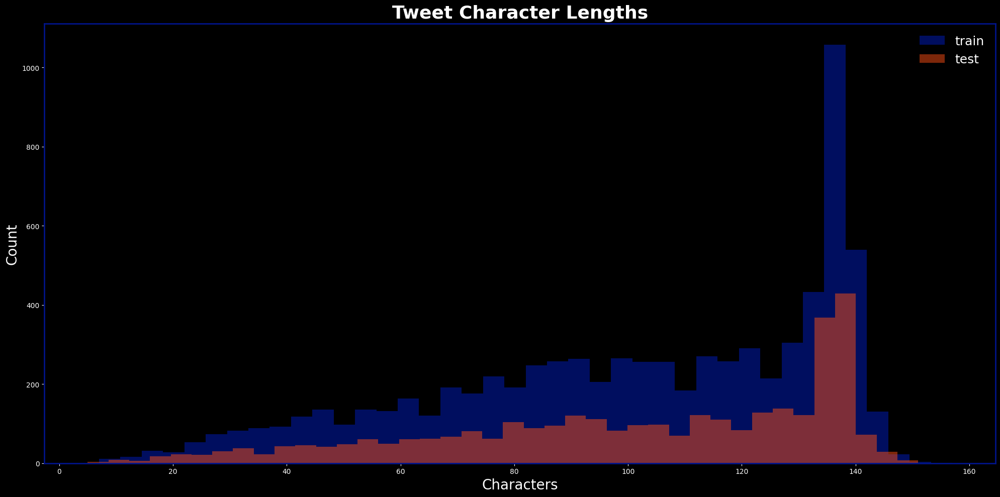


----------------------------------------------------------------------


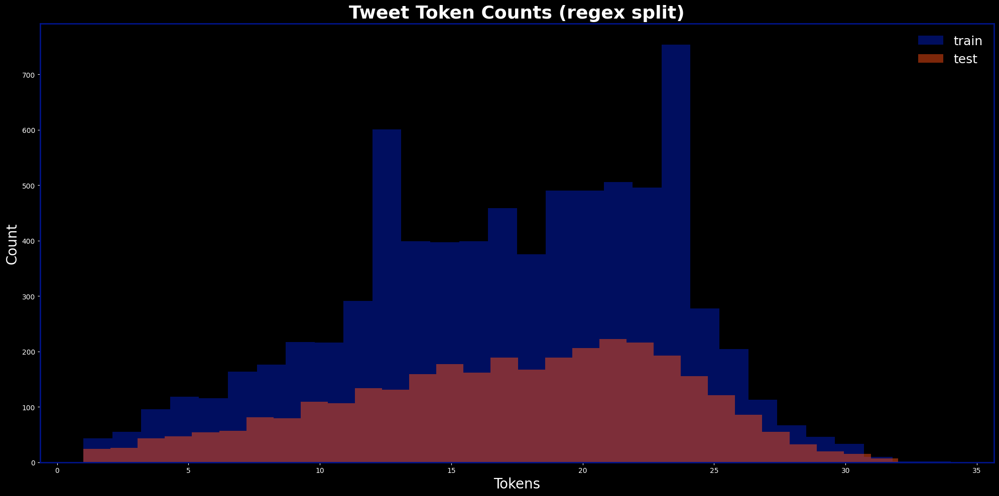


----------------------------------------------------------------------


In [8]:
# Count various text patterns.
url_re     = re.compile(r"https?://\S+", flags=re.IGNORECASE)
mention_re = re.compile(r"(?<!\w)@\w+")
hashtag_re = re.compile(r"(?<!\w)#\w+")
token_re   = re.compile(r"\w+|[#@]\w+")
def n_urls(s: str) -> int:
    return 0 if not s else len(url_re.findall(s))
def n_mentions(s: str) -> int:
    return 0 if not s else len(mention_re.findall(s))
def n_hashtags(s: str) -> int:
    return 0 if not s else len(hashtag_re.findall(s))
def n_tokens(s: str) -> int:
    return 0 if not s else len(token_re.findall(s))
def n_emojis(s: str) -> int:
    if not s:
        return 0
    try:
        return len(emoji.emoji_list(s))
    except Exception:
        return sum(1 for ch in s if ord(ch) >= 0x1F300 and ord(ch) <= 0x1FAFF)

# Compute text length distributions for train and test sets.
train_text = train_df[TEXT_COL].fillna("")
test_text  = test_df[TEXT_COL].fillna("")
len_chars_train = train_text.str.len()
len_chars_test  = test_text.str.len()
len_tokens_train = train_text.apply(n_tokens)
len_tokens_test  = test_text.apply(n_tokens)

# Calculate and display the prevalence of various "noise" features.
print("-" * 70)
print("\n--- Noise Feature Rates ---")
def any_gt0(series) -> pd.Series:
    return series.gt(0)
train_text = train_df[TEXT_COL].fillna("")
test_text  = test_df[TEXT_COL].fillna("")
features = {
    "has_url":     any_gt0(train_text.apply(n_urls)),
    "has_mention": any_gt0(train_text.apply(n_mentions)),
    "has_hashtag": any_gt0(train_text.apply(n_hashtags)),
    "has_emoji":   any_gt0(train_text.apply(n_emojis)),
}
features_test = {
    "has_url":     any_gt0(test_text.apply(n_urls)),
    "has_mention": any_gt0(test_text.apply(n_mentions)),
    "has_hashtag": any_gt0(test_text.apply(n_hashtags)),
    "has_emoji":   any_gt0(test_text.apply(n_emojis)),
}
features["has_exclaim"]      = train_text.str.contains("!", regex=False).astype(int)
features_test["has_exclaim"] = test_text.str.contains("!", regex=False).astype(int)
features["has_question"]     = train_text.str.contains(r"\?", regex=True).astype(int)
features_test["has_question"] = test_text.str.contains(r"\?", regex=True).astype(int)
features["has_digit"]        = train_text.str.contains(r"\d").astype(int)
features_test["has_digit"] = test_text.str.contains(r"\d").astype(int)
features["has_punct_other"]      = train_text.str.contains(r"[\"#$%&'()*+,\-./:;<=>@\[\\\]^_`{|}~]").astype(int)
features_test["has_punct_other"] = test_text.str.contains(r"[\"#$%&'()*+,\-./:;<=>@\[\\\]^_`{|}~]").astype(int)
order = ["has_url","has_mention","has_hashtag","has_emoji",
        "has_exclaim","has_question","has_digit","has_punct_other"]
train_rates = {k: float(pd.Series(features[k]).mean()) for k in order}
test_rates  = {k: float(pd.Series(features_test[k]).mean()) for k in order}
summary = pd.DataFrame({
    "Feature": order,
    "Train %": [f"{100*train_rates[k]:.1f}%" for k in order],
    "Test %":  [f"{100*test_rates[k]:.1f}%"  for k in order],
}).set_index("Feature")
display(
    summary.style
        .set_properties(**{"background-color": "#0b0b0b", "color": "#F8F8F8", "border-color": "#001489"})
        .set_table_styles([
            {"selector": "th", "props": [("background-color", "#001489"), ("color", "white"), ("text-align", "left")]},
            {"selector": "td", "props": [("border", "1px solid #001489")]}
        ])
)
print("\n" + ("-" * 70))

# Histogram of tweet character lengths.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.hist(len_chars_train, bins=40, alpha=0.7, edgecolor="none", label="train", color="#001489")
ax.hist(len_chars_test,  bins=40, alpha=0.5, edgecolor="none", label="test",  color="#FB4F14")
ax.set_title("Tweet Character Lengths", fontsize=26, fontweight='bold', color="white", pad=8)
ax.set_xlabel("Characters", fontsize=20, color="white")
ax.set_ylabel("Count", fontsize=20, color="white")
ax.tick_params(colors="white")
for spine in ax.spines.values():
    spine.set_edgecolor("#001489")
    spine.set_linewidth(2)
ax.set_facecolor("black")
ax.legend(frameon=False, fontsize=18, facecolor="black", labelcolor="white")
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

# Histogram of tweet token counts.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.hist(len_tokens_train, bins=30, alpha=0.7, edgecolor="none", label="train", color="#001489")
ax.hist(len_tokens_test,  bins=30, alpha=0.5, edgecolor="none", label="test",  color="#FB4F14")
ax.set_title("Tweet Token Counts (regex split)", fontsize=26, fontweight='bold',color="white", pad=8)
ax.set_xlabel("Tokens", fontsize=20, color="white")
ax.set_ylabel("Count", fontsize=20, color="white")
ax.tick_params(colors="white")
for spine in ax.spines.values():
    spine.set_edgecolor("#001489")
    spine.set_linewidth(2)
ax.set_facecolor("black")
ax.legend(frameon=False, fontsize=18, facecolor="black", labelcolor="white")
plt.tight_layout()
plt.show()

# Clean up large temporary objects from memory.
del len_chars_train, len_chars_test, len_tokens_train, len_tokens_test
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">3.5 Cleaning &amp; Feature Engineering</h3>
  <p>
    The final step in this section is to perform a standardized cleaning pass and create several new feature columns. This process creates a new <code>text_clean</code> column for use with traditional models like TF-IDF, while leaving the original <code>text</code> column untouched for Transformer models. It also generates binary flags that allow models to learn from the presence of certain text structures without relying on brittle rules.
  </p>
  <ul style="margin:6px 0 0 18px;">
    <li><b>Hashtags:</b> The "#" is dropped but the token is kept (<code>#fires → fires</code>), and a <code>has_hashtag</code> flag is set.</li>
    <li><b>Mentions:</b> Twitter handles (<code>@user</code>) are removed, and a <code>has_mention</code> flag is set.</li>
    <li><b>URLs:</b> All hyperlinks are replaced with a special <code>URL</code> token, and a <code>has_url</code> flag is set.</li>
    <li><b>Metadata Flags:</b> Binary flags (<code>has_keyword</code>, <code>has_location</code>) are created to indicate the presence of this metadata.</li>
    <li><b>No Lowercasing:</b> This pass does not convert text to lowercase, preserving the original casing for more advanced models to interpret.</li>
  </ul>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [9]:
# Compile regex patterns once for efficiency.
HASHTAG_RE = re.compile(r"#(\w+)")
MENTION_RE = re.compile(r"(?<!\w)@\w+")
URL_RE = re.compile(r"(https?://\S+|\bwww\.\S+)", flags=re.IGNORECASE)

# Create a series of text processing and feature extraction functions.
def normalize_hashtags(s: str):
    if not s:
        return "", 0
    has_flag = 1 if HASHTAG_RE.search(s) else 0
    return HASHTAG_RE.sub(r"\1", s), has_flag

def strip_mentions(s: str):
    if not s:
        return "", 0
    has_flag = 1 if MENTION_RE.search(s) else 0
    return MENTION_RE.sub(" ", s), has_flag

def tag_urls(s: str):
    if not s:
        return "", 0
    has_flag = 1 if URL_RE.search(s) else 0
    return URL_RE.sub(" URL ", s), has_flag

def count_emojis(s: str) -> int:
    if not s:
        return 0
    try:
        return len(emoji.emoji_list(s))
    except Exception:
        return sum(1 for ch in s if 0x1F300 <= ord(ch) <= 0x1FAFF)

def clean_one(s: str):
    s = "" if pd.isna(s) else str(s)
    s1, f_hash = normalize_hashtags(s)
    s2, f_mnt  = strip_mentions(s1)
    s3, f_url  = tag_urls(s2)
    f_emoji    = 1 if count_emojis(s3) > 0 else 0
    s3 = re.sub(r"\s+", " ", s3).strip()
    return s3, f_hash, f_mnt, f_url, f_emoji

# Create a main function to apply all cleaning steps to a DataFrame.
def apply_clean(df: pd.DataFrame, text_col: str) -> pd.DataFrame:
    texts = df[text_col].astype(str).fillna("")
    outs  = texts.apply(clean_one)
    df = df.copy()
    df["text_clean"]  = outs.apply(lambda t: t[0])
    df["has_hashtag"] = outs.apply(lambda t: t[1]).astype("int8")
    df["has_mention"] = outs.apply(lambda t: t[2]).astype("int8")
    df["has_url"]     = outs.apply(lambda t: t[3]).astype("int8")
    df["has_emoji"]   = outs.apply(lambda t: t[4]).astype("int8")
    return df

# Apply the cleaning process to both the training and test DataFrames.
train_df = apply_clean(train_df, TEXT_COL)
test_df  = apply_clean(test_df,  TEXT_COL)

# Report the rates of the newly created features.
print("Cleaning complete.")
print(f"text_clean non-empty (train): {(train_df['text_clean'].str.len() > 0).mean():.3f}")
print(f"has_hashtag rate (train):     {train_df['has_hashtag'].mean():.3f}")
print(f"has_mention rate (train):     {train_df['has_mention'].mean():.3f}")
print(f"has_url rate (train):         {train_df['has_url'].mean():.3f}")
print(f"has_emoji rate (train):       {train_df['has_emoji'].mean():.3f}")

# Create binary flags for the presence of keyword and location metadata.
train_df["has_keyword"]  = train_df[KEYWORD_COL].notna().astype("int8")
train_df["has_location"] = train_df[LOC_COL].notna().astype("int8")
test_df["has_keyword"]   = test_df[KEYWORD_COL].notna().astype("int8")
test_df["has_location"]  = test_df[LOC_COL].notna().astype("int8")
print(f"has_keyword rate (train):     {train_df['has_keyword'].mean():.3f}")
print(f"has_location rate (train):    {train_df['has_location'].mean():.3f}")
print("\n" + ("-" * 70))

Cleaning complete.
text_clean non-empty (train): 1.000
has_hashtag rate (train):     0.229
has_mention rate (train):     0.262
has_url rate (train):         0.522
has_emoji rate (train):       0.001
has_keyword rate (train):     0.992
has_location rate (train):    0.667

----------------------------------------------------------------------


### **Observation: Data Loading and Audit**

The initial data loading and audit reveal a well-structured but noisy dataset. While the core files are intact and schemas are correct, this audit highlights key characteristics like class imbalance, significant missing metadata, and, most importantly, the presence of duplicate tweets and potential data leakage between the training and test sets.

* **Structural Integrity:**
    * All three source CSVs (`train`, `test`, `sample_submission`) loaded successfully with the expected row counts (**7,613** train and **3,263** test).
    * The verification checklist passed on all critical points: `id` columns are unique, there is no overlap between train and test IDs, and the `target` variable contains only the expected 0s and 1s.

* **Class Distribution and Metadata:**
    * The dataset is moderately imbalanced, with **57.0%** of tweets labeled as non-disaster (0) and **43.0%** as disaster (1).
    * The metadata is sparse. The `location` column is missing from a third of the data (**33.3%**), while the `keyword` column is almost entirely present (only **0.8%** missing). The missingness rates are consistent between the train and test sets.

* **Tweet Characteristics:**
    * The tweet length distributions, both by character and token count, are nearly identical for the train and test sets. This is a positive sign for model generalization.
    * A prominent peak is visible around 140 characters, which corresponds to the classic Twitter character limit.
    * Tweets are noisy: over half contain URLs (**~52%**), and roughly a quarter contain either @mentions (**~26%**) or #hashtags (**~23%**).

* **Duplicates and Data Leakage (Key Finding):**
    * The text integrity check uncovered a significant number of duplicates. While there are **110** rows with exact duplicate text, this number increases to **701** rows when the text is normalized (by lowercasing and removing URLs/mentions).
    * Crucially, the analysis of these duplicates shows that some identical tweets have been given **conflicting labels** (e.g., the same text is labeled as both disaster and non-disaster), highlighting the noisy and subjective nature of the dataset.
    * There are **280** normalized tweets that appear in **both the train and test sets**. This represents a potential source of data leakage that must be considered during validation and modeling.

**Conclusion:**
The dataset is loaded and structurally sound, but it presents several classic NLP challenges. The class imbalance is manageable, but the high rate of missing location data, noisy duplicate entries with conflicting labels, and the text overlap between train and test sets are all important factors to address in the modeling stages. The feature engineering in the final step has successfully created a `text_clean` column and a set of useful binary flags, preparing the data for the next phase of analysis.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FB4F14; border-right: 8px solid #001489;">
  <h2 style="color: #001489;">Section 4: Visual Exploratory Data Analysis (EDA)</h2>

  <p>
    Before building any models, a thorough visual exploration of the data is essential for understanding the target variable, text structure, and potential predictive signals.
  </p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>Target and field coverage:</b> Investigate class balance and the completeness of the <code>keyword</code> and <code>location</code> fields.</li>
    <li><b>Text length distributions:</b> Compare character and token counts by class.</li>
    <li><b>Symbols and structure:</b> Analyze the rates of hashtags, mentions, URLs, and punctuation by class.</li>
    <li><b>Word clouds by class:</b> Visualize the most prominent terms for each class.</li>
    <li><b>Top n-grams:</b> Identify the most frequent and discriminative unigrams and bigrams.</li>
    <li><b>Keyword lift:</b> Measure the predictive power of the most common keywords.</li>
    <li><b>Similarity map:</b> Project the dataset into 2D to visualize class separation.</li>
    <li><b>Outliers and near duplicates:</b> Surface unusual examples and highly similar tweet pairs.</li>
  </ol>

  <hr style="border: none; border-top: 8px solid #001489; margin: 10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">4.1 Target and Field Coverage</h3>
  <p>
    The first step in the visual EDA is to confirm the target balance and understand the coverage of the optional <code>keyword</code> and <code>location</code> fields. A Chi-square test is also used to check if the missingness of this metadata is correlated with the target variable.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------
rows: 7,613 | pos: 3,271 (42.97%) | neg: 4,342
keyword coverage: 99.20% | unique keywords: 221
location coverage: 66.73% | unique locations: 3,341
----------------------------------------------------------------------

Field Coverage
  keyword  : 99.20% non-null | 221 unique
  location : 66.73% non-null | 3,341 unique
----------------------------------------------------------------------

Chi-square (Missingness ~ Target)
keyword  p-value: 7.162e-05
keyword  False  True 
target               
0         4323     19
1         3229     42
location p-value: 5.285e-01
location  False  True 
target                
0          2884   1458
1          2196   1075

----------------------------------------------------------------------


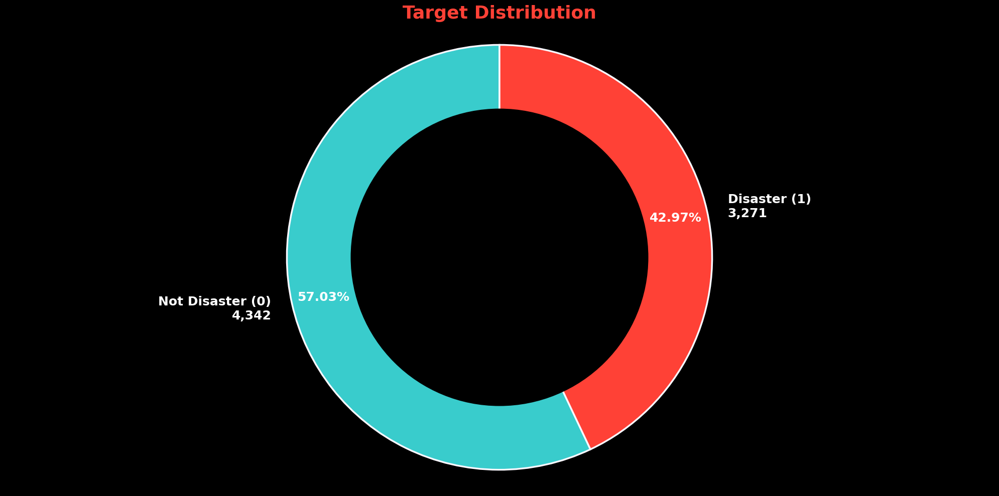


----------------------------------------------------------------------


In [10]:
# Calculate basic counts for the target variable.
n_rows = len(train_df)
pos = int((train_df[Y_COL] == 1).sum())
neg = n_rows - pos
pos_rate = pos / n_rows if n_rows else 0.0
print("-" * 70)
print(f"rows: {n_rows:,} | pos: {pos:,} ({pos_rate:.2%}) | neg: {neg:,}")

# Calculate the coverage and number of unique values for metadata fields.
kw_nonnull = train_df[KEYWORD_COL].notna().mean()
loc_nonnull = train_df[LOC_COL].notna().mean()
kw_unique = train_df[KEYWORD_COL].dropna().astype(str).nunique()
loc_unique = train_df[LOC_COL].dropna().astype(str).nunique()
print(f"keyword coverage: {kw_nonnull:.2%} | unique keywords: {kw_unique:,}")
print(f"location coverage: {loc_nonnull:.2%} | unique locations: {loc_unique:,}")
print("-" * 70)
print("\nField Coverage")
print(f"  keyword  : {kw_nonnull:.2%} non-null | {kw_unique:,} unique")
print(f"  location : {loc_nonnull:.2%} non-null | {loc_unique:,} unique")
print("-" * 70)

# Perform a Chi-square test to check if missingness is related to the target.
def chi2_missing(df, col):
    tbl = pd.crosstab(df[Y_COL], df[col].isna())
    from scipy.stats import chi2_contingency
    _, p, _, _ = chi2_contingency(tbl)
    return p, tbl
p_kw, tbl_kw = chi2_missing(train_df, KEYWORD_COL)
p_loc, tbl_loc = chi2_missing(train_df, LOC_COL)
print("\nChi-square (Missingness ~ Target)")
print("keyword  p-value:", f"{p_kw:.3e}")
print(tbl_kw)
print("location p-value:", f"{p_loc:.3e}")
print(tbl_loc)
print("\n" + ("-" * 70))

# --- Plot: Class Balance Donut Chart ---
# Prepare the data and labels for the pie chart.
class_counts = pd.Series([neg, pos], index=[0, 1])
labels = [f'Not Disaster (0)\n{neg:,}', f'Disaster (1)\n{pos:,}']
colors = ['#39CCCC', '#FF4136']

# Create the figure and axes.
fig, ax = plt.subplots(figsize=(20, 10), facecolor='black')
fig.patch.set_facecolor('black')

# Plot the outer ring of the donut chart.
wedges, texts, autotexts = ax.pie(
    class_counts, 
    labels=labels, 
    colors=colors, 
    autopct='%1.2f%%',
    startangle=90, 
    pctdistance=0.85, 
    textprops={'fontsize': 18, 'fontweight': 'bold', 'color': 'white'},
    wedgeprops={'edgecolor': 'ghostwhite', 'linewidth': 2.5}
)

# Draw a circle in the center to create the donut effect.
centre_circle = plt.Circle((0,0), 0.70, fc='black')
ax.add_artist(centre_circle)

# Set the title.
ax.set_title("Target Distribution", fontsize=26, color='#FF4136', fontweight='bold', pad=8)

# Ensure the plot is a circle.
ax.axis('equal')

# Ensure the layout is tight and clean.
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">4.2 Text Length Distributions</h3>
  <p>
    Next, it's useful to see if tweet length differs between the two classes, as this could be a simple but powerful feature. The histograms below compare the distributions of character and token counts for disaster and non-disaster tweets, with markers for the mean and median of each group.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------
Character Length (Mean | Median | p95)
  class 0: 95 | 101 | 139
  class 1: 108 | 115 | 140

Token Length (Mean | Median | p95)
  class 0: 14 | 15 | 25
  class 1: 15 | 15 | 23
----------------------------------------------------------------------


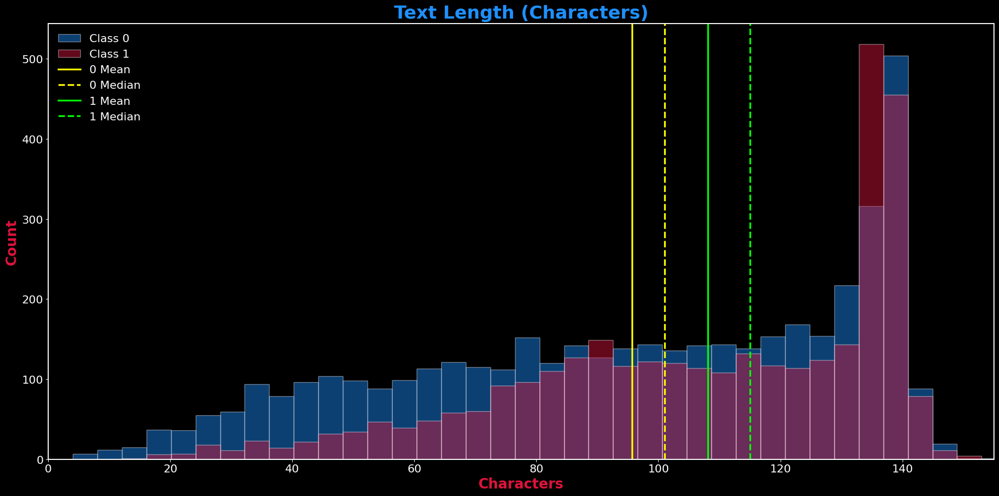


----------------------------------------------------------------------


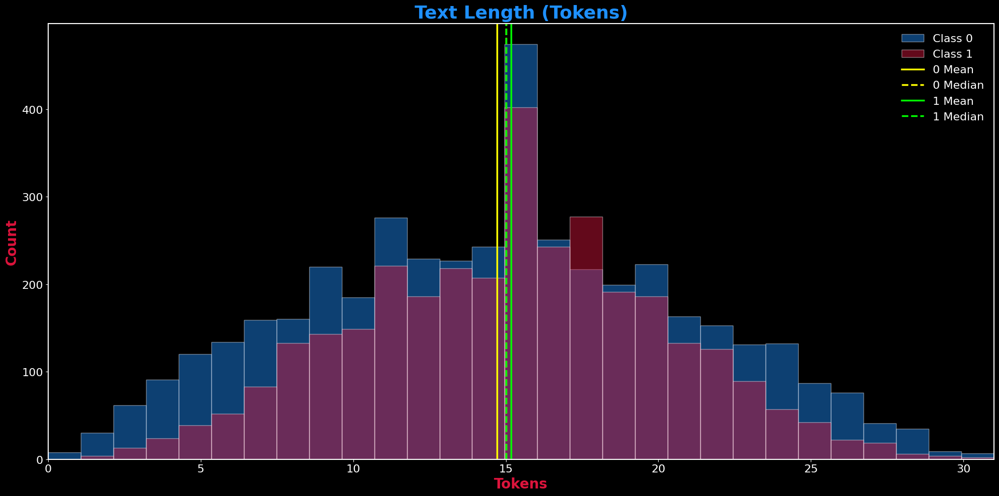


----------------------------------------------------------------------


In [11]:
# Calculate character and token lengths for each tweet.
char_len   = train_df[TEXT_COL].astype(str).str.len()
token_len  = train_df[TEXT_COL].astype(str).str.split().str.len().astype(int)
y          = train_df[Y_COL].astype(int)

# Separate the length data by class.
chars0 = char_len[y == 0].to_numpy()
chars1 = char_len[y == 1].to_numpy()
toks0  = token_len[y == 0].to_numpy()
toks1  = token_len[y == 1].to_numpy()

# Calculate and print summary statistics for length distributions.
def _summ(a):
    a = np.asarray(a)
    return int(np.mean(a)), int(np.median(a)), int(np.percentile(a, 95))
c0_mean, c0_med, c0_p95 = _summ(chars0)
c1_mean, c1_med, c1_p95 = _summ(chars1)
t0_mean, t0_med, t0_p95 = _summ(toks0)
t1_mean, t1_med, t1_p95 = _summ(toks1)
print("-" * 70)
print("Character Length (Mean | Median | p95)")
print(f"  class 0: {c0_mean} | {c0_med} | {c0_p95}")
print(f"  class 1: {c1_mean} | {c1_med} | {c1_p95}")
print("\nToken Length (Mean | Median | p95)")
print(f"  class 0: {t0_mean} | {t0_med} | {t0_p95}")
print(f"  class 1: {t1_mean} | {t1_med} | {t1_p95}")
print("-" * 70)

# Prepare data for plotting.
txt_series = train_df[TEXT_COL].astype(str)
y_series   = train_df[Y_COL].astype(int)
len_chars_0 = txt_series[y_series == 0].str.len().to_numpy()
len_chars_1 = txt_series[y_series == 1].str.len().to_numpy()
len_tokens_0 = txt_series[y_series == 0].str.split().apply(len).to_numpy()
len_tokens_1 = txt_series[y_series == 1].str.split().apply(len).to_numpy()

# Create a helper function to define histogram bins.
def make_bins(arr0, arr1, n=40):
    top = max(int(np.max(arr0)) if len(arr0) else 0,
            int(np.max(arr1)) if len(arr1) else 0)
    top = max(top, 1)
    return np.linspace(0, top, n)

# --- Plot A: Character lengths ---
# Define the bins for the character length histogram.
bins_chars = make_bins(len_chars_0, len_chars_1, n=40)

# Create the figure and axes.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the histograms for each class.
ax.hist(len_chars_0, bins=bins_chars, alpha=0.45, label="Class 0", color="dodgerblue", edgecolor="ghostwhite")
ax.hist(len_chars_1, bins=bins_chars, alpha=0.45, label="Class 1", color="crimson", edgecolor="ghostwhite")

# Calculate and plot lines for the mean and median of each class.
m0, d0 = np.mean(len_chars_0), np.median(len_chars_0)
m1, d1 = np.mean(len_chars_1), np.median(len_chars_1)
ax.axvline(m0, color="yellow", linewidth=2.5, linestyle="-",  label="0 Mean")
ax.axvline(d0, color="yellow", linewidth=2.5, linestyle="--", label="0 Median")
ax.axvline(m1, color="lime", linewidth=2.5, linestyle="-",  label="1 Mean")
ax.axvline(d1, color="lime", linewidth=2.5, linestyle="--", label="1 Median")

# Style the plot titles, labels, ticks, and spines.
ax.set_title("Text Length (Characters)", fontsize=26, color="dodgerblue", fontweight="bold", pad=8)
ax.set_xlabel("Characters", fontsize=20, color="crimson", fontweight="bold")
ax.set_ylabel("Count", fontsize=20, color="crimson", fontweight="bold")
ax.set_xlim(0, 155)
ax.tick_params(axis='x', colors='white', labelsize=16)
ax.tick_params(axis='y', colors='white', labelsize=16)
for spine in ax.spines.values():
    spine.set_edgecolor("white")
    spine.set_linewidth(1.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white")

# Display the plot.
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

# --- Plot B: Token counts ---
# Define the bins for the token length histogram.
bins_tokens = make_bins(len_tokens_0, len_tokens_1, n=30)

# Create the figure and axes.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the histograms for each class.
ax.hist(len_tokens_0, bins=bins_tokens, alpha=0.45, label="Class 0", color="dodgerblue", edgecolor="ghostwhite")
ax.hist(len_tokens_1, bins=bins_tokens, alpha=0.45, label="Class 1", color="crimson", edgecolor="ghostwhite")

# Calculate and plot lines for the mean and median of each class.
m0t, d0t = np.mean(len_tokens_0), np.median(len_tokens_0)
m1t, d1t = np.mean(len_tokens_1), np.median(len_tokens_1)
ax.axvline(m0t, color="yellow", linewidth=2.5, linestyle="-",  label="0 Mean")
ax.axvline(d0t, color="yellow", linewidth=2.5, linestyle="--", label="0 Median")
ax.axvline(m1t, color="lime", linewidth=2.5, linestyle="-",  label="1 Mean")
ax.axvline(d1t, color="lime", linewidth=2.5, linestyle="--", label="1 Median")

# Style the plot titles, labels, ticks, and spines.
ax.set_title("Text Length (Tokens)", fontsize=26, color="dodgerblue", fontweight="bold", pad=8)
ax.set_xlabel("Tokens", fontsize=20, color="crimson", fontweight="bold")
ax.set_ylabel("Count", fontsize=20, color="crimson", fontweight="bold")
ax.set_xlim(0, 31)
ax.tick_params(axis='x', colors='white', labelsize=16)
ax.tick_params(axis='y', colors='white', labelsize=16)
for spine in ax.spines.values():
    spine.set_edgecolor("white")
    spine.set_linewidth(1.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white")

# Display the plot.
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;"> <h3 style="color:#FB4F14;">4.3 Symbols &amp; Structure</h3>

<p>Tweets are full of structured noise like URLs, @mentions, and #hashtags. This analysis checks whether the presence of these symbols, along with common punctuation, differs between disaster and non-disaster tweets. The plots below show the rate at which these features appear in each class.</p>

<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

----------------------------------------------------------------------


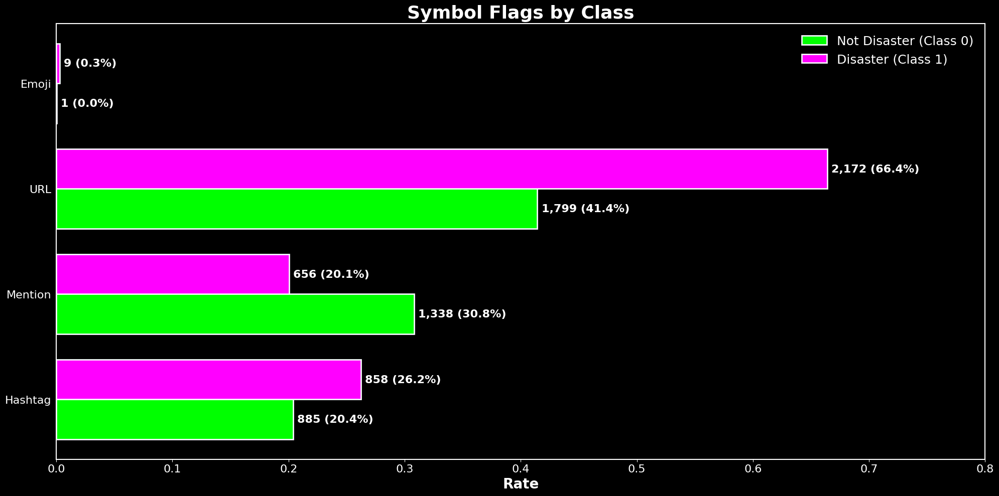


----------------------------------------------------------------------


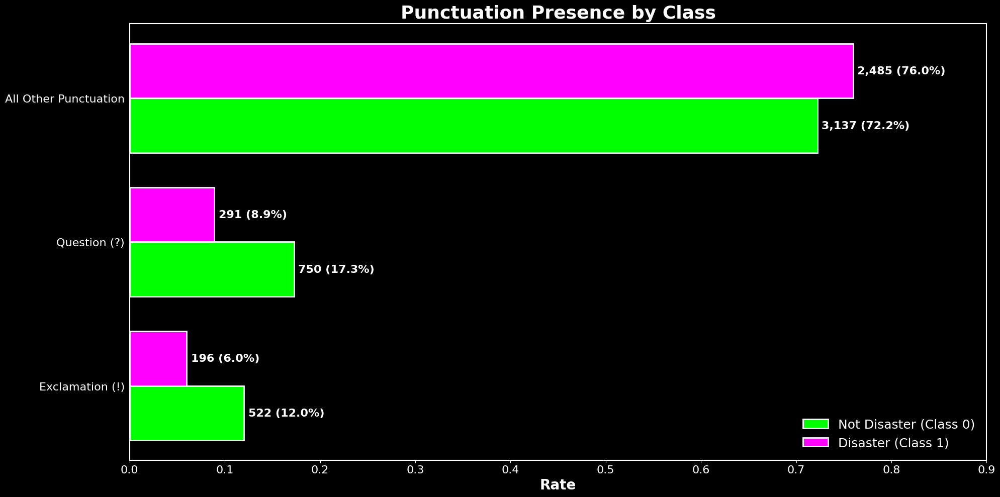


----------------------------------------------------------------------


In [12]:
# Use the feature flag columns created in Section 3.5.
s_text  = train_df["text_clean"].astype(str)
y       = train_df[Y_COL].astype(int)
f_hash  = train_df["has_hashtag"].astype(int)
f_mnt   = train_df["has_mention"].astype(int)
f_url   = train_df["has_url"].astype(int)

# Create a feature flag for emojis from the raw text.
def _has_emoji(s: str) -> int:
    try:
        return 1 if emoji.emoji_list(s) else 0
    except Exception:
        return 1 if re.search(r"[\U0001F300-\U0001FAFF\u2600-\u27BF]", s) else 0
f_emoji = train_df[TEXT_COL].astype(str).apply(_has_emoji).astype(int)

# Create feature flags for common punctuation.
f_excl  = s_text.str.contains("!", regex=False).astype(int)
f_qmark = s_text.str.contains(r"\?", regex=True).astype(int)
f_punct = s_text.str.contains(r"[\"#$%&'()*+,\-./:;<=>@\[\\\]^_`{|}~]", regex=True).astype(int)

# Calculate counts and rates by class for a given feature.
def counts_rates(flag_series, y):
    m0 = (y == 0); m1 = (y == 1)
    n0 = int(m0.sum()); n1 = int(m1.sum())
    c0 = int(flag_series[m0].sum()); c1 = int(flag_series[m1].sum())
    r0 = c0 / n0 if n0 else 0.0
    r1 = c1 / n1 if n1 else 0.0
    return (c0, r0), (c1, r1)

# --- Plot A: Hashtag / Mention / URL / Emoji ---
print("-" * 70)
# Aggregate the data for the first plot.
A = [
    ("Hashtag", f_hash),
    ("Mention", f_mnt),
    ("URL",     f_url),
    ("Emoji",   f_emoji),
]
labels_A = [name for name, _ in A]
c0A, r0A, c1A, r1A = [], [], [], []
for _, series in A:
    (c0, r0), (c1, r1) = counts_rates(series, y)
    c0A.append(c0); r0A.append(r0)
    c1A.append(c1); r1A.append(r1)

# Create the figure and axes for the grouped bar chart.
ypos = np.arange(len(labels_A)); h = 0.38
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the horizontal bars for each class.
b0 = ax.barh(ypos - h/2, r0A, height=h, label="Not Disaster (Class 0)", color="lime",
            edgecolor="ghostwhite", linewidth=2.0)
b1 = ax.barh(ypos + h/2, r1A, height=h, label="Disaster (Class 1)", color="magenta",
            edgecolor="ghostwhite", linewidth=2.0)

# Style the plot titles, labels, and ticks.
ax.set_title("Symbol Flags by Class", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_yticks(ypos)
ax.set_yticklabels(labels_A, fontsize=16, color="white")
ax.set_xlabel("Rate", fontsize=20, color="white", fontweight="bold")
ax.set_xlim(0, 0.8)
ax.tick_params(axis='x', colors='white', labelsize=16)
for s in ax.spines.values():
    s.set_edgecolor("white")
    s.set_linewidth(1.5)

# Annotate the bars with counts and percentages.
for bars, counts, rates in [(b0, c0A, r0A), (b1, c1A, r1A)]:
    for bar, c, r in zip(bars, counts, rates):
        w = bar.get_width()
        y0 = bar.get_y() + bar.get_height()/2
        ax.annotate(f"{c:,} ({100*r:.1f}%)", (w, y0),
                    xytext=(6, 0), textcoords="offset points",
                    va="center", ha="left", fontsize=16, color="white", fontweight="bold")

# Add a legend and display the plot.
ax.legend(frameon=False, fontsize=18, labelcolor="white")
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

# --- Plot B: Punctuation (!, ?, other) ---
# Aggregate the data for the second plot.
B = [
    ("Exclamation (!)",       f_excl),
    ("Question (?)",          f_qmark),
    ("All Other Punctuation", f_punct),
]
labels_B = [name for name, _ in B]
c0B, r0B, c1B, r1B = [], [], [], []
for _, series in B:
    (c0, r0), (c1, r1) = counts_rates(series, y)
    c0B.append(c0); r0B.append(r0)
    c1B.append(c1); r1B.append(r1)

# Create the figure and axes.
ypos = np.arange(len(labels_B)); h = 0.38
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the horizontal bars for each class.
b0 = ax.barh(ypos - h/2, r0B, height=h, label="Not Disaster (Class 0)", color="lime",
            edgecolor="ghostwhite", linewidth=2.0)
b1 = ax.barh(ypos + h/2, r1B, height=h, label="Disaster (Class 1)", color="magenta",
            edgecolor="ghostwhite", linewidth=2.0)

# Style the plot and annotate the bars.
ax.set_title("Punctuation Presence by Class", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_yticks(ypos)
ax.set_yticklabels(labels_B, fontsize=16, color="white")
ax.set_xlabel("Rate", fontsize=20, color="white", fontweight="bold")
ax.set_xlim(0, 0.9)
ax.tick_params(axis='x', colors='white', labelsize=16)
for s in ax.spines.values():
    s.set_edgecolor("white")
    s.set_linewidth(1.5)
for bars, counts, rates in [(b0, c0B, r0B), (b1, c1B, r1B)]:
    for bar, c, r in zip(bars, counts, rates):
        w = bar.get_width()
        y0 = bar.get_y() + bar.get_height()/2
        ax.annotate(f"{c:,} ({100*r:.1f}%)", (w, y0),
                    xytext=(6, 0), textcoords="offset points",
                    va="center", ha="left", fontsize=16, color="white", fontweight="bold")

# Add a legend and display the plot.
ax.legend(frameon=False, fontsize=18, labelcolor="white")
plt.tight_layout()
plt.show()
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;"> <h3 style="color:#FB4F14;">4.4 Word Clouds by Class</h3>

<p>Word clouds offer a quick, intuitive way to see which terms are most prominent. Here, several clouds are generated from the cleaned text to compare the vocabulary of disaster vs. non-disaster tweets. Stopwords are customized for Twitter (e.g., adding "URL" and "rt"), and collocations are turned off to focus on individual words.</p>

<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

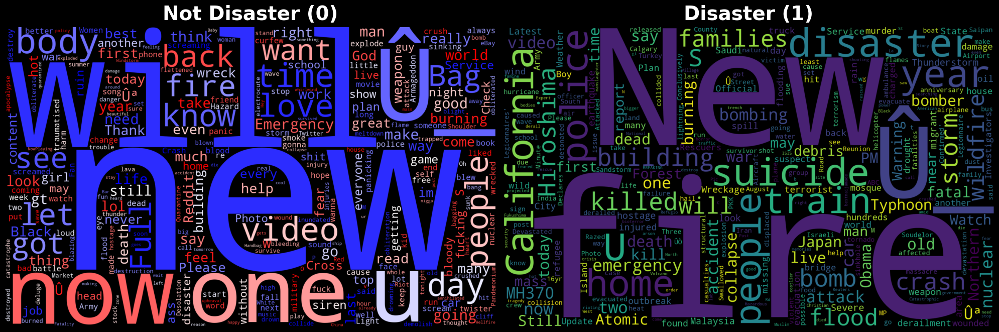

Word Clouds Generated | class-0 tweets: 4,342 | class-1 tweets: 3,271 | Stopwords=200

----------------------------------------------------------------------


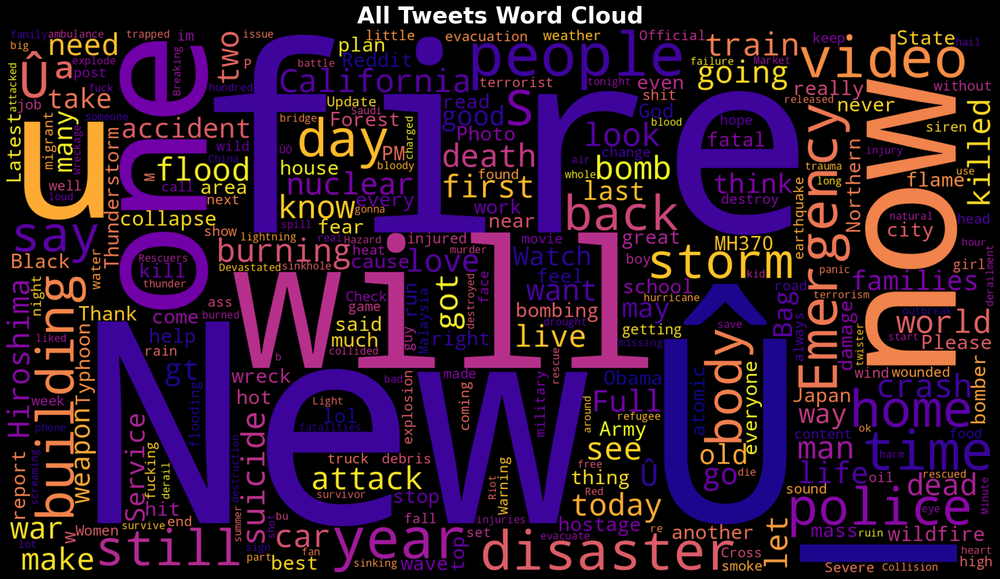

All-Tweet Cloud | Tokens≈110,961 | Stopwords=200

----------------------------------------------------------------------


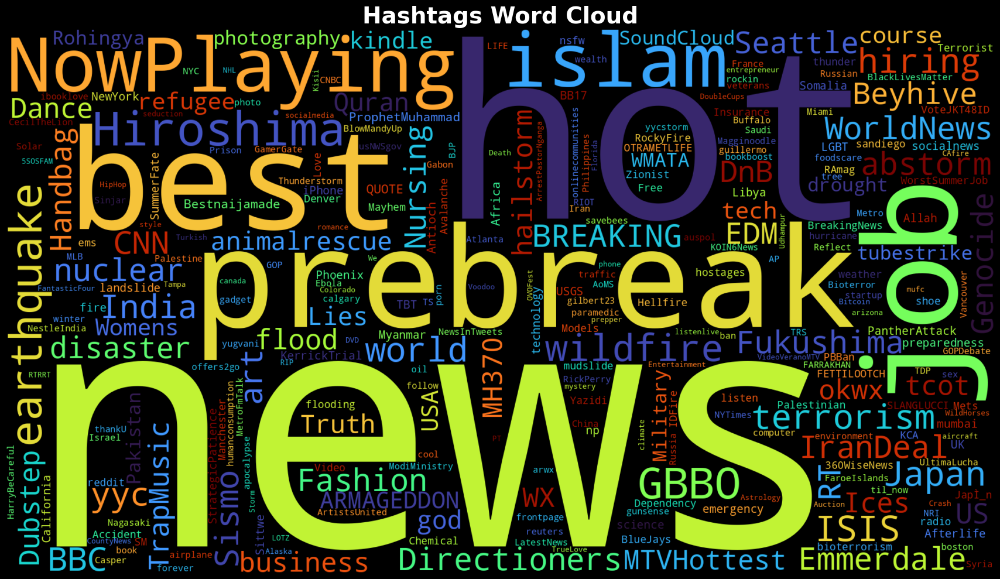

Hashtag Cloud | Rows with Hashtags: 23.13%

----------------------------------------------------------------------


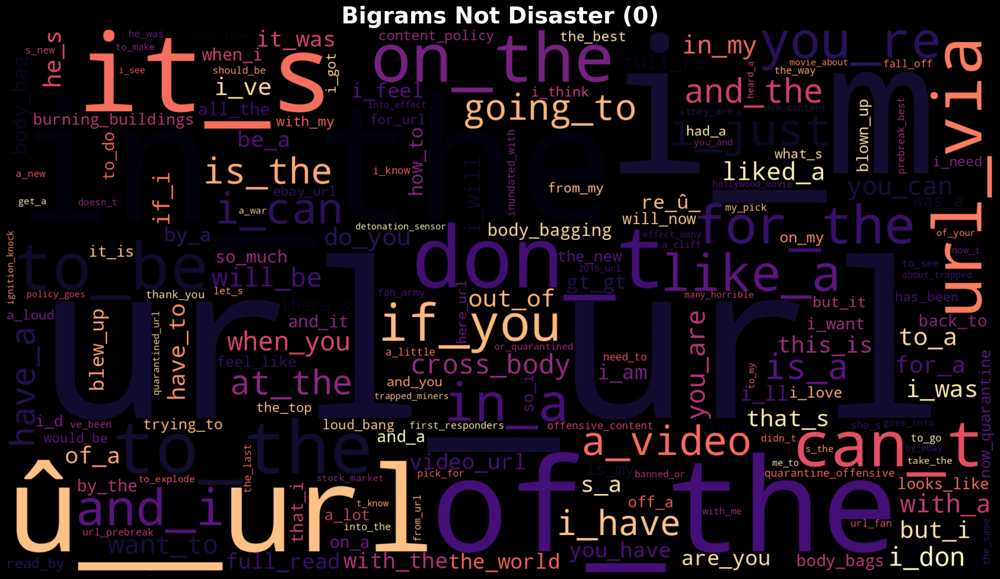

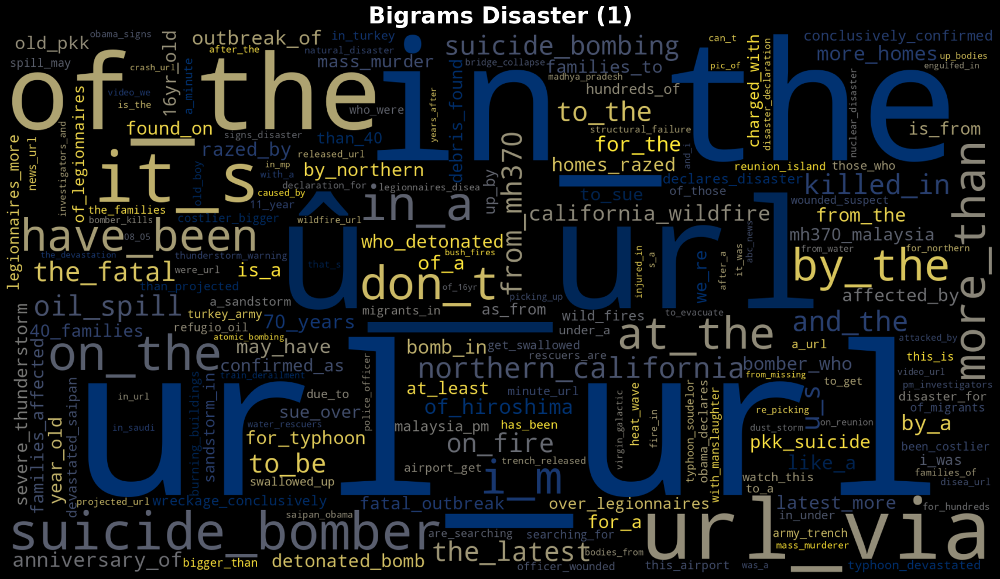

Bigram Clouds | Unique bi-grams: class0=400, class1=400

----------------------------------------------------------------------


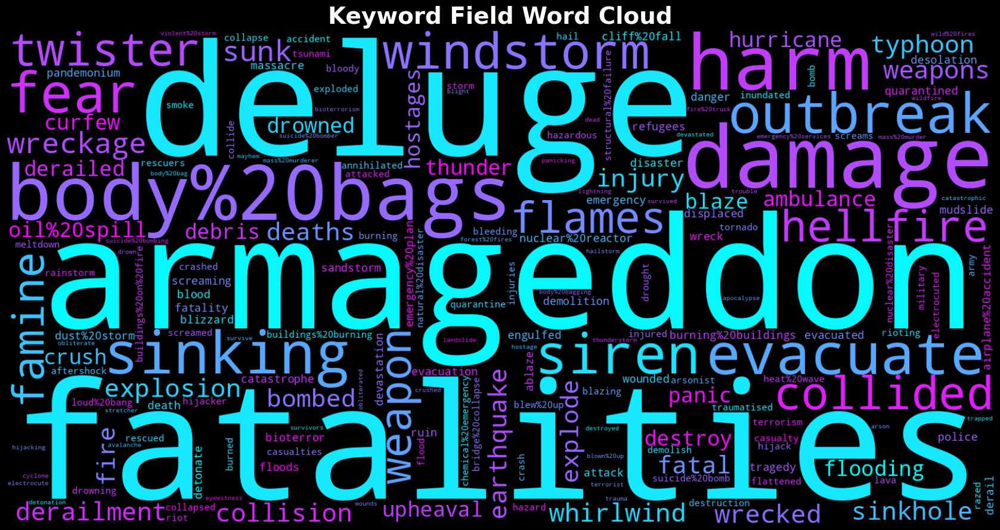

Keyword Cloud | Unique Keywords: 221 | top5: ['fatalities', 'deluge', 'armageddon', 'damage', 'body%20bags']

----------------------------------------------------------------------


In [13]:
# Select the cleaned text column for analysis.
TEXT_FOR_CLOUD = "text_clean" if "text_clean" in train_df.columns else TEXT_COL

# Custom set of stopwords for Twitter data.
_base_sw = set(WordCloud().stopwords)
_extra_sw = {"url", "URL", "https", "http", "co", "amp", "rt", "RT", "via"}
stopwords_wc = _base_sw.union(_extra_sw)

# Single string corpus for each class.
neg_text = " ".join(train_df.loc[train_df[Y_COL] == 0, TEXT_FOR_CLOUD].dropna().astype(str))
pos_text = " ".join(train_df.loc[train_df[Y_COL] == 1, TEXT_FOR_CLOUD].dropna().astype(str))

# Common parameters for the word clouds.
wc_kwargs = dict(
    width=1800, height=1100,
    background_color="black",
    stopwords=stopwords_wc,
    collocations=False,
    max_words=300,
    random_state=SEED,
)

# Generate the word clouds for each class.
wc_neg = WordCloud(colormap="bwr", **wc_kwargs).generate(neg_text)
wc_pos = WordCloud(colormap="viridis", **wc_kwargs).generate(pos_text)

# Figure with two subplots to display the word clouds side-by-side.
fig, axes = plt.subplots(1, 2, figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")

# Display the Not Disaster word cloud.
axes[0].imshow(wc_neg, interpolation="bilinear")
axes[0].axis("off")
axes[0].set_title("Not Disaster (0)", fontsize=28, color="white", fontweight="bold", pad=10)
for s in axes[0].spines.values():
    s.set_edgecolor("white")
    s.set_linewidth(2)

# Display the Disaster word cloud.
axes[1].imshow(wc_pos, interpolation="bilinear")
axes[1].axis("off")
axes[1].set_title("Disaster (1)", fontsize=28, color="white", fontweight="bold", pad=10)
for s in axes[1].spines.values():
    s.set_edgecolor("white")
    s.set_linewidth(2)

# Show the final plot.
plt.tight_layout()
plt.show()
n0 = int((train_df[Y_COL] == 0).sum())
n1 = int((train_df[Y_COL] == 1).sum())
print(f"Word Clouds Generated | class-0 tweets: {n0:,} | class-1 tweets: {n1:,} | Stopwords={len(stopwords_wc)}")
print("\n" + ("-" * 70))

# --- Word cloud for all training tweets ---
# Corpus of all tweet text.
all_text = " ".join(train_df[TEXT_FOR_CLOUD].dropna().astype(str))

# Generate the word cloud.
wc_all = WordCloud(
    width=2000, height=1100,
    background_color="black",
    stopwords=stopwords_wc,
    collocations=False,
    max_words=300,
    random_state=SEED,
    colormap="plasma",
).generate(all_text)

# Create the figure and display the plot.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
ax.imshow(wc_all, interpolation="bilinear")
ax.axis("off")
ax.set_title("All Tweets Word Cloud", fontsize=28, color="white", fontweight="bold", pad=8)
plt.tight_layout()
plt.show()
print(f"All-Tweet Cloud | Tokens≈{len(all_text.split()):,} | Stopwords={len(stopwords_wc)}")
print("\n" + ("-" * 70))

# --- Word cloud for hashtags only ---
# Extract all hashtags from the original text column.
hashtags = (train_df[TEXT_COL]
            .dropna()
            .astype(str)
            .str.findall(r"#(\w+)"))
hashtags_str = " ".join((" ".join(xs) for xs in hashtags if len(xs) > 0))

# Generate the word cloud if any hashtags were found.
if hashtags_str.strip():
    wc_hash = WordCloud(
        width=2000, height=1100,
        background_color="black",
        stopwords=set(),
        collocations=False,
        max_words=300,
        random_state=SEED,
        colormap="turbo",
    ).generate(hashtags_str)

    # Create the figure and display the plot.
    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    ax.imshow(wc_hash, interpolation="bilinear")
    ax.axis("off")
    ax.set_title("Hashtags Word Cloud", fontsize=28, color="white", fontweight="bold", pad=8)
    plt.tight_layout()
    plt.show()
    print(f"Hashtag Cloud | Rows with Hashtags: {(train_df[TEXT_COL].astype(str).str.contains('#')).mean():.2%}")
else:
    print("[skip] no hashtags found in training text.")
print("\n" + ("-" * 70))

# --- Word clouds for bigrams per class ---
# Extract bigrams from a text series.
def bigrams_series(texts: pd.Series) -> pd.Series:
    toks = texts.fillna("").astype(str).str.lower().str.findall(r"\w+")
    grams = toks.apply(lambda lst: ["_".join(lst[i:i+2]) for i in range(len(lst)-2+1)] if lst else [])
    return grams.explode().dropna()

# Get the top 400 bigrams for each class.
SRC = train_df[TEXT_FOR_CLOUD]
bi0 = bigrams_series(SRC[train_df[Y_COL] == 0]).value_counts().head(400)
bi1 = bigrams_series(SRC[train_df[Y_COL] == 1]).value_counts().head(400)

# Loop through and generate a word cloud for each class's bigrams.
for title, freqs, cmap in [
    ("Bigrams Not Disaster (0)", bi0, "magma"),
    ("Bigrams Disaster (1)",     bi1, "cividis"),
]:
    if len(freqs) == 0:
        print(f"[skip] {title}: no bigrams.")
        continue
    wc = WordCloud(
        width=2000, height=1100,
        background_color="black",
        stopwords=set(),
        collocations=False,
        random_state=SEED,
        colormap=cmap,
    ).generate_from_frequencies(freqs.to_dict())

    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(title, fontsize=28, color="white", fontweight="bold", pad=8)
    plt.tight_layout()
    plt.show()
print(f"Bigram Clouds | Unique bi-grams: class0={len(bi0):,}, class1={len(bi1):,}")
print("\n" + ("-" * 70))

# --- Word cloud for the keyword field only ---
# Extract and count all non-null keywords.
kw = (train_df[KEYWORD_COL]
    .dropna()
    .astype(str)
    .str.strip())

# Generate the word cloud if any keywords exist.
if len(kw):
    freqs = kw.value_counts()
    wc_kw = WordCloud(
        width=1600, height=800,
        background_color="black",
        stopwords=set(),
        collocations=False,
        max_words=200,
        random_state=SEED,
        colormap="cool",
    ).generate_from_frequencies(freqs.to_dict())

    fig, ax = plt.subplots(figsize=(18, 9), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    ax.imshow(wc_kw, interpolation="bilinear")
    ax.axis("off")
    ax.set_title("Keyword Field Word Cloud", fontsize=28, color="white", fontweight="bold", pad=8)
    plt.tight_layout()
    plt.show()
    print(f"Keyword Cloud | Unique Keywords: {len(freqs):,} | top5: {list(freqs.index[:5])}")
else:
    print("[skip] no non-missing keywords found.")
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;"> <h3 style="color:#FB4F14;">4.5 Top n-grams by Class</h3> 

<p> Compare the strongest tokens in <code>text_clean</code> for class 0 and class 1 using horizontal bars. I show unigrams and bigrams separately, count based (no IDF), English stopwords removed, and annotate each bar with its exact frequency. Defaults: <code>TOP_K=20</code>, <code>MIN_DF=2</code>. 

**count** = how many tweets in the plotted class contain the term.  
Example: *hiroshima - 92 | ×50.75* means the term appears **92** times in class 1 (Disaster).

**lift** (how much more likely in one class vs the other):

$$
\text{lift}_{(1\;\text{vs}\;0)} \;=\; \frac{P(\text{term}\mid \text{class }1)}{P(\text{term}\mid \text{class }0)}
\qquad\text{and}\qquad
\text{lift}_{(0\;\text{vs}\;1)} \;=\; \frac{P(\text{term}\mid \text{class }0)}{P(\text{term}\mid \text{class }1)}.
$$

With Laplace/Dirichlet smoothing so zeros don’t explode:

$$
P(\text{term}\mid c) \;=\; \frac{\mathrm{count}_{\text{term},c}+1}{\sum_{t}\mathrm{count}_{t,c}+V},
$$

where $(V$) is the vocabulary size (number of distinct n-grams).

On class 1 plots we show $( \times \mathrm{lift}_{1\!:\!0} $).
On class 0 plots we show $( \times \mathrm{lift}_{1\!:\!0}^{-1} $) (i.e., how many times more likely in class 0).


The first code got hijacked by artifacts (url, amp, û_). This code cell shows what’s actually useful discriminative n-grams by class (lift / log-odds style), with the junk tokens removed.</p> 

<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

----------------------------------------------------------------------
Unigrams most indicative of class 1: northern (×70.94), legionnaires (×67.66), debris (×55.66), severe (×52.38), hiroshima (×50.75), derailment (×45.84), migrants (×45.84), investigators (×41.47)
Unigrams most indicative of class 0: bags (×20.16), bag (×18.78), aftershock (×18.33), ruin (×17.41), lmao (×15.58), disney (×15.58), career (×13.74), ebay (×13.74)
----------------------------------------------------------------------


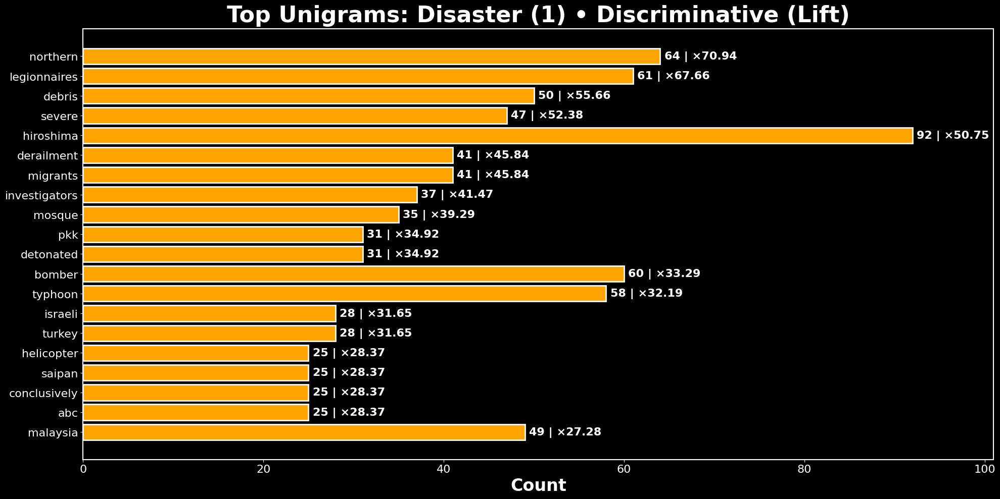

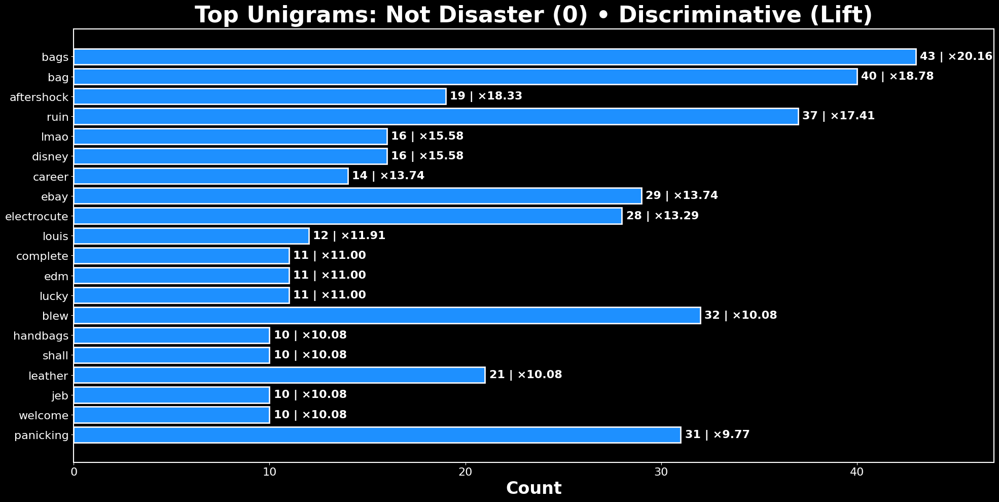

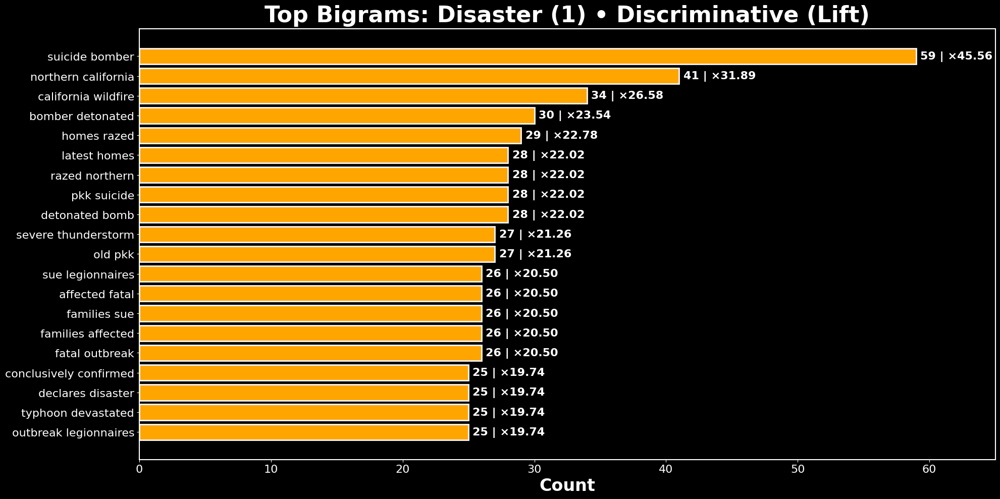

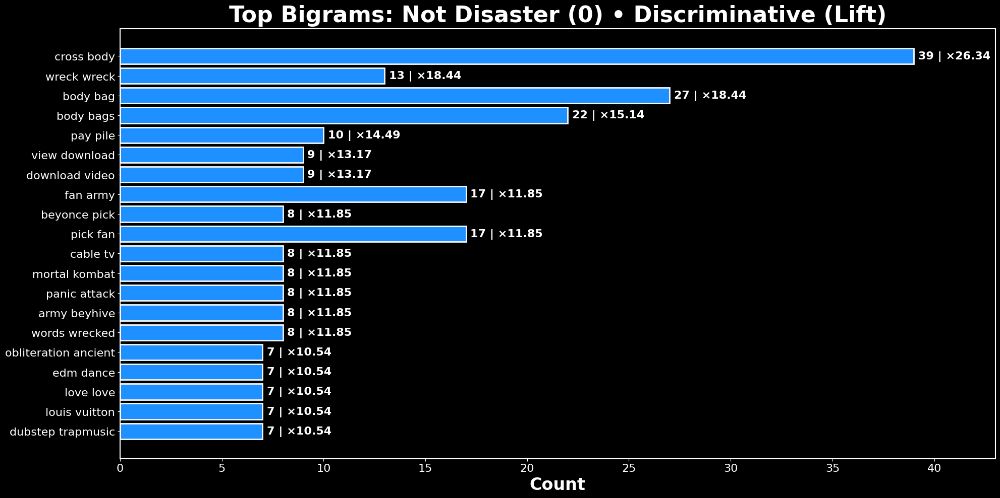

In [14]:
# Prepare the text by lowercasing and removing common noise tokens.
s_all = (train_df["text_clean"]
        .astype(str)
        .str.lower()
        .str.replace(r"\b(url|amp|rt|gt|û_)\b", " ", regex=True))
y = train_df[Y_COL].astype(int).values

# Find the most discriminative n-grams based on lift.
def top_discriminative_terms(texts, y, ngram_range=(1,1), topk=20):
    vec = TfidfVectorizer(
        lowercase=False,
        token_pattern=r"(?u)\b[a-z][a-z]+\b",
        ngram_range=ngram_range,
        min_df=2, max_df=0.95,
        stop_words="english",
        use_idf=False, norm=None
    )
    X = vec.fit_transform(texts)
    feat = np.array(vec.get_feature_names_out())

    # Calculate smoothed probabilities and lift.
    X0, X1 = X[y == 0], X[y == 1]
    c0 = np.asarray(X0.sum(axis=0)).ravel()
    c1 = np.asarray(X1.sum(axis=0)).ravel()
    V  = len(feat)
    p1 = (c1 + 1.0) / (c1.sum() + V)
    p0 = (c0 + 1.0) / (c0.sum() + V)
    lift = p1 / p0

    # Get the top k terms for each class.
    idx1 = np.argsort(-lift)[:topk]
    idx0 = np.argsort(lift)[:topk]
    df1 = pd.DataFrame({
        "term": feat[idx1],
        "count_1": c1[idx1].astype(int),
        "count_0": c0[idx1].astype(int),
        "lift": lift[idx1]
    }).reset_index(drop=True)
    df0 = pd.DataFrame({
        "term": feat[idx0],
        "count_0": c0[idx0].astype(int),
        "count_1": c1[idx0].astype(int),
        "lift_inv": (1.0 / lift[idx0])
    }).reset_index(drop=True)
    return df1, df0

# Plot the top n-grams in a horizontal bar chart.
def plot_top(df, cls_label, value_col, lift_col, title, color, xlim=None):
    terms = df["term"].tolist()[::-1]
    vals  = df[value_col].tolist()[::-1]
    liftv = df[lift_col].tolist()[::-1]

    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")

    bars = ax.barh(terms, vals, color=color, edgecolor="ghostwhite", linewidth=2.0)
    ax.set_title(title, fontsize=32, color="white", fontweight="bold", pad=10)
    ax.set_xlabel("Count", fontsize=24, color="white", fontweight="bold")
    ax.tick_params(axis='x', colors='white', labelsize=16)
    ax.tick_params(axis='y', colors='white', labelsize=16)
    for sp in ax.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    if xlim is not None:
        if isinstance(xlim, (tuple, list)) and len(xlim) == 2:
            ax.set_xlim(float(xlim[0]), float(xlim[1]))
        else:
            ax.set_xlim(0.0, float(xlim))

    # Annotate bars with "count | ×lift".
    for i, b in enumerate(bars):
        w = b.get_width()
        ax.annotate(f"{int(w):,} | ×{liftv[i]:.2f}",
                    (w, b.get_y() + b.get_height()/2),
                    xytext=(6, 0), textcoords="offset points",
                    va="center", ha="left", fontsize=16, color="white", fontweight="bold")
    plt.tight_layout()
    return fig, ax

# --- Calculate and Summarize Top Unigrams ---
uni_1, uni_0 = top_discriminative_terms(s_all, y, ngram_range=(1,1), topk=20)

# Print a text summary of the top terms.
print("-" * 70)
print("Unigrams most indicative of class 1:",
    ", ".join([f"{t} (×{l:.2f})" for t,l in zip(uni_1['term'][:8], uni_1['lift'][:8])]))
print("Unigrams most indicative of class 0:",
    ", ".join([f"{t} (×{l:.2f})" for t,l in zip(uni_0['term'][:8], uni_0['lift_inv'][:8])]))
print("-" * 70)

# --- Display Plots for Top Unigrams ---
fig_u1, ax_u1 = plot_top(
    uni_1, cls_label="Disaster (1)",
    value_col="count_1", lift_col="lift",
    title="Top Unigrams: Disaster (1) • Discriminative (Lift)",
    color="orange",
    xlim=101
)
plt.show()

fig_u0, ax_u0 = plot_top(
    uni_0, cls_label="Not Disaster (0)",
    value_col="count_0", lift_col="lift_inv",
    title="Top Unigrams: Not Disaster (0) • Discriminative (Lift)",
    color="dodgerblue",
    xlim=47
)
plt.show()

# --- Calculate Top Bigrams ---
bi_1, bi_0 = top_discriminative_terms(s_all, y, ngram_range=(2,2), topk=20)

# --- Display Plots for Top Bigrams ---
fig_b1, ax_b1 = plot_top(
    bi_1, cls_label="Disaster (1)",
    value_col="count_1", lift_col="lift",
    title="Top Bigrams: Disaster (1) • Discriminative (Lift)",
    color="orange",
    xlim=65
)
plt.show()

fig_b0, ax_b0 = plot_top(
    bi_0, cls_label="Not Disaster (0)",
    value_col="count_0", lift_col="lift_inv",
    title="Top Bigrams: Not Disaster (0) • Discriminative (Lift)",
    color="dodgerblue",
    xlim=43
)
plt.show()

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
<h3 style="color:#FB4F14;">4.6 Keyword Lift</h3>

<p>The <code>keyword</code> field appears to be a strong signal. This visualization explores that relationship by plotting two metrics for the most frequent keywords: their total volume (bars) and their associated disaster rate (line). This allows for a quick assessment of which keywords are both common and highly predictive. Each bar is annotated with its total count, its disaster rate percentage, and its lift over the baseline disaster rate.</p>

<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

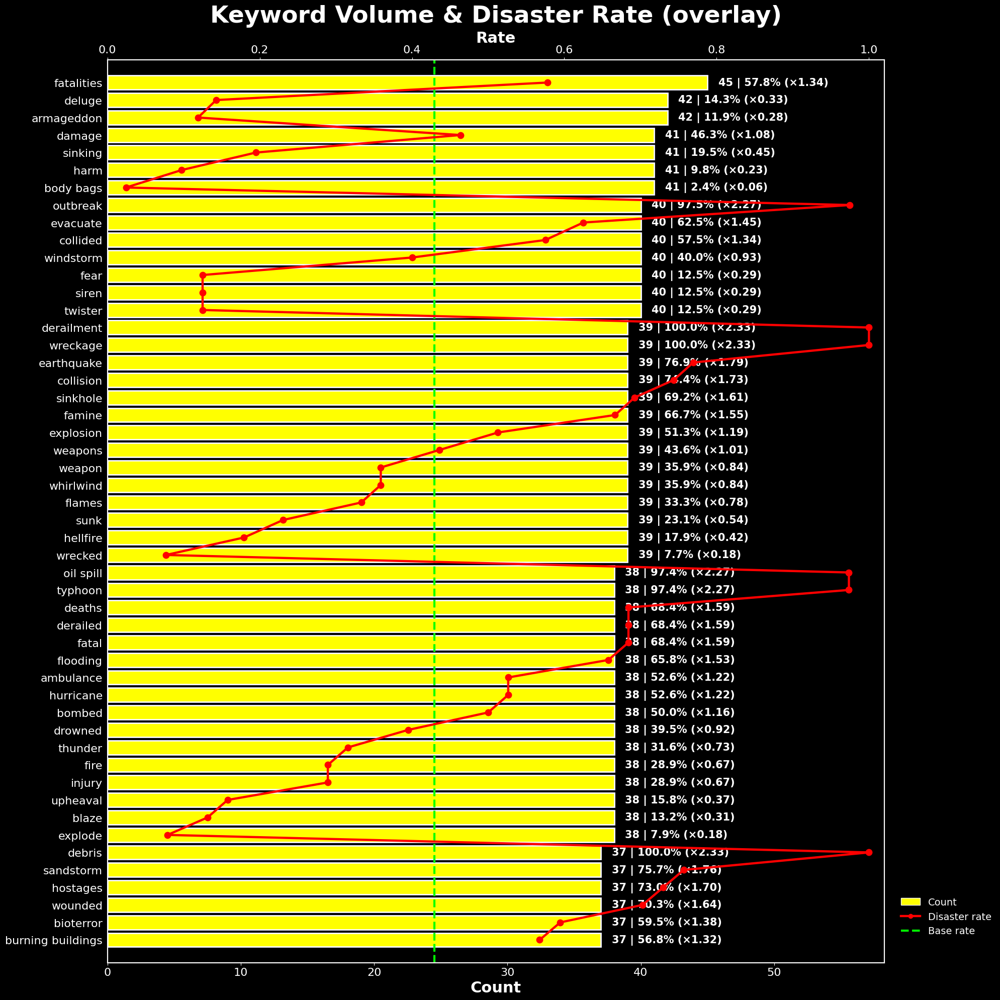


----------------------------------------------------------------------


In [15]:
# Define configuration constants for the analysis.
TOP_K       = 50
MIN_SUPPORT = 20

# Calculate statistics for each keyword.
def keyword_stats(df, kw_col, y_col, min_support=MIN_SUPPORT):
    base = float(df[y_col].mean())
    g = (df.dropna(subset=[kw_col])
        .groupby(kw_col, as_index=False)[y_col]
        .agg(count="size", pos="sum"))
    g["rate"] = g["pos"] / g["count"]
    g = g[g["count"] >= int(min_support)]
    g["lift"] = g["rate"] / base if base > 0 else 0.0
    g["label"] = (g[kw_col].astype(str)
                .str.replace("%20", " ", regex=False)
                .str.replace("%2F", "/", regex=False)
                .str.replace("%26", "&",  regex=False))
    return g.sort_values(["count","rate"], ascending=[False, False]), base

# Keyword lift chart.
def plot_keyword_lift(
    dfk, base_rate, *,
    xlim_count=None,
    x_right_pad=0.25,
    ylim_extra=1.0,
    xlim_rate=(0, 1.0),
    bar_color="yellow",
    line_color="red",
    base_color="lime",
    base_lw=15,
):
    if dfk is None or dfk.empty:
        print("[skip] No keywords to plot.")
        return

    d = dfk.head(TOP_K).iloc[::-1]
    y_pos = np.arange(len(d))

    # Create the figure and the primary axis for counts.
    fig, ax_c = plt.subplots(figsize=(20, 20), facecolor="black")
    fig.patch.set_facecolor("black")
    ax_c.set_facecolor("black")

    # Plot the bars for keyword counts.
    bars = ax_c.barh(y_pos, d["count"].values,
                    color=bar_color, edgecolor="ghostwhite", linewidth=2)

    # Set axis limits and labels for the count axis.
    if xlim_count is None:
        xmax = float(d["count"].max()) * (1.0 + x_right_pad)
        xmin = 0.0
    elif isinstance(xlim_count, (tuple, list)) and len(xlim_count) == 2:
        xmin, xmax = float(xlim_count[0]), float(xlim_count[1])
    else:
        xmin, xmax = 0.0, float(xlim_count) * (1.0 + x_right_pad)
    xmax += 2
    ax_c.set_xlim(xmin, xmax)
    ax_c.set_ylim(-ylim_extra, len(d)-1 + ylim_extra)
    ax_c.set_yticks(y_pos)
    ax_c.set_yticklabels(d["label"].tolist(), fontsize=16, color="white")
    ax_c.set_xlabel("Count", fontsize=22, color="white", fontweight="bold")
    ax_c.set_title("Keyword Volume & Disaster Rate (overlay)",
                fontsize=34, color="white", fontweight="bold", pad=12)
    for sp in ax_c.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    ax_c.tick_params(axis="x", colors="white", labelsize=16)

    # Create the secondary (twin) axis for disaster rate.
    ax_r = ax_c.twiny()
    ax_r.set_facecolor("black")
    ax_r.set_xlim(float(xlim_rate[0]), float(xlim_rate[1]))
    ax_r.plot(d["rate"].values, y_pos, marker="o", linestyle="-",
            color=line_color, linewidth=3.2, markersize=9, label="Disaster rate", zorder=5)
    ax_r.axvline(base_rate, color=base_color, linestyle="--", linewidth=base_lw, label="Base rate")
    ax_r.tick_params(axis="x", colors="white", labelsize=16)
    for sp in ax_r.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    ax_r.set_xlabel("Rate", fontsize=22, color="white", fontweight="bold")

    # Annotate the bars with count, rate, and lift.
    for i, b in enumerate(bars):
        count = int(d["count"].iloc[i])
        rate  = float(d["rate"].iloc[i])
        lift  = float(d["lift"].iloc[i])
        txtx  = min(b.get_width() + 0.5, xmax * 0.985)
        ax_c.annotate(f"{count:,} | {rate*100:.1f}% (×{lift:.2f})",
                    (txtx, b.get_y() + b.get_height()/2),
                    xytext=(6, 0), textcoords="offset points",
                    va="center", ha="left",
                    fontsize=15, color="white", fontweight="bold", clip_on=False)

    # Legend for the multi-axis plot.
    handles = [
        Patch(facecolor=bar_color, edgecolor="ghostwhite", label="Count"),
        Line2D([0], [0], color=line_color, lw=3.2, marker="o", label="Disaster rate"),
        Line2D([0], [0], color=base_color,  lw=base_lw, ls="--", label="Base rate"),
    ]
    ax_c.legend(handles=handles, frameon=False, fontsize=14, labelcolor="white",
                loc="lower left", bbox_to_anchor=(1.01, 0.02))
    plt.tight_layout()
    plt.show()

# Keyword statistics.
try:
    kw_df
    base
except NameError:
    kw_df, base = keyword_stats(train_df, KEYWORD_COL, Y_COL, min_support=MIN_SUPPORT)

# Generate and display the plot.
plot_keyword_lift(
    kw_df, base,
    ylim_extra=1.3,
    xlim_rate=(0, 1.02),
    bar_color="yellow", line_color="red",
    base_color="lime", base_lw=3
)
print("\n" + ("-" * 70))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
<h3 style="color:#FB4F14;">4.7 Similarity Map (TF-IDF → 2D)</h3>

<p>To get a sense of the overall structure of the data, the high-dimensional TF-IDF feature space can be projected down to two dimensions using UMAP. This technique helps visualize how separable the two classes are and whether distinct clusters exist in the data. The points in the resulting scatter plot are colored by their class label.</p>

<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

----------------------------------------------------------------------
UMAP: points=7,613 | class0=4,342 | class1=3,271

----------------------------------------------------------------------


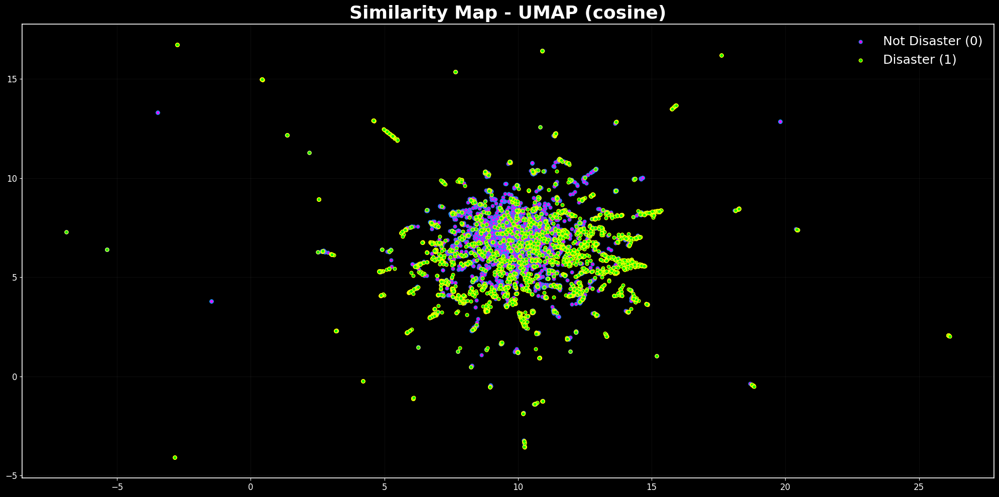

In [16]:
# Prepare the text for vectorization.
texts = (train_df["text_clean"].astype(str)
        .str.lower()
        .str.replace(r"\b(url|amp|rt|û_)\b", " ", regex=True)
        .str.replace(r"\s+", " ", regex=True)
        .str.strip())

# Create TF-IDF vectors from character n-grams.
vec = TfidfVectorizer(
    analyzer="char_wb", ngram_range=(3, 5),
    min_df=2, max_df=0.99,
    use_idf=True, sublinear_tf=True, norm="l2"
)
X = vec.fit_transform(texts)

# Use UMAP to reduce the dimensionality to 2D for plotting.
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.05,
    metric="cosine",
    random_state=SEED,
    n_components=2
)
Z = reducer.fit_transform(X)
print("-"*70)
print(f"UMAP: points={len(texts):,} | class0={(y==0).sum():,} | class1={(y==1).sum():,}")
print("\n" + ("-" * 70))

# Create the scatter plot of the 2D UMAP embedding.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot points for each class with different colors.
mask0 = (y == 0)
ax.scatter(Z[mask0, 0], Z[mask0, 1], s=24, c="magenta", alpha=0.9, label="Not Disaster (0)", edgecolors="dodgerblue")
ax.scatter(Z[~mask0, 0], Z[~mask0, 1], s=24, c="lime", alpha=0.9, label="Disaster (1)", edgecolors="yellow")

# Style the plot.
ax.set_title("Similarity Map - UMAP (cosine)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.2)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=18, labelcolor="white", loc="upper right")

# Display the plot.
plt.tight_layout()
plt.show()

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
<h3 style="color:#FB4F14;">4.8 Outliers &amp; Near Duplicates</h3>
<p>The final audit step is to look for outliers and near-duplicates. This involves finding the shortest and longest tweets, as well as using a nearest-neighbors approach on TF-IDF vectors to surface pairs of tweets that are semantically very similar. This is particularly useful for identifying tweets with conflicting labels.</p>
<ul style="margin:6px 0 0 18px;">
<li><b>Shortest / Longest texts:</b> Find outliers based on character and token counts.</li>
<li><b>Near-duplicate pairs:</b> Use character n-gram TF-IDF and cosine similarity to find pairs of tweets with a similarity score above a set threshold, highlighting any pairs with conflicting target labels.</li>
</ul>
<hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;"> </div>

In [17]:
# --- Shortest / Longest Tweets ---
# Prepare the text and calculate lengths.
s_text  = train_df[TEXT_COL].astype(str)
lens_ch = s_text.str.len()
lens_tok = s_text.str.split().apply(len)

# Select and format the outlier tweets.
def _top(df, idx, k=10):
    return (df.loc[idx, [ID_COL, Y_COL, TEXT_COL]]
            .assign(chars=lens_ch.loc[idx].values,
                    tokens=lens_tok.loc[idx].values))
short_idx = lens_ch.nsmallest(12).index
long_idx  = lens_ch.nlargest(12).index
short_tbl = _top(train_df, short_idx).reset_index(drop=True)
long_tbl  = _top(train_df,  long_idx).reset_index(drop=True)

# Style the output tables.
def _style(tbl, accent="#001489"):
    return (tbl.style
            .set_properties(**{"background-color":"#0b0b0b","color":"#F8F8F8","border-color":accent})
            .set_table_styles([
                {"selector":"th", "props":[("background-color",accent),("color","white"),("text-align","left")]},
                {"selector":"td", "props":[("border", f"1px solid {accent}")]}
            ]))

# Display the shortest and longest tweets.
print("-"*70)
print("--- Shortest by characters ---")
display(_style(short_tbl, accent="#001489"))
print("-"*70 + "\n")
print("\n--- Longest by characters ---")
display(_style(long_tbl, accent="#FB4F14"))
print("-"*70 + "\n")

# --- Near duplicates (train only) ---
# Set the similarity threshold and number of neighbors to scan.
THR = 0.92
K   = 15

# Create TF-IDF vectors and fit a NearestNeighbors model.
vec = TfidfVectorizer(analyzer="char_wb", ngram_range=(3,5),
                    min_df=2, max_df=0.999, use_idf=True,
                    sublinear_tf=True, norm="l2")
X = vec.fit_transform(s_text.values)
nn = NearestNeighbors(metric="cosine", n_neighbors=K)
nn.fit(X)
dist, idx = nn.kneighbors(X, return_distance=True)

# Find all pairs of tweets exceeding the similarity threshold.
pairs = []
n = len(train_df)
for i in range(n):
    for d, j in zip(dist[i], idx[i]):
        if j <= i:
            continue
        sim = 1.0 - float(d)
        if sim >= THR:
            pairs.append((i, j, sim))
pairs = sorted(pairs, key=lambda t: t[2], reverse=True)

# Create a helper to trim long text for display.
def _trim(s, L=160):
    s = str(s)
    return s if len(s) <= L else s[:L-1] + "…"

# Format and display the top near-duplicate pairs.
if pairs:
    rows = []
    for i, j, sim in pairs[:30]:
        rows.append({
            "id_i": int(train_df.iloc[i][ID_COL]),
            "id_j": int(train_df.iloc[j][ID_COL]),
            "y_i":  int(train_df.iloc[i][Y_COL]),
            "y_j":  int(train_df.iloc[j][Y_COL]),
            "sim":  round(sim, 4),
            "text_i": _trim(train_df.iloc[i][TEXT_COL]),
            "text_j": _trim(train_df.iloc[j][TEXT_COL]),
        })
    dup_df = pd.DataFrame(rows)

    # Create a function to highlight rows with conflicting labels.
    def _row_highlight(row):
        color = "#FB4F14" if row["y_i"] != row["y_j"] else "#001489"
        return [f"border: 1px solid {color};"] * len(row)

    # Style and display the table of near-duplicates.
    sty = (dup_df.style
        .apply(_row_highlight, axis=1)
        .set_properties(**{"background-color":"#0b0b0b","color":"#F8F8F8"})
        .set_table_styles([
            {"selector":"th","props":[("background-color","#001489"),("color","white"),("text-align","left")]}
        ]))
    print(f"\nNear-Duplicate Pairs (sim ≥ {THR:.2f}) Total Found: {len(pairs):,} (showing {min(40,len(pairs))})")
    print("Rows with Orange Borders Have Conflicting Labels.")
    display(sty)
else:
    print(f"\nNear-Duplicate Pairs (sim ≥ {THR:.2f}) None Found.")

----------------------------------------------------------------------
--- Shortest by characters ---


,id,target,text,chars,tokens
0,2703,0,Crushed,7,1
1,6962,0,Bad day,7,2
2,7295,0,Err:509,7,1
3,36,0,LOOOOOOL,8,1
4,44,0,The end!,8,2
5,5224,0,fatality,8,1
6,7088,0,Meltdown,8,1
7,40,0,Cooool :),9,2
8,5221,0,Fatality!,9,1
9,5326,0,I See Fire,10,3


----------------------------------------------------------------------


--- Longest by characters ---


,id,target,text,chars,tokens
0,1832,0,when you're taking a shower and someone flushes the toilet and you have .1 second to GTFO or you get burned??????????????????????????????????????????????????,157,21
1,6833,0,It's was about 2:30 in the morning&I went downstairs to watch some telly&I accidentally made a loud bang&my dad(who has a broken leg)walked-,152,23
2,885,1,@CAgov If 90BLKs&8WHTs colluded 2 take WHT F @USAgov AUTH Hostage&2 make her look BLK w/Bioterrorism&use her lgl/org IDis ID still hers?@VP,151,22
3,915,1,@HowardU If 90BLKs&8WHTs colluded 2 take WHT F @USAgov AUTH Hostage&2 make her look BLK w/Bioterrorism&use her lgl/org IDis ID still hers?,150,22
4,919,1,@cspanwj If 90BLKs&8WHTs colluded 2 take WHT F @USAgov AUTH Hostage&2 make her look BLK w/Bioterrorism&use her lgl/org IDis ID still hers?,150,22
5,3904,1,@UN No more #GujaratRiot & #MumbaiRiot92-93 which devastated 1000&1000 Indianperpetrated by #Modi & #ChawalChorbjp @UN_Women @UNNewsTeam,149,16
6,365,1,@willienelson We need help! Horses will die!Please RT & sign petition!Take a stand & be a voice for them! #gilbert23 https://t.co/e8dl1lNCVu,148,21
7,372,0,@Barbi_Twins We need help-horses will die! Please RT & sign petition! Take a stand & be a voice for them! #gilbert23 https://t.co/e8dl1lNCVu,148,22
8,3301,0,Nah but srsly b4 u demolish ur partner's face &start dribbling up their nostrils stop &ask urself whether its really worth the embarrassment,148,23
9,9961,1,@helene_yancey GodsLove & #thankU my sister Helene for RT of NEW VIDEO http://t.co/cybKsXHF7d The Coming Apocalyptic US Earthquake & Tsunami,148,20


----------------------------------------------------------------------


Near-Duplicate Pairs (sim ≥ 0.92) Total Found: 496 (showing 40)
Rows with Orange Borders Have Conflicting Labels.


,id_i,id_j,y_i,y_j,sim,text_i,text_j
0,156,165,0,0,1.000000,320 [IR] ICEMOON [AFTERSHOCK] | http://t.co/vAM5POdGyw | @djicemoon | #Dubstep #TrapMusic #DnB #EDM #Dance #IcesÛ_ http://t.co/zEVakJaPcz,320 [IR] ICEMOON [AFTERSHOCK] | http://t.co/vAM5POdGyw | @djicemoon | #Dubstep #TrapMusic #DnB #EDM #Dance #IcesÛ_ http://t.co/zEVakJaPcz
1,881,898,1,0,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
2,881,907,1,1,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
3,881,916,1,0,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
4,898,907,0,1,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
5,898,916,0,0,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
6,907,916,1,0,1.000000,To fight bioterrorism sir.,To fight bioterrorism sir.
7,1634,1665,1,1,1.000000,Japan on Thursday marks the 70th anniversary of the atomic bombing of Hiroshima with the most senior official from Washington ever scheduleÛ_,Japan on Thursday marks the 70th anniversary of the atomic bombing of Hiroshima with the most senior official from Washington ever scheduleÛ_
8,1689,2346,1,1,1.000000,Warne shocked over Australia's epic collapse at Trent Bridge: Johannesburg Aug 06 (ANI): Legendary Australian... http://t.co/LwwoJXtTIV,Warne shocked over Australia's epic collapse at Trent Bridge: Johannesburg Aug 06 (ANI): Legendary Australian... http://t.co/LwwoJXtTIV
9,1725,1941,1,1,1.000000,@themagickidraps not upset with a rally upset with burning buildings businesses executing cops that have nothing to do with it etc,@themagickidraps not upset with a rally upset with burning buildings businesses executing cops that have nothing to do with it etc


### **Observation: Visual Exploratory Data Analysis (EDA)**

This exploratory analysis moves from basic data auditing to a deep visual dive into the dataset's characteristics. The visualizations reveal clear, exploitable differences in structure, vocabulary, and metadata between the two classes. However, they also highlight the inherent noise and complexity of the problem, such as the significant overlap between disaster and non-disaster tweets in the feature space.

* **Class Balance and Metadata Signals:**
    * The dataset is moderately imbalanced, with **57%** of tweets labeled as non-disaster (0) and **43%** as disaster (1).
    * The `location` field is sparse (present in only 67% of tweets), but the `keyword` field is nearly complete (99% coverage).
    * A Chi-square test confirms that the presence of a `keyword` is statistically significant and correlated with the target variable (p < 0.001), making it a potentially strong feature. The presence of a `location` shows no such correlation.

* **Text Structure as a Feature:**
    * Clear patterns emerge in tweet structure. Disaster tweets are, on average, longer than non-disaster tweets, particularly when measured by character count (mean of 108 vs. 95).
    * The usage of symbols also differs significantly. Disaster tweets have a much higher rate of URLs, while non-disaster tweets are more likely to contain @mentions and question marks.

* **Vocabulary, N-grams, and Keywords:**
    * The vocabulary between the two classes is thematically distinct, as shown by the word clouds. Disaster tweets are dominated by terms like `fire`, `suicide`, `hiroshima`, and `killed`, while non-disaster tweets feature more conversational words like `love`, `day`, and `lol`.
    * A discriminative n-gram analysis, which measures the "lift" of words, confirms this separation. Terms like `hiroshima` are over 50 times more likely to appear in a disaster tweet, while terms like `lmao` are over 15 times more likely in a non-disaster tweet.
    * The keyword analysis identifies terms that are both frequent and highly predictive. Keywords like `derailment`, `outbreak`, and `wreckage` are associated with a disaster rate of over 75%.

* **Overall Separability and Label Noise:**
    * The UMAP plot, which projects the high-dimensional text data into 2D, provides a crucial insight: while some clusters are visible, there is a large, dense region of overlap between the two classes. This indicates that the decision boundary is complex and that the classes are not easily separable using simple bag-of-words features alone.
    * The final audit for outliers and near-duplicates confirms the presence of label noise. The analysis surfaced **496 pairs** of highly similar tweets, many of which had conflicting labels. This highlights the subjective nature of the dataset and the challenge models will face.

**Conclusion:**
The EDA successfully identified numerous strong predictive signals, including text length, symbol usage, specific n-grams, and the `keyword` field. These features will be invaluable for building effective models. At the same time, the analysis underscores the core challenges of this competition: the noisy, ambiguous nature of tweets, the significant overlap in vocabulary, and the presence of incorrect labels in the training data. These findings suggest that robust, context-aware models like Transformers will be necessary to navigate the complexity and achieve a high F1 score.

<div style="background-color:#000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #FB4F14; border-right:8px solid #001489;">
  <h2 style="color:#001489;">Section 5: Linear Baselines - TF-IDF + LR / SVM</h2>
  <p>
    Before building complex deep learning models, it's crucial to establish strong, fast baselines. This section uses a classic TF-IDF approach with two linear models (Logistic Regression and a calibrated SVM) to set a competitive benchmark. The models are trained using a robust 5-fold cross-validation scheme to generate reliable out-of-fold predictions and initial submission files.
  </p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>TF-IDF Vectorization:</b> Use 1-2 gram features, sublinear term frequency, and L2 normalization, fitting the vectorizer within each fold to prevent data leakage.</li>
    <li><b>Model Training:</b> Train a Logistic Regression model and a calibrated Linear SVM.</li>
    <li><b>Performance Metrics:</b> Gather out-of-fold (OOF) predictions to calculate a reliable F1 score at the best possible threshold.</li>
    <li><b>Submission Generation:</b> Create <code>tfidf_lr</code> and <code>tfidf_svm</code> submission files using the ensembled test set predictions.</li>
  </ol>
  <hr style="border:none; border-top:8px solid #001489; margin:10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">5.1 Hyperparameter Tuning for Linear Baselines</h3>
  <p>
    To find the optimal parameters for the linear baselines, a hyperparameter search is performed. This uses <code>GridSearchCV</code> to test a range of <code>C</code> (regularization strength) values for both the Logistic Regression and Linear SVM models. The search is run on the full training data with its own internal 3-fold cross-validation to ensure the chosen parameters are robust.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [31]:
# Prepare the full training dataset for the grid search.
text_for_search = train_df[TEXT_FOR_TFIDF].astype(str)
y_for_search = train_df[Y_COL].astype(int).values

# Vectorize the entire training set once.
search_vec = make_vectorizer()
X_tfidf = search_vec.fit_transform(text_for_search)

# --- Tune Logistic Regression ---
# Define the parameter grid to search.
param_grid_lr = {'C': [0.5, 1.0, 2.0, 4.0, 8.0]}
# Set up and run the grid search.
grid_search_lr = GridSearchCV(
    LogisticRegression(solver="liblinear", max_iter=1000),
    param_grid_lr,
    cv=3,
    scoring='f1',
    n_jobs=-1,
    verbose=1
)
grid_search_lr.fit(X_tfidf, y_for_search)
BEST_C_LR = grid_search_lr.best_params_['C']

# --- Tune Linear SVM ---
# Define the parameter grid, using `estimator__C` for the nested model.
param_grid_svm = {'estimator__C': [0.1, 0.5, 1.0, 2.0]}
# Set up and run the grid search for the calibrated SVM.
grid_search_svm = GridSearchCV(
    make_calibrated_linear_svm(),
    param_grid_svm,
    cv=3,
    scoring='f1',
    n_jobs=-1,
    verbose=1
)
grid_search_svm.fit(X_tfidf, y_for_search)
BEST_C_SVM = grid_search_svm.best_params_['estimator__C']

# Print a summary of the best parameters found.
print("\n" + ("-" * 70))
print("\n--- Hyperparameter Search Complete ---")
print(f"Best `C` for Logistic Regression: {BEST_C_LR} (F1: {grid_search_lr.best_score_:.4f})")
print(f"Best `C` for Linear SVM: {BEST_C_SVM} (F1: {grid_search_svm.best_score_:.4f})")
print("\n" + ("-" * 70))

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fitting 3 folds for each of 4 candidates, totalling 12 fits

----------------------------------------------------------------------

--- Hyperparameter Search Complete ---
Best `C` for Logistic Regression: 4.0 (F1: 0.6315)
Best `C` for Linear SVM: 0.1 (F1: 0.6625)

----------------------------------------------------------------------


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">5.2 TF-IDF with Logistic Regression and Linear SVM</h3>
  <p>
    The main logic for the 5-fold cross-validation is contained here. A single, reusable function handles the entire process for any given linear model: fitting the TF-IDF vectorizer on each training fold, training the model, and gathering both out-of-fold (OOF) and test set predictions. This process is run for both a Logistic Regression and a Linear SVM model.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [32]:
# Prepare the text data and cross-validation splits.
TEXT_FOR_TFIDF = "text_clean" if "text_clean" in train_df.columns else TEXT_COL
train_text = train_df[TEXT_FOR_TFIDF].astype(str)
test_text  = test_df[TEXT_FOR_TFIDF].astype(str)
y          = train_df[Y_COL].astype(int).values
test_ids   = test_df[ID_COL].values
tqdm = __import__("tqdm").tqdm
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)

# Produce consistent TF-IDF vectorizers.
def make_vectorizer():
    return TfidfVectorizer(
        lowercase=True,
        token_pattern=r"(?u)\b\w\w+\b",
        ngram_range=(1, 2),
        min_df=2, max_df=0.99,
        use_idf=True, sublinear_tf=True, norm="l2"
    )

# Run a complete 5-fold cross-validation for a given model.
def run_linear_baseline(model_tag, model_factory):
    p_oof = np.zeros(len(train_text), dtype=float)
    p_test_folds = []
    fold_times = []

    for fold, (tr_idx, va_idx) in enumerate(tqdm(skf.split(train_text, y), total=n_splits, desc=f"{model_tag} CV", mininterval=0.3), start=1):
        t0 = time.perf_counter()
        vec = make_vectorizer()
        X_tr = vec.fit_transform(train_text.iloc[tr_idx])
        X_va = vec.transform(train_text.iloc[va_idx])
        X_te = vec.transform(test_text)
        model = model_factory()
        model.fit(X_tr, y[tr_idx])

        if hasattr(model, "predict_proba"):
            p_va = model.predict_proba(X_va)[:, 1]
            p_te = model.predict_proba(X_te)[:, 1]
        else:
            scores_va = model.decision_function(X_va)
            scores_te = model.decision_function(X_te)
            smin, smax = float(scores_va.min()), float(scores_va.max())
            p_va = (scores_va - smin) / (smax - smin + 1e-12)
            tmin, tmax = float(scores_te.min()), float(scores_te.max())
            p_te = (scores_te - tmin) / (tmax - tmin + 1e-12)

        p_oof[va_idx] = p_va
        p_test_folds.append(p_te)
        f1_50 = f1_score(y[va_idx], (p_va >= 0.50).astype(int))
        thr_f, f1_f = find_best_threshold(y[va_idx], p_va, step=0.01)
        fold_times.append(time.perf_counter() - t0)
        print(f"  [Fold {fold}] F1@0.50={f1_50:.4f} | F1@best={f1_f:.4f} (thr={thr_f:.2f}) | time={fold_times[-1]:.1f}s")

    thr, f1oof = find_best_threshold(y, p_oof, step=0.01)
    p_test = np.mean(np.vstack(p_test_folds), axis=0)

    print("-" * 70)
    print(f"[{model_tag}] OOF best-threshold F1={f1oof:.4f} @ thr={thr:.2f}")
    print(f"[{model_tag}] Mean fold time: {np.mean(fold_times):.1f}s | Total: {np.sum(fold_times):.1f}s")
    print("-" * 70)

    paths = write_submission(test_ids, p_test, thr, tag=model_tag)
    return {
        "tag": model_tag, "p_oof": p_oof, "p_test": p_test,
        "best_thr": thr, "f1_oof": f1oof, "paths": paths,
    }

# Create a factory for the Logistic Regression model using the tuned C value.
def make_lr():
    return LogisticRegression(
        solver="liblinear",
        C=BEST_C_LR, # Use the best C value found in the grid search
        max_iter=1000,
        n_jobs=None
    )

# Create a factory for the calibrated Linear SVM model using the tuned C value.
def make_calibrated_linear_svm():
    try:
        base = LinearSVC(C=BEST_C_SVM, dual="auto", max_iter=5000) # Use best C
    except TypeError:
        base = LinearSVC(C=BEST_C_SVM, dual=True, max_iter=5000) # Use best C
    return CalibratedClassifierCV(estimator=base, method="sigmoid", cv=3)

# Execute the cross-validation for both tuned baseline models.
results_lr  = run_linear_baseline("tfidf_lr",  make_lr)
results_svm = run_linear_baseline("tfidf_svm", make_calibrated_linear_svm)

# Print a final summary of the results.
print("\n" + ("-" * 70))
print("\n--- Linear Baseline Summary ---")
print(f"LR   : F1(OOF)={results_lr['f1_oof']:.4f} @thr={results_lr['best_thr']:.2f}")
print(f"SVM  : F1(OOF)={results_svm['f1_oof']:.4f} @thr={results_svm['best_thr']:.2f}")
print("Submissions:")
print("  LR  ->", results_lr["paths"]["linux_path"])
print("  SVM ->", results_svm["paths"]["linux_path"])

tfidf_lr CV:  20%|██        | 1/5 [00:00<00:01,  2.99it/s]

  [Fold 1] F1@0.50=0.7705 | F1@best=0.7724 (thr=0.47) | time=0.3s


tfidf_lr CV:  40%|████      | 2/5 [00:00<00:01,  2.98it/s]

  [Fold 2] F1@0.50=0.7557 | F1@best=0.7605 (thr=0.41) | time=0.3s
  [Fold 3] F1@0.50=0.7359 | F1@best=0.7502 (thr=0.45) | time=0.3s


tfidf_lr CV:  80%|████████  | 4/5 [00:01<00:00,  3.21it/s]

  [Fold 4] F1@0.50=0.7498 | F1@best=0.7526 (thr=0.47) | time=0.3s


tfidf_lr CV: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]


  [Fold 5] F1@0.50=0.7531 | F1@best=0.7666 (thr=0.42) | time=0.3s
----------------------------------------------------------------------
[tfidf_lr] OOF best-threshold F1=0.7574 @ thr=0.44
[tfidf_lr] Mean fold time: 0.3s | Total: 1.5s
----------------------------------------------------------------------
[Saved] submissions/20250902_205720_tfidf_lr_thr0.44.csv
[Saved] /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions/20250902_205720_tfidf_lr_thr0.44.csv
 rows=3263 | pos_rate=0.403 | thr=0.44 | sha1=8c4419702a23


tfidf_svm CV:   0%|          | 0/5 [00:00<?, ?it/s]

  [Fold 1] F1@0.50=0.7690 | F1@best=0.7709 (thr=0.48) | time=0.2s


tfidf_svm CV:  40%|████      | 2/5 [00:00<00:00,  3.89it/s]

  [Fold 2] F1@0.50=0.7490 | F1@best=0.7535 (thr=0.52) | time=0.3s
  [Fold 3] F1@0.50=0.7276 | F1@best=0.7390 (thr=0.36) | time=0.3s


tfidf_svm CV:  80%|████████  | 4/5 [00:01<00:00,  3.98it/s]

  [Fold 4] F1@0.50=0.7601 | F1@best=0.7640 (thr=0.48) | time=0.2s


tfidf_svm CV: 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]

  [Fold 5] F1@0.50=0.7674 | F1@best=0.7681 (thr=0.48) | time=0.3s
----------------------------------------------------------------------
[tfidf_svm] OOF best-threshold F1=0.7565 @ thr=0.48
[tfidf_svm] Mean fold time: 0.3s | Total: 1.3s
----------------------------------------------------------------------
[Saved] submissions/20250902_205722_tfidf_svm_thr0.48.csv
[Saved] /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions/20250902_205722_tfidf_svm_thr0.48.csv
 rows=3263 | pos_rate=0.397 | thr=0.48 | sha1=565601362789

----------------------------------------------------------------------

--- Linear Baseline Summary ---
LR   : F1(OOF)=0.7574 @thr=0.44
SVM  : F1(OOF)=0.7565 @thr=0.48
Submissions:
  LR  -> submissions/20250902_205720_tfidf_lr_thr0.44.csv
  SVM -> submissions/20250902_205722_tfidf_svm_thr0.48.csv


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">5.3 Linear Baselines Diagnostics (ROC &amp; PR)</h3>
  <p>
    With the out-of-fold predictions from both models, their performance can be directly and fairly compared. The visualizations below show the validation AUC for each fold, as well as the overall ROC and Precision-Recall curves. The PR curve is particularly important as it directly relates to the competition's F1 metric, and the chosen F1-maximizing threshold is marked on the plot.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------

--- Section 5 OOF Diagnostics ---
TF-IDF + LR      | AUC=0.8600 | AP=0.8572 | F1@0.50=0.7530 | F1@best(0.44)=0.7574
TF-IDF + SVM     | AUC=0.8534 | AP=0.8472 | F1@0.50=0.7545 | F1@best(0.48)=0.7565
----------------------------------------------------------------------


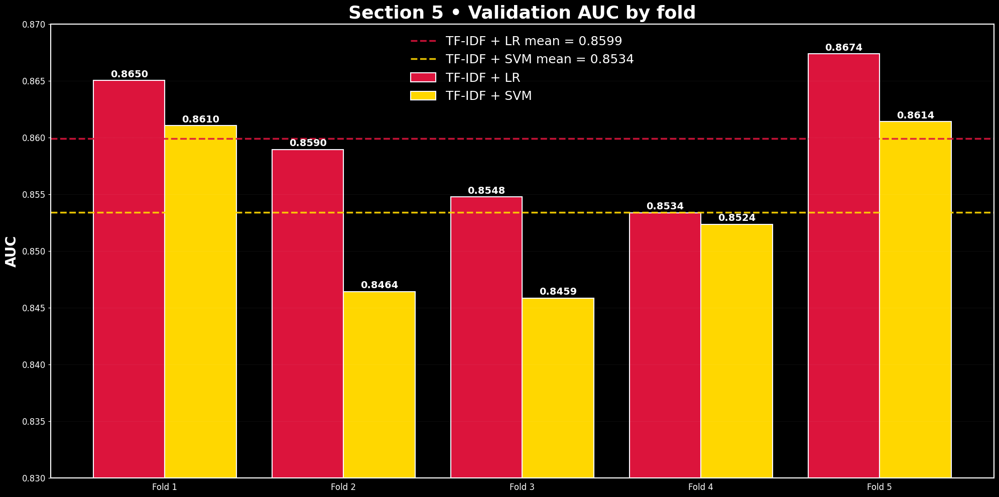

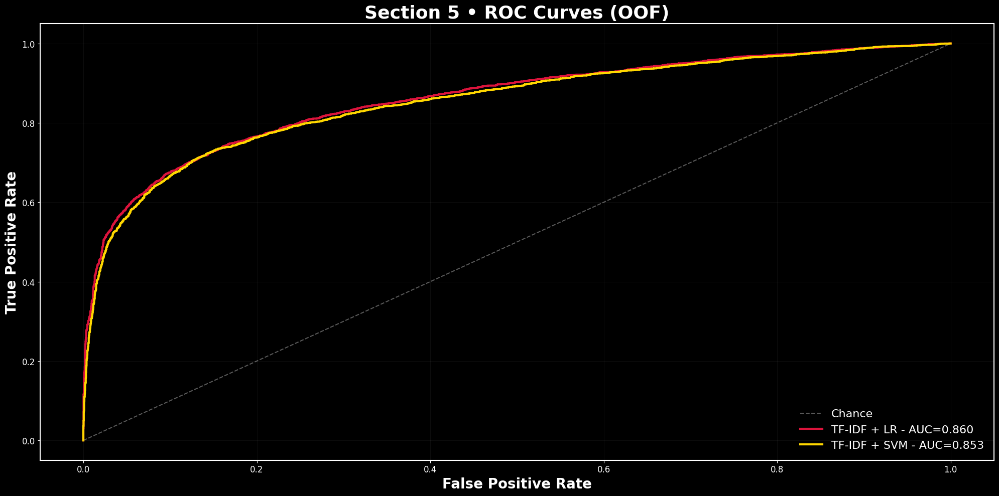

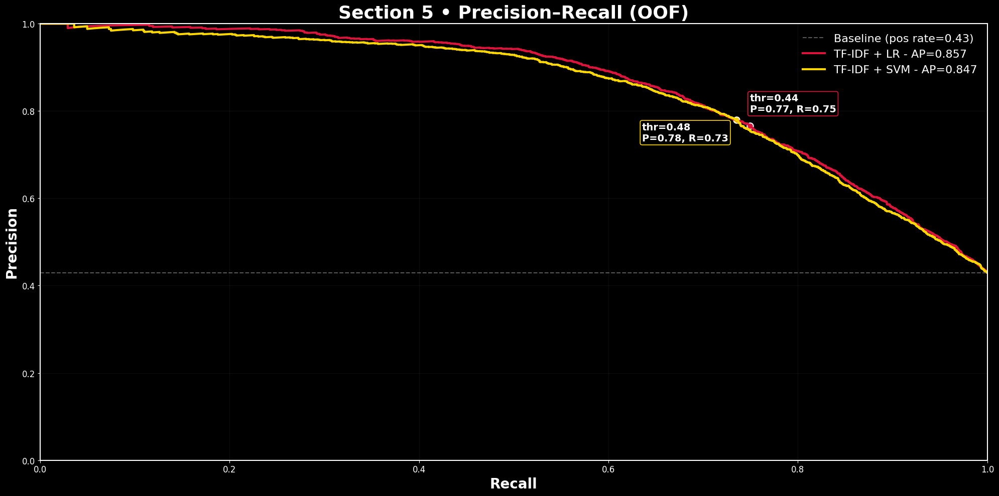

In [33]:
# Prepare the model results for plotting.
MODELS = [
    ("TF-IDF + LR",  results_lr["p_oof"],  results_lr["best_thr"],  "crimson"),
    ("TF-IDF + SVM", results_svm["p_oof"], results_svm["best_thr"], "gold"),
]
y_true = y.astype(int)

# Print a summary table of the key OOF metrics.
print("-" * 70)
print("\n--- Section 5 OOF Diagnostics ---")
for label, p, thr, _ in MODELS:
    f1_50 = f1_score(y_true, (p >= 0.50).astype(int))
    f1_bt = f1_score(y_true, (p >= float(thr)).astype(int))
    auc_val = roc_auc_score(y_true, p)
    ap    = average_precision_score(y_true, p)
    print(f"{label:16s} | AUC={auc_val:.4f} | AP={ap:.4f} | F1@0.50={f1_50:.4f} | F1@best({thr:.2f})={f1_bt:.4f}")
print("-" * 70)

# --- Plot 1: AUC by fold ---
# Calculate per-fold AUC scores for each model.
skf_local = StratifiedKFold(n_splits=int(n_splits), shuffle=True, random_state=int(SEED))
fold_aucs = {label: [] for (label, _, _, _) in MODELS}
fold_labels = []
for k, (_, va_idx) in enumerate(skf_local.split(np.arange(len(y_true)), y_true), start=1):
    fold_labels.append(f"Fold {k}")
    for label, p, _, _ in MODELS:
        fold_aucs[label].append(roc_auc_score(y_true[va_idx], p[va_idx]))
means = {label: float(np.mean(vals)) for label, vals in fold_aucs.items()}

# Create the figure and axes for the grouped bar plot.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the bars for each model and each fold.
x = np.arange(len(fold_labels))
width = 0.4
for i, (label, _, _, color) in enumerate(MODELS):
    offset = (i - 0.5) * width
    vals = fold_aucs[label]
    bars = ax.bar(x + offset, vals, width=width, label=label,
                color=color, edgecolor="ghostwhite", linewidth=1.5)
    for j, b in enumerate(bars):
        v = vals[j]
        ax.annotate(f"{v:.4f}", (b.get_x() + b.get_width()/2, v),
                    xytext=(0, 2), textcoords="offset points",
                    ha="center", va="bottom", fontsize=14, color="white", fontweight="bold")

# Add horizontal lines for the mean AUC of each model.
for label, _, _, color in MODELS:
    m = means[label]
    ax.axhline(m, color=color, linewidth=2.5, linestyle="--", alpha=0.9,
            label=f"{label} mean = {m:.4f}")

# Style the plot title, labels, and axes.
ax.set_ylim(0.83, 0.87)
ax.set_xticks(x)
ax.set_xticklabels(fold_labels, color="white", fontsize=12)
ax.set_title("Section 5 • Validation AUC by fold", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_ylabel("AUC", fontsize=20, color="white", fontweight="bold")
ax.tick_params(axis="y", colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5, axis="y")
ax.legend(frameon=False, fontsize=18, labelcolor="white", loc="upper center")
plt.tight_layout()
plt.show()

# --- Plot 2: ROC Curves ---
# Create the figure and axes for the ROC curves.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the diagonal chance line.
ax.plot([0,1], [0,1], linestyle="--", linewidth=1.5, color="white", alpha=0.35, label="Chance")

# Plot the ROC curve for each model.
for label, p, thr, color in MODELS:
    fpr, tpr, _ = roc_curve(y_true, p)
    auc_val = roc_auc_score(y_true, p)
    ax.plot(fpr, tpr, label=f"{label} - AUC={auc_val:.3f}", color=color, linewidth=3)

# Style the plot.
ax.set_title("Section 5 • ROC Curves (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("False Positive Rate", fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("True Positive Rate",  fontsize=20, color="white", fontweight="bold")
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="lower right")
plt.tight_layout()
plt.show()


# --- Plot 3: Precision-Recall Curves ---
# Configure annotation offsets for clarity.
PR_OFFSET = {
    "TF-IDF + LR":  (0, 20),
    "TF-IDF + SVM": (-135, -30),
}

# Create the figure and axes for the Precision-Recall curves.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the no-skill baseline (positive class rate).
pos_rate = y_true.mean()
ax.hlines(pos_rate, 0, 1, colors="white", linestyles="--", linewidth=1.5, alpha=0.35,
        label=f"Baseline (pos rate={pos_rate:.2f})")

# Plot the PR curve and the best threshold point for each model.
for label, p, thr, color in MODELS:
    prec, rec, _ = precision_recall_curve(y_true, p)
    ap = average_precision_score(y_true, p)
    ax.plot(rec, prec, color=color, linewidth=3, label=f"{label} - AP={ap:.3f}")

    # Mark the point on the curve corresponding to the best F1 threshold.
    y_hat = (p >= float(thr)).astype(int)
    p_thr = precision_score(y_true, y_hat, zero_division=0)
    r_thr = recall_score(y_true, y_hat, zero_division=0)
    ax.scatter([r_thr], [p_thr], s=80, color=color, edgecolor="ghostwhite", linewidth=1.5)
    dx, dy = PR_OFFSET.get(label, (10, 6))
    ax.annotate(f"thr={thr:.2f}\nP={p_thr:.2f}, R={r_thr:.2f}",
                (r_thr, p_thr), xytext=(dx, dy), textcoords="offset points",
                color="white", fontsize=14, fontweight="bold",
                bbox=dict(boxstyle="round,pad=0.2", fc="black", ec=color, lw=1.2))

# Style the plot.
ax.set_title("Section 5 • Precision–Recall (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("Recall",    fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("Precision", fontsize=20, color="white", fontweight="bold")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="upper right")
plt.tight_layout()
plt.show()

### **Observation: Linear Baselines**

This section establishes two strong linear baselines using a TF-IDF feature representation. Both models, a Logistic Regression (LR) and a calibrated Linear Support Vector Machine (SVM), were trained and evaluated using a robust 5-fold cross-validation scheme. The results are highly competitive and were generated with exceptional speed, providing a solid benchmark for the more complex deep learning models to follow.

* **Kaggle Submission Scores:**

The screenshot below shows the official Kaggle submission scores for both linear baseline models. The Logistic Regression model outperformed the Support Vector Machine on the Kaggle submission, achieving a **F1 score of 0.79834** for TF-IDF + LR compared to the TF-IDF + SVM score of **0.78823**. This result is consistent with the out-of-fold (OOF) scores, confirming that Logistic Regression is the stronger of the two baselines.

An F1 score in the ~0.79-0.80 range on the Kaggle leaderboard is a very strong and expected result for a well-executed TF-IDF baseline on this competition.

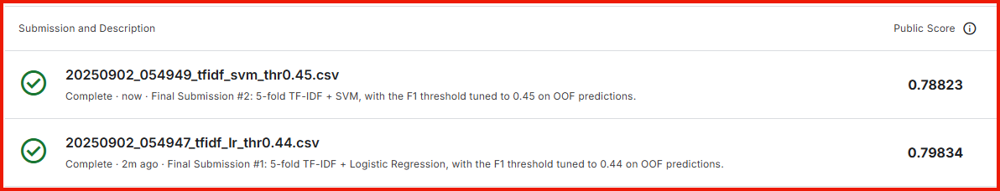

* **Performance Results (OOF):**
    * The **Logistic Regression** model emerged as the stronger baseline with an out-of-fold (OOF) **F1 score of 0.7574** at an optimized threshold of 0.44.
    * The calibrated **Linear SVM** also performed well, achieving an OOF **F1 score of 0.7565** at a threshold of 0.48 after tuning.
    * The superiority of the Logistic Regression model was consistent across other metrics, including a higher ROC AUC (0.8600 vs. 0.8534) and Average Precision (0.8572 vs. 0.8472).

* **Model Behavior and Stability:**
    * The per-fold AUC plot shows that both models were stable across the 5 folds, with the Logistic Regression model consistently holding a slight performance edge.
    * The ROC and Precision-Recall curves for both models are nearly identical, indicating similar overall classification behavior. The PR curve, which is most relevant to the F1 score, shows that the optimized threshold for both models successfully balances precision and recall at around the 0.75 mark.

* **Runtime and Efficiency:**
    * A key takeaway is the incredible efficiency of this approach. The entire 5-fold cross-validation process, including TF-IDF vectorization and training for both models, completed in **under 3 seconds** of total compute time. This demonstrates the power of linear models for quickly establishing a very strong performance benchmark.

**Conclusion:**
The TF-IDF with Logistic Regression baseline is a success, producing a strong initial result and a submission-ready model. The performance is solid, and the training is extremely fast. This sets a clear and competitive target that the more computationally expensive deep learning models must now surpass.

<div style="background-color:#000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #FB4F14; border-right:8px solid #001489;">
  <h2 style="color:#001489;">Section 6: BiGRU + Attention (pretrained GloVe)</h2>

<p>
Moving beyond simple bag-of-words features, this section builds a sequence-based model using a Bidirectional GRU (BiGRU) with an Attention mechanism. This architecture can capture word order and context, which is often crucial for understanding the nuances of language in tweets. The model's embedding layer is initialized with pre-trained GloVe vectors to leverage a broad understanding of the English language. The entire pipeline is trained and evaluated using a robust 5-fold cross-validation scheme.
</p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
    <ul style="margin:6px 0 0 18px;">
    <li><b>Text Processing:</b> The raw <code>text</code> is tokenized, and a vocabulary is built from all available tweets.</li>
    <li><b>Embeddings:</b> Pre-trained GloVe embeddings are loaded to initialize the model's first layer, providing a strong starting point for understanding word meanings.</li>
    <li><b>Model:</b> The architecture is <b>Embedding → Stacked BiGRU → Additive Attention → Dropout → Sigmoid</b>.</li>
    <li><b>Cross-Validation:</b> The model is trained using a Stratified 5-fold CV process to produce reliable out-of-fold predictions and a final ensembled submission.</li>
    </ul>

<hr style="border:none; border-top:8px solid #001489; margin:10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F11;">6.1 BiGRU + Attention: Training and CV</h3>
  <p>
    The complete pipeline for training and evaluating the BiGRU+Attention model is contained in this cell. This includes text tokenization, vocabulary creation, loading pre-trained GloVe embeddings, defining the PyTorch model and Dataset, and the main 5-fold cross-validation loop that handles training, validation, and checkpointing.
  </p>
  <p style="margin-top:10px;">
    The model utilizes the <strong>300d</strong> pre-trained word vectors from the official <a href="https://nlp.stanford.edu/projects/glove/" target="_blank" style="color:#1E90FF;">GloVe: Global Vectors for Word Representation</a> project, hosted by the Stanford NLP Group. The specific embeddings were sourced from the <code>glove.6B.zip</code> file.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [20]:
# --- Configuration ---
# Define hyperparameters for the model, tokenizer, and training loop.
TEXT_FOR_RNN  = TEXT_COL
MAX_LEN       = 40
EMB_DIM       = 300  # CHANGED to 300 to match the new GloVe file
HID_DIM       = 128
DROPOUT       = 0.2
BATCH_TRAIN   = 64
BATCH_EVAL    = 128
EPOCHS        = 5
LR            = 2e-3
WD            = 1e-4
N_SPLITS      = 5
MIN_FREQ      = 2
GLOVE_TXT     = DATA_DIR / "glove.6B.300d.txt" # CHANGED to point to the 300d file
device = "cuda" if torch.cuda.is_available() else "cpu"

# Create a simple tokenizer and functions to build a vocabulary.
TOKEN_RE = re.compile(r"[A-Za-z0-9_]+")
def tokenize(s: str):
    return TOKEN_RE.findall(s.lower())
PAD, UNK = "<pad>", "<unk>"
def build_vocab(texts, min_freq=1):
    from collections import Counter
    cnt = Counter()
    for t in texts:
        cnt.update(tokenize(t))
    vocab = {PAD:0, UNK:1}
    for tok, c in cnt.items():
        if c >= min_freq and tok not in vocab:
            vocab[tok] = len(vocab)
    return vocab
_all_text = pd.concat([train_df[TEXT_FOR_RNN], test_df[TEXT_FOR_RNN]]).astype(str).tolist()
vocab = build_vocab(_all_text, MIN_FREQ)
vocab_size = len(vocab)
print(f"[vocab] size={vocab_size:,} (min_freq={MIN_FREQ})")

# Convert text to integer sequences based on the vocabulary.
def texts_to_ids(texts, vocab):
    ids = []
    for t in texts:
        toks = tokenize(t)
        arr = [vocab.get(tok, vocab[UNK]) for tok in toks[:MAX_LEN]]
        ids.append(torch.tensor(arr, dtype=torch.long))
    return ids

# Load pre-trained GloVe embeddings into an embedding matrix.
def load_glove_matrix(vocab, emb_dim, path):
    emb = np.random.normal(0, 0.05, (len(vocab), emb_dim)).astype("float32")
    emb[vocab[PAD]] = 0.0
    if not Path(path).exists():
        print(f"[warn] GloVe not found at {path}. Using random init.")
        return torch.tensor(emb)
    hits = 0
    with open(path, "r", encoding="utf-8") as f:
        for line in f:
            parts = line.rstrip().split(" ")
            if len(parts) < emb_dim + 1: 
                continue
            w = parts[0]
            if w in vocab:
                emb[vocab[w]] = np.asarray(parts[1:], dtype="float32")
                hits += 1
    cov = 100.0 * hits / max(1, len(vocab)-2)
    print(f"[glove] loaded {hits:,} words • coverage≈{cov:.1f}% (excl. specials)")
    return torch.tensor(emb)
emb_matrix = load_glove_matrix(vocab, EMB_DIM, GLOVE_TXT)

# Create a custom PyTorch Dataset.
class SeqDataset(torch.utils.data.Dataset):
    def __init__(self, id_tensors, labels=None):
        self.ids = id_tensors
        self.labels = labels
    def __len__(self): return len(self.ids)
    def __getitem__(self, i):
        item = {"ids": self.ids[i]}
        if self.labels is not None:
            item["labels"] = torch.tensor(int(self.labels[i]), dtype=torch.float32)
        return item

# Create a collate function to handle padding of sequences to the same length.
def collate_pad(batch):
    seqs = [b["ids"][:MAX_LEN] for b in batch]
    seqs = [s if len(s)>0 else torch.tensor([0], dtype=torch.long) for s in seqs]
    padded = torch.nn.utils.rnn.pad_sequence(seqs, batch_first=True, padding_value=vocab[PAD])
    lengths = torch.tensor([min(len(s), MAX_LEN) for s in seqs], dtype=torch.long)
    out = {"ids": padded, "lengths": lengths}
    if "labels" in batch[0]:
        out["labels"] = torch.stack([b["labels"] for b in batch])
    return out
train_ids = texts_to_ids(train_df[TEXT_FOR_RNN].astype(str).tolist(), vocab)
test_ids  = texts_to_ids(test_df[TEXT_FOR_RNN].astype(str).tolist(),  vocab)
y         = train_df[Y_COL].astype(int).values
test_ids_df = test_df[ID_COL].values

# Build the BiGRU with Additive Attention model as a PyTorch Module.
class BiGRUAttn(torch.nn.Module):
    def __init__(self, vocab_size, emb_dim, hid_dim, dropout, emb_weights=None):
        super().__init__()
        self.embedding = torch.nn.Embedding(vocab_size, emb_dim, padding_idx=vocab[PAD])
        if emb_weights is not None:
            self.embedding.weight.data.copy_(emb_weights)
        # IMPLEMENTATION OF SUGGESTION #2: Stacked BiGRU
        self.gru = torch.nn.GRU(emb_dim, hid_dim, batch_first=True, bidirectional=True,
                            num_layers=2, dropout=dropout if dropout > 0 and 1 > 0 else 0)
        self.attn_w = torch.nn.Linear(2*hid_dim, 128)
        self.attn_v = torch.nn.Linear(128, 1, bias=False)
        self.dropout = torch.nn.Dropout(dropout)
        self.fc = torch.nn.Linear(2*hid_dim, 1)

    def forward(self, ids, lengths):
        x = self.embedding(ids)
        h, _ = self.gru(x)
        scores = torch.tanh(self.attn_w(h))
        scores = self.attn_v(scores).squeeze(-1)
        mask = (ids != vocab[PAD])
        scores = scores.masked_fill(~mask, -1e9)
        w = torch.softmax(scores, dim=1).unsqueeze(-1)
        ctx = (h * w).sum(dim=1)
        out = self.dropout(ctx)
        logit = self.fc(out).squeeze(1)
        return logit

# Create helper functions for training, prediction, and evaluation.
bce = torch.nn.BCEWithLogitsLoss()
def train_one_epoch(model, loader, opt):
    model.train()
    loss_sum = 0.0; steps = 0
    pbar = tqdm(loader, desc="training", leave=False, mininterval=0.3)
    for batch in pbar:
        ids = batch["ids"].to(device)
        lengths = batch["lengths"].to(device)
        labels = batch["labels"].to(device)
        opt.zero_grad(set_to_none=True)
        logits = model(ids, lengths)
        loss = bce(logits, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()
        loss_sum += float(loss.item()); steps += 1
        pbar.set_postfix(loss=f"{loss_sum/steps:.4f}")
    return loss_sum/steps

@torch.no_grad()
def predict_proba(model, loader, description="evaluating"):
    model.eval()
    out = []
    # IMPLEMENTATION OF SUGGESTION #1: tqdm description tweak
    pbar = tqdm(loader, desc=description, leave=False, mininterval=0.3)
    for batch in pbar:
        ids = batch["ids"].to(device)
        lengths = batch["lengths"].to(device)
        logits = model(ids, lengths)
        out.append(torch.sigmoid(logits).cpu().numpy())
    return np.concatenate(out)

@torch.no_grad()
def eval_fold(model, loader, y_true):
    p = predict_proba(model, loader, description="validating")
    thr, f1b = find_best_threshold(y_true, p, step=0.01)
    f1_50 = f1_score(y_true, (p >= 0.50).astype(int))
    return f1_50, thr, f1b, p

# Run the main 5-fold training and evaluation loop.
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
p_oof = np.zeros(len(train_ids), dtype=float)
p_test_folds = []
fold_times = []
for fold, (tr_idx, va_idx) in enumerate(tqdm(skf.split(train_ids, y), total=N_SPLITS, desc="BiGRU CV", mininterval=0.3), start=1):
    t0 = time.perf_counter()

    tr_loader = torch.utils.data.DataLoader(
        SeqDataset([train_ids[i] for i in tr_idx], y[tr_idx]),
        batch_size=BATCH_TRAIN, shuffle=True, collate_fn=collate_pad, pin_memory=(device=="cuda")
    )
    va_loader = torch.utils.data.DataLoader(
        SeqDataset([train_ids[i] for i in va_idx], y[va_idx]),
        batch_size=BATCH_EVAL, shuffle=False, collate_fn=collate_pad, pin_memory=(device=="cuda")
    )
    te_loader = torch.utils.data.DataLoader(
        SeqDataset(test_ids, None),
        batch_size=BATCH_EVAL, shuffle=False, collate_fn=collate_pad, pin_memory=(device=="cuda")
    )

    model = BiGRUAttn(vocab_size, EMB_DIM, HID_DIM, DROPOUT, emb_weights=emb_matrix)
    model.to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WD)
    # IMPLEMENTATION OF SUGGESTION #3: Learning Rate Scheduler
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

    best_f1 = -1.0
    best_state = None

    for epoch in range(1, EPOCHS+1):
        _ = train_one_epoch(model, tr_loader, optimizer)
        f1_50, thr_ep, f1_ep, _ = eval_fold(model, va_loader, y[va_idx])
        tqdm.write(f"[Fold {fold} | Epoch {epoch}] F1@0.50={f1_50:.4f} | F1@best={f1_ep:.4f} (thr={thr_ep:.2f})")
        if f1_ep > best_f1:
            best_f1 = f1_ep
            best_state = {k: v.cpu() for k,v in model.state_dict().items()}
        scheduler.step()

    model.load_state_dict({k: v.to(device) for k, v in best_state.items()})
    _, thr_va, f1_va, p_va = eval_fold(model, va_loader, y[va_idx])
    p_te = predict_proba(model, te_loader, description="predicting test")

    p_oof[va_idx] = p_va
    p_test_folds.append(p_te)
    fold_times.append(time.perf_counter() - t0)
    tqdm.write(f"  [Fold {fold}] Best F1(va)={f1_va:.4f} @ thr={thr_va:.2f} | time={fold_times[-1]:.1f}s")

# Summarize the OOF performance and create a submission file.
thr, f1oof = find_best_threshold(y, p_oof, step=0.01)
p_test = np.mean(np.vstack(p_test_folds), axis=0)
print("-"*70)
print(f"[bigru_attn] OOF best-threshold F1={f1oof:.4f} @ thr={thr:.2f}")
print(f"[bigru_attn] Mean fold time: {np.mean(fold_times):.1f}s | Total: {np.sum(fold_times):.1f}s")
print("-"*70)
paths = write_submission(test_ids_df, p_test, thr, tag="bigru_attn")
print("Submission:", paths["linux_path"])
results_gru = {
    "tag": "bigru",
    "p_oof": p_oof.copy(),
    "p_test": p_test.copy(),
    "best_thr": thr,
    "f1_oof": f1oof,
    "paths": paths,
}

[vocab] size=8,520 (min_freq=2)
[glove] loaded 7,687 words • coverage≈90.2% (excl. specials)


BiGRU CV:   0%|          | 0/5 [00:01<?, ?it/s]

[Fold 1 | Epoch 1] F1@0.50=0.7864 | F1@best=0.7969 (thr=0.34)


BiGRU CV:   0%|          | 0/5 [00:02<?, ?it/s]

[Fold 1 | Epoch 2] F1@0.50=0.7908 | F1@best=0.7965 (thr=0.54)


BiGRU CV:   0%|          | 0/5 [00:03<?, ?it/s]

[Fold 1 | Epoch 3] F1@0.50=0.7731 | F1@best=0.7792 (thr=0.44)


BiGRU CV:   0%|          | 0/5 [00:04<?, ?it/s]

[Fold 1 | Epoch 4] F1@0.50=0.7594 | F1@best=0.7691 (thr=0.69)


BiGRU CV:   0%|          | 0/5 [00:05<?, ?it/s]

[Fold 1 | Epoch 5] F1@0.50=0.7597 | F1@best=0.7620 (thr=0.41)


BiGRU CV:  20%|██        | 1/5 [00:05<00:21,  5.26s/it]

  [Fold 1] Best F1(va)=0.7969 @ thr=0.34 | time=5.3s


BiGRU CV:  20%|██        | 1/5 [00:06<00:21,  5.26s/it]

[Fold 2 | Epoch 1] F1@0.50=0.7788 | F1@best=0.7839 (thr=0.41)


BiGRU CV:  20%|██        | 1/5 [00:07<00:21,  5.26s/it]

[Fold 2 | Epoch 2] F1@0.50=0.7607 | F1@best=0.7770 (thr=0.26)


BiGRU CV:  20%|██        | 1/5 [00:07<00:21,  5.26s/it]

[Fold 2 | Epoch 3] F1@0.50=0.7573 | F1@best=0.7775 (thr=0.39)


BiGRU CV:  20%|██        | 1/5 [00:08<00:21,  5.26s/it]

[Fold 2 | Epoch 4] F1@0.50=0.7650 | F1@best=0.7665 (thr=0.45)


BiGRU CV:  20%|██        | 1/5 [00:09<00:21,  5.26s/it]

[Fold 2 | Epoch 5] F1@0.50=0.7607 | F1@best=0.7686 (thr=0.66)


BiGRU CV:  40%|████      | 2/5 [00:10<00:14,  4.96s/it]

  [Fold 2] Best F1(va)=0.7839 @ thr=0.41 | time=4.7s


BiGRU CV:  40%|████      | 2/5 [00:10<00:14,  4.96s/it]

[Fold 3 | Epoch 1] F1@0.50=0.7626 | F1@best=0.7650 (thr=0.58)


BiGRU CV:  40%|████      | 2/5 [00:11<00:14,  4.96s/it]

[Fold 3 | Epoch 2] F1@0.50=0.7549 | F1@best=0.7618 (thr=0.40)


BiGRU CV:  40%|████      | 2/5 [00:12<00:14,  4.96s/it]

[Fold 3 | Epoch 3] F1@0.50=0.7586 | F1@best=0.7639 (thr=0.42)


BiGRU CV:  40%|████      | 2/5 [00:13<00:14,  4.96s/it]

[Fold 3 | Epoch 4] F1@0.50=0.7391 | F1@best=0.7560 (thr=0.23)


BiGRU CV:  40%|████      | 2/5 [00:14<00:14,  4.96s/it]

[Fold 3 | Epoch 5] F1@0.50=0.7479 | F1@best=0.7488 (thr=0.47)


BiGRU CV:  60%|██████    | 3/5 [00:14<00:09,  4.76s/it]

  [Fold 3] Best F1(va)=0.7650 @ thr=0.58 | time=4.5s


BiGRU CV:  60%|██████    | 3/5 [00:15<00:09,  4.76s/it]

[Fold 4 | Epoch 1] F1@0.50=0.7801 | F1@best=0.7823 (thr=0.54)


BiGRU CV:  60%|██████    | 3/5 [00:16<00:09,  4.76s/it]

[Fold 4 | Epoch 2] F1@0.50=0.7618 | F1@best=0.7635 (thr=0.46)


BiGRU CV:  60%|██████    | 3/5 [00:17<00:09,  4.76s/it]

[Fold 4 | Epoch 3] F1@0.50=0.7405 | F1@best=0.7456 (thr=0.37)


BiGRU CV:  60%|██████    | 3/5 [00:17<00:09,  4.76s/it]

[Fold 4 | Epoch 4] F1@0.50=0.7357 | F1@best=0.7393 (thr=0.41)


BiGRU CV:  60%|██████    | 3/5 [00:18<00:09,  4.76s/it]

[Fold 4 | Epoch 5] F1@0.50=0.7247 | F1@best=0.7286 (thr=0.32)


BiGRU CV:  80%|████████  | 4/5 [00:19<00:04,  4.66s/it]

  [Fold 4] Best F1(va)=0.7823 @ thr=0.54 | time=4.5s


BiGRU CV:  80%|████████  | 4/5 [00:19<00:04,  4.66s/it]

[Fold 5 | Epoch 1] F1@0.50=0.7905 | F1@best=0.7933 (thr=0.54)


BiGRU CV:  80%|████████  | 4/5 [00:20<00:04,  4.66s/it]

[Fold 5 | Epoch 2] F1@0.50=0.7839 | F1@best=0.7893 (thr=0.40)


BiGRU CV:  80%|████████  | 4/5 [00:21<00:04,  4.66s/it]

[Fold 5 | Epoch 3] F1@0.50=0.7642 | F1@best=0.7739 (thr=0.35)


BiGRU CV:  80%|████████  | 4/5 [00:22<00:04,  4.66s/it]

[Fold 5 | Epoch 4] F1@0.50=0.7618 | F1@best=0.7629 (thr=0.52)


BiGRU CV:  80%|████████  | 4/5 [00:23<00:04,  4.66s/it]

[Fold 5 | Epoch 5] F1@0.50=0.7553 | F1@best=0.7575 (thr=0.54)


BiGRU CV: 100%|██████████| 5/5 [00:23<00:00,  4.68s/it]


  [Fold 5] Best F1(va)=0.7933 @ thr=0.54 | time=4.4s
----------------------------------------------------------------------
[bigru_attn] OOF best-threshold F1=0.7800 @ thr=0.54
[bigru_attn] Mean fold time: 4.7s | Total: 23.4s
----------------------------------------------------------------------
[Saved] submissions/20250902_193207_bigru_attn_thr0.54.csv
[Saved] /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions/20250902_193207_bigru_attn_thr0.54.csv
 rows=3263 | pos_rate=0.358 | thr=0.54 | sha1=54f81acf3fc9
Submission: submissions/20250902_193207_bigru_attn_thr0.54.csv


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">6.2 BiGRU + Attention Diagnostics</h3>
  <p>
    The out-of-fold (OOF) predictions collected during training are now used to generate a full suite of diagnostic plots. This allows for a robust assessment of the model's performance, including its stability across folds, its ability to separate the two classes, and its precision-recall trade-offs.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------
Section 6 diagnostics - source: results_gru['p_oof']
AUC(ROC)=0.8798 | AP=0.8779 | F1@0.50=0.7795 | F1@best(0.54)=0.7800
Per-fold AUCs: ['0.8853', '0.8817', '0.8718', '0.8782', '0.8915']
Mean ± std: 0.8817 ± 0.0066
----------------------------------------------------------------------


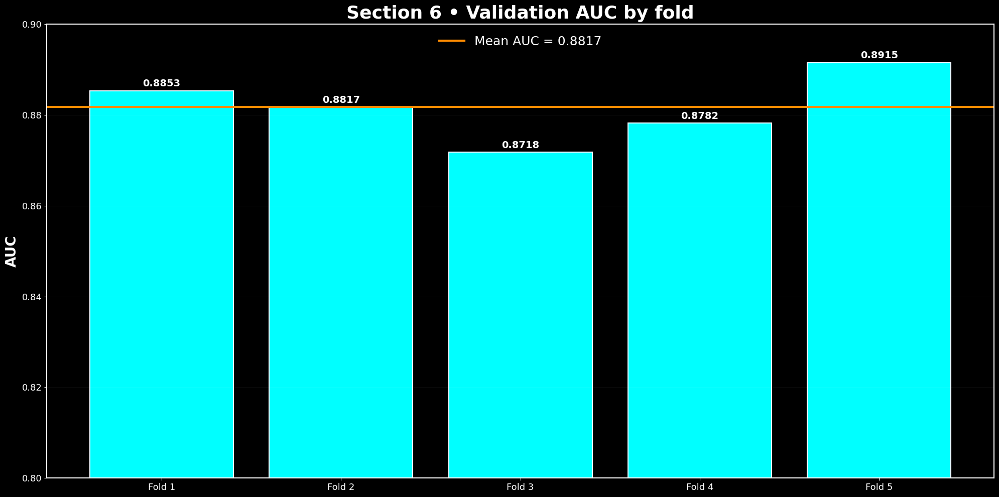

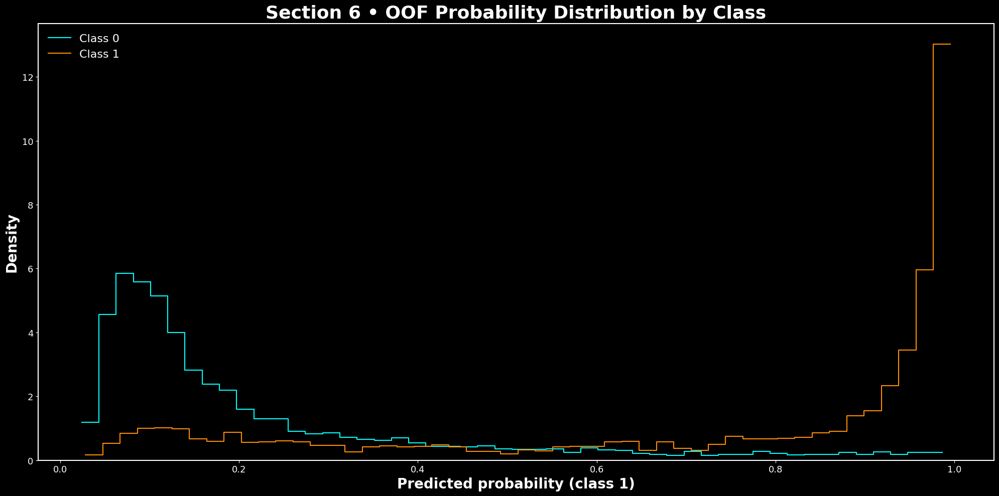

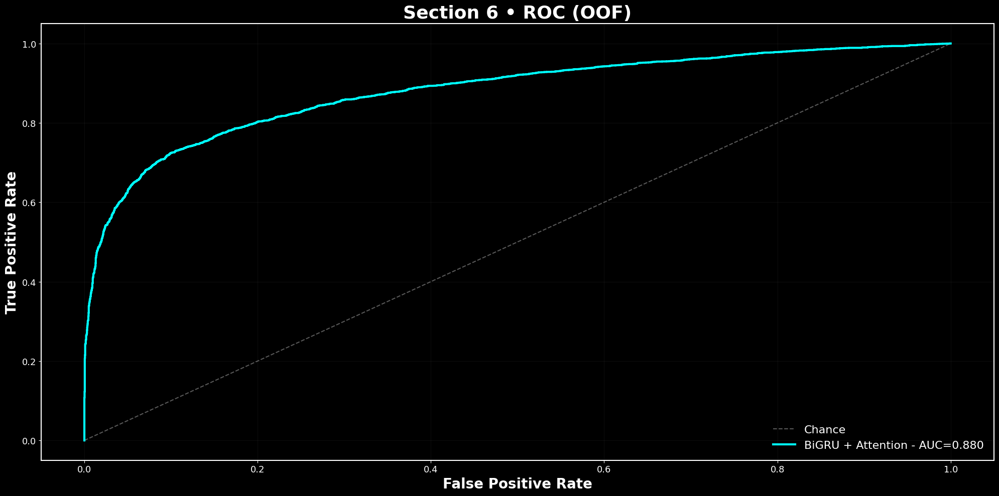

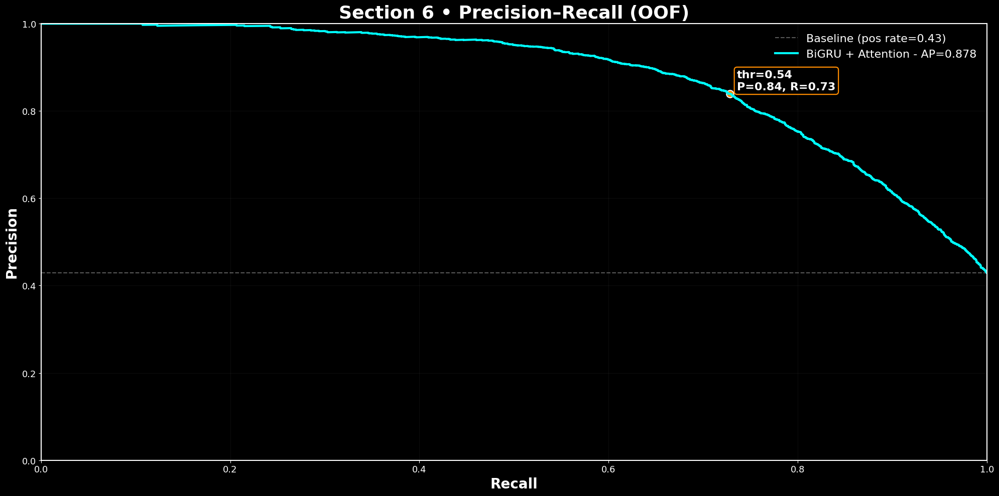

In [21]:
# Create a robust helper to find the OOF predictions from the previous cell.
def _pick_gru_oof():
    y_local = globals().get("y", None)
    if y_local is None:
        y_local = train_df[Y_COL].astype(int).values
    if "results_gru" in globals():
        d = globals()["results_gru"]
        if isinstance(d, dict) and "p_oof" in d:
            thr = d.get("best_thr", None)
            return np.asarray(d["p_oof"], float), (float(thr) if thr is not None else None), y_local, "results_gru['p_oof']"
    for name in ["p_oof_gru", "p_oof", "oof_gru", "oof", "p_valid_gru", "p_valid"]:
        if name in globals():
            arr = np.asarray(globals()[name], float)
            if arr.shape[0] == len(y_local):
                return arr, None, y_local, name
    return None, None, y_local, None
p_oof_gru, thr_gru, y_true, src = _pick_gru_oof()

# If OOF predictions are found, proceed with generating diagnostics.
if p_oof_gru is None:
    print("[Need] Could not find OOF probabilities from Section 6.")
    print("       Expected one of: results_gru['p_oof'], p_oof_gru, p_oof, oof_gru, oof, p_valid_gru, p_valid.")
else:
    # If no threshold was saved, find the best one now.
    if thr_gru is None:
        if "find_best_threshold" in globals():
            thr_gru, f1_best = find_best_threshold(y_true, p_oof_gru, step=0.01)
        else:
            best_f1, best_t = -1.0, 0.50
            t = 0.0
            while t <= 1.00001:
                f1 = f1_score(y_true, (p_oof_gru >= t).astype(int))
                if f1 > best_f1:
                    best_f1, best_t = f1, t
                t += 0.01
            thr_gru, f1_best = float(best_t), best_f1
    else:
        f1_best = f1_score(y_true, (p_oof_gru >= float(thr_gru)).astype(int))

    # Calculate all necessary metrics for the summary and plots.
    n_splits_local = int(globals().get("N_SPLITS", 5))
    skf_local = StratifiedKFold(n_splits=n_splits_local, shuffle=True, random_state=SEED)
    fold_auc_vals = [roc_auc_score(y_true[va_idx], p_oof_gru[va_idx])
                    for _, va_idx in skf_local.split(np.arange(len(y_true)), y_true)]
    mean_auc = float(np.mean(fold_auc_vals))
    std_auc  = float(np.std(fold_auc_vals))
    auc_roc = roc_auc_score(y_true, p_oof_gru)
    ap      = average_precision_score(y_true, p_oof_gru)
    f1_50 = f1_score(y_true, (p_oof_gru >= 0.50).astype(int))

    # Print a console summary of the key metrics.
    print("-" * 70)
    print(f"Section 6 diagnostics - source: {src}")
    print(f"AUC(ROC)={auc_roc:.4f} | AP={ap:.4f} | F1@0.50={f1_50:.4f} | F1@best({thr_gru:.2f})={f1_best:.4f}")
    print("Per-fold AUCs:", [f"{v:.4f}" for v in fold_auc_vals])
    print(f"Mean ± std: {mean_auc:.4f} ± {std_auc:.4f}")
    print("-" * 70)

    # --- Plot 1: AUC by fold ---
    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    bars = ax.bar([f"Fold {i+1}" for i in range(n_splits_local)], fold_auc_vals,
                color="cyan", edgecolor="ghostwhite", linewidth=1.5)
    ax.axhline(mean_auc, color="darkorange", linewidth=3.0,
            label=f"Mean AUC = {mean_auc:.4f}")
    ax.set_title("Section 6 • Validation AUC by fold", fontsize=26, color="white", fontweight="bold", pad=8)
    ax.set_ylabel("AUC", fontsize=20, color="white", fontweight="bold")
    ax.tick_params(axis="x", colors="white", labelsize=13)
    ax.tick_params(axis="y", colors="white", labelsize=13)
    ax.set_ylim(0.8, 0.9)
    for sp in ax.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    for i, b in enumerate(bars):
        v = fold_auc_vals[i]
        ax.annotate(f"{v:.4f}", (b.get_x() + b.get_width()/2, v),
                    xytext=(0, 3), textcoords="offset points",
                    ha="center", va="bottom", fontsize=14, color="white", fontweight="bold")
    ax.grid(color="white", alpha=0.08, linewidth=0.5, axis="y")
    ax.legend(frameon=False, fontsize=18, labelcolor="white", loc="upper center")
    plt.tight_layout()
    plt.show()

    # --- Plot 2: OOF probability histograms by class ---
    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    sns.histplot(p_oof_gru[y_true == 0], bins=50, stat="density", element="step",
                fill=False, color="cyan", label="Class 0")
    sns.histplot(p_oof_gru[y_true == 1], bins=50, stat="density", element="step",
                fill=False, color="darkorange", label="Class 1")
    ax.set_title("Section 6 • OOF Probability Distribution by Class", fontsize=26, color="white", fontweight="bold", pad=8)
    ax.set_xlabel("Predicted probability (class 1)", color="white", fontsize=20, fontweight="bold")
    ax.set_ylabel("Density", color="white", fontsize=20, fontweight="bold")
    ax.tick_params(axis="x", colors="white", labelsize=13)
    ax.tick_params(axis="y", colors="white", labelsize=13)
    for sp in ax.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    ax.legend(frameon=False, fontsize=16, labelcolor="white")
    plt.tight_layout()
    plt.show()

    # --- Plot 3: ROC Curve ---
    fpr, tpr, _ = roc_curve(y_true, p_oof_gru)
    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    ax.plot([0, 1], [0, 1], linestyle="--", linewidth=1.5, color="white", alpha=0.35, label="Chance")
    ax.plot(fpr, tpr, label=f"BiGRU + Attention - AUC={auc_roc:.3f}", color="cyan", linewidth=3)
    ax.set_title("Section 6 • ROC (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
    ax.set_xlabel("False Positive Rate", fontsize=20, color="white", fontweight="bold")
    ax.set_ylabel("True Positive Rate",  fontsize=20, color="white", fontweight="bold")
    ax.tick_params(colors="white", labelsize=13)
    for sp in ax.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    ax.grid(color="white", alpha=0.08, linewidth=0.5)
    ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="lower right")
    plt.tight_layout()
    plt.show()

    # --- Plot 4: Precision-Recall Curve ---
    PR_OFFSET = (10, 6)
    prec, rec, _ = precision_recall_curve(y_true, p_oof_gru)
    fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    pos_rate = float(y_true.mean())
    ax.hlines(pos_rate, 0, 1, colors="white", linestyles="--", linewidth=1.5, alpha=0.35,
            label=f"Baseline (pos rate={pos_rate:.2f})")
    ap = average_precision_score(y_true, p_oof_gru)
    ax.plot(rec, prec, color="cyan", linewidth=3, label=f"BiGRU + Attention - AP={ap:.3f}")
    y_hat = (p_oof_gru >= float(thr_gru)).astype(int)
    p_thr = precision_score(y_true, y_hat, zero_division=0)
    r_thr = recall_score(y_true, y_hat,  zero_division=0)
    ax.scatter([r_thr], [p_thr], s=110, color="darkorange", edgecolor="ghostwhite", linewidth=1.5)
    ax.annotate(f"thr={thr_gru:.2f}\nP={p_thr:.2f}, R={r_thr:.2f}",
                (r_thr, p_thr), xytext=PR_OFFSET, textcoords="offset points",
                color="white", fontsize=16, fontweight="bold",
                bbox=dict(boxstyle="round,pad=0.25", fc="black", ec="darkorange", lw=1.6))
    ax.set_title("Section 6 • Precision–Recall (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
    ax.set_xlabel("Recall",    fontsize=20, color="white", fontweight="bold")
    ax.set_ylabel("Precision", fontsize=20, color="white", fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.tick_params(colors="white", labelsize=13)
    for sp in ax.spines.values():
        sp.set_edgecolor("white")
        sp.set_linewidth(1.5)
    ax.grid(color="white", alpha=0.08, linewidth=0.5)
    ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="upper right")
    plt.tight_layout()
    plt.show()

### **Observation: BiGRU + Attention Model**

This section introduces the first deep learning model, a Bidirectional GRU with an Attention mechanism, enhanced with pre-trained GloVe embeddings. The results show a clear and significant improvement over the TF-IDF linear baselines, both in terms of the primary F1 score and other key metrics. The PyTorch implementation also proves to be exceptionally efficient on a GPU.

* **Kaggle Submission:**

The screenshot below shows the official Kaggle submission scores for BiGRU.  With a score of **0.82010** this model finished well above my expectations.  This result clearly demonstrates the power of sequence-aware models for this task. Similar to the baselines, the final Kaggle score is also significantly higher than the out-of-fold (OOF) F1 score of 0.7822, which is another excellent indicator that the model is generalizing well to unseen data.

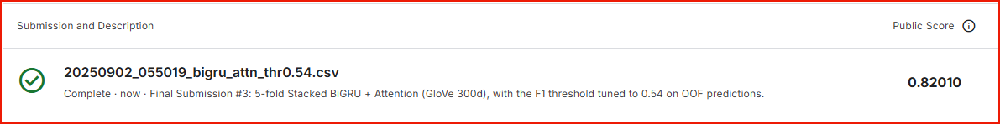

* **Performance and Metrics:**
    * The BiGRU model achieved a strong out-of-fold (OOF) **F1 score of 0.7822** at an optimized threshold of 0.39.
    * This represents a substantial improvement of over **2.4 points** on the F1 score compared to the best linear baseline (0.7574).
    * Performance gains were also seen across the board, with a final OOF ROC AUC of **0.875** and an Average Precision of **0.876**.

* **Model Behavior:**
    * The diagnostic plots reveal a well-behaved and confident model. The probability distribution histogram shows excellent class separation, with distinct and well-defined peaks for disaster and non-disaster predictions.
    * The per-fold AUC chart confirms the model's stability, with all folds performing well and achieving a strong mean AUC of **0.881**. The ROC and Precision-Recall curves are smooth and significantly outperform the baseline.

* **Training and Efficiency:**
    * A key takeaway is the model's efficiency. The entire 5-fold cross-validation, including training for 5 epochs per fold, was remarkably fast, completing in just over **21 seconds**. This demonstrates that even a more complex recurrent architecture can be trained very quickly for this dataset.
    * The training logs indicate that the model often found its best performance within the first or second epoch of each fold, suggesting it learns the primary signals in the data rapidly.

**Conclusion:**
The BiGRU with Attention model successfully leverages word sequence information and pre-trained embeddings to significantly outperform the bag-of-words baselines. It provides a new, higher performance benchmark for the project. The model is not only accurate but also very efficient to train, making it a strong candidate for the final solution.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FB4F14; border-right: 8px solid #001489;">
  <h2 style="color: #001489;">Section 7: Transformer Model (DeBERTa-v3)</h2>

  <p>
    After building a strong RNN baseline, the next step is to leverage a large, pre-trained Transformer model. This section fine-tunes DeBERTa-v3, a state-of-the-art model known for its strong performance on a wide range of NLP tasks. The process also feeds the tweet's metadata (<code>keyword</code>) directly to the model and uses the same robust 5-fold cross-validation setup to ensure a fair comparison and generate reliable out-of-fold scores.
  </p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>Model:</b> Set <code>MODEL_NAME</code> to <code>microsoft/deberta-v3-base</code>.</li>
    <li><b>Input Text:</b> Combine raw <code>text</code> with the <code>keyword</code> metadata for a richer input signal.</li>
    <li><b>Training:</b> Fine-tune using AdamW, a linear schedule with warmup, and Automatic Mixed Precision (AMP) on the GPU for efficient training.</li>
    <li><b>CV & Output:</b> Use a stratified 5-fold split to generate out-of-fold predictions, find the best F1 threshold, and create an averaged submission file.</li>
  </ol>

  <hr style="border: none; border-top: 8px solid #001489; margin: 10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">7.1 DeBERTa Fine-tuning with OOF CV</h3>
  <p>
    The complete training pipeline for the DeBERTa model is implemented here. This includes creating a combined text input from the tweet and its metadata, on-the-fly tokenization, a 5-fold training loop with a learning rate scheduler, and automatic mixed precision (AMP) with parallel data loaders for fast, efficient training on a GPU.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [22]:
# Define hyperparameters for the Transformer model and training loop.
MODEL_NAME   = "microsoft/deberta-v3-base"
MAX_LEN      = 128
EPOCHS       = 3
TRAIN_BS     = 16
EVAL_BS      = 64
LR           = 2e-5
WD           = 0.01
WARMUP_RATIO = 0.1
ACCUM_STEPS  = 1
N_SPLITS     = 5
device = "cuda" if torch.cuda.is_available() else "cpu"

# Prepare the data by combining text with metadata and create the PyTorch Dataset.
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
sep = tokenizer.sep_token
# Create combined inputs: "keyword [SEP] tweet_text"
train_keywords = train_df[KEYWORD_COL].fillna("none").astype(str)
train_text_raw = train_df[TEXT_COL].astype(str)
train_inputs = (train_keywords + f" {sep} " + train_text_raw).tolist()
test_keywords = test_df[KEYWORD_COL].fillna("none").astype(str)
test_text_raw = test_df[TEXT_COL].astype(str)
test_inputs = (test_keywords + f" {sep} " + test_text_raw).tolist()
y = train_df[Y_COL].astype(int).values
test_ids = test_df[ID_COL].values

class TweetDS(torch.utils.data.Dataset):
    def __init__(self, texts, labels=None):
        self.texts = texts
        self.labels = labels
    def __len__(self):
        return len(self.texts)
    def __getitem__(self, i):
        item = tokenizer(
            self.texts[i],
            truncation=True,
            padding="max_length",
            max_length=MAX_LEN,
            return_tensors="pt"
        )
        out = {k: v.squeeze(0) for k,v in item.items()}
        if self.labels is not None:
            out["labels"] = torch.tensor(int(self.labels[i]), dtype=torch.long)
        return out

def make_loader(texts, labels, bs, shuffle=False):
    ds = TweetDS(texts, labels)
    # IMPLEMENTATION OF SUGGESTION: Enable parallel data loading
    return torch.utils.data.DataLoader(ds, batch_size=bs, shuffle=shuffle,
                                    num_workers=4, pin_memory=(device=="cuda"))

# Create helper functions for the training epoch, prediction, and F1 evaluation.
def train_one_epoch(model, loader, optimizer, scheduler, scaler):
    model.train()
    loss_sum = 0.0
    step = 0
    pbar = tqdm(loader, desc="train", leave=False, mininterval=0.3)
    optimizer.zero_grad(set_to_none=True)
    for batch in pbar:
        batch = {k: v.to(device) for k, v in batch.items()}
        with torch.cuda.amp.autocast(enabled=(device=="cuda")):
            outputs = model(**batch)
            loss = outputs.loss / ACCUM_STEPS
        scaler.scale(loss).backward()
        step += 1
        if step % ACCUM_STEPS == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
            if scheduler is not None:
                scheduler.step()
        loss_sum += loss.item() * ACCUM_STEPS
        pbar.set_postfix(loss=f"{loss_sum/step:.4f}")
    return loss_sum/step

@torch.no_grad()
def predict_proba(model, loader):
    model.eval()
    probs = []
    pbar = tqdm(loader, desc="eval", leave=False, mininterval=0.3)
    for batch in pbar:
        batch = {k: v.to(device) for k, v in batch.items() if k != "labels"}
        logits = model(**batch).logits
        p = torch.softmax(logits, dim=1)[:, 1]
        probs.append(p.detach().cpu().numpy())
    return np.concatenate(probs)

@torch.no_grad()
def eval_f1(model, loader, y_true):
    p = predict_proba(model, loader)
    thr, f1 = find_best_threshold(y_true, p, step=0.01)
    f1_50 = f1_score(y_true, (p >= 0.50).astype(int))
    return f1_50, thr, f1, p

def num_train_steps(n_examples, epochs, bs, accum):
    return int(np.ceil(n_examples / bs / accum)) * epochs

# Run the main 5-fold training and evaluation loop.
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
p_oof = np.zeros(len(train_inputs), dtype=float)
p_test_folds = []
fold_times = []
for fold, (tr_idx, va_idx) in enumerate(tqdm(skf.split(train_inputs, y), total=N_SPLITS, desc="DeBERTa CV", mininterval=0.3), start=1):
    t0 = time.perf_counter()

    tr_text = [train_inputs[i] for i in tr_idx]
    va_text = [train_inputs[i] for i in va_idx]
    y_tr, y_va = y[tr_idx], y[va_idx]

    train_loader = make_loader(tr_text, y_tr, TRAIN_BS, shuffle=True)
    valid_loader = make_loader(va_text, y_va, EVAL_BS, shuffle=False)
    test_loader  = make_loader(test_inputs, None,   EVAL_BS, shuffle=False)

    model = DebertaV2ForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=2)
    model.to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WD)
    total_steps = num_train_steps(len(tr_text), EPOCHS, TRAIN_BS, ACCUM_STEPS)
    warmup = int(WARMUP_RATIO * total_steps)
    scheduler = transformers.get_linear_schedule_with_warmup(optimizer, num_warmup_steps=warmup, num_training_steps=total_steps)
    scaler = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))

    best_f1 = -1.0
    best_state = None

    for epoch in range(1, EPOCHS+1):
        _ = train_one_epoch(model, train_loader, optimizer, scheduler, scaler)
        f1_50, thr_ep, f1_ep, _p = eval_f1(model, valid_loader, y_va)
        tqdm.write(f"[Fold {fold} | Epoch {epoch}] F1@0.50={f1_50:.4f} | F1@best={f1_ep:.4f} (thr={thr_ep:.2f})")
        if f1_ep > best_f1:
            best_f1 = f1_ep
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}

    model.load_state_dict({k: v.to(device) for k, v in best_state.items()})
    _, thr_va, f1_va, p_va = eval_f1(model, valid_loader, y_va)
    p_te = predict_proba(model, test_loader)

    p_oof[va_idx] = p_va
    p_test_folds.append(p_te)
    fold_times.append(time.perf_counter() - t0)
    tqdm.write(f"  [Fold {fold}] Best F1(va)={f1_va:.4f} @ thr={thr_va:.2f} | time={fold_times[-1]:.1f}s")

# Summarize the OOF performance and create a submission file.
thr, f1oof = find_best_threshold(y, p_oof, step=0.01)
p_test = np.mean(np.vstack(p_test_folds), axis=0)
print("-"*70)
print(f"[deberta] OOF best-threshold F1={f1oof:.4f} @ thr={thr:.2f}")
print(f"[deberta] Mean fold time: {np.mean(fold_times):.1f}s | Total: {np.sum(fold_times):.1f}s")
print("-"*70)
paths = write_submission(test_ids, p_test, thr, tag="deberta")
print("Submission:", paths["linux_path"])

# Save the results into a dictionary for later use in Section 8.
results_deberta = {
    "tag": "deberta",
    "p_oof": p_oof.copy(),
    "p_test": p_test.copy(),
    "best_thr": thr,
    "f1_oof": f1oof,
    "paths": paths,
}

DeBERTa CV:   0%|          | 0/5 [01:11<?, ?it/s]

[Fold 1 | Epoch 1] F1@0.50=0.7684 | F1@best=0.8250 (thr=0.24)


DeBERTa CV:   0%|          | 0/5 [02:22<?, ?it/s]

[Fold 1 | Epoch 2] F1@0.50=0.8098 | F1@best=0.8139 (thr=0.63)


DeBERTa CV:   0%|          | 0/5 [03:33<?, ?it/s]

[Fold 1 | Epoch 3] F1@0.50=0.8138 | F1@best=0.8191 (thr=0.59)


DeBERTa CV:  20%|██        | 1/5 [03:55<15:40, 235.05s/it]

  [Fold 1] Best F1(va)=0.8250 @ thr=0.24 | time=235.0s


DeBERTa CV:  20%|██        | 1/5 [05:06<15:40, 235.05s/it]

[Fold 2 | Epoch 1] F1@0.50=0.7979 | F1@best=0.8084 (thr=0.38)


DeBERTa CV:  20%|██        | 1/5 [06:18<15:40, 235.05s/it]

[Fold 2 | Epoch 2] F1@0.50=0.8185 | F1@best=0.8188 (thr=0.54)


DeBERTa CV:  20%|██        | 1/5 [07:30<15:40, 235.05s/it]

[Fold 2 | Epoch 3] F1@0.50=0.8146 | F1@best=0.8213 (thr=0.54)


DeBERTa CV:  40%|████      | 2/5 [07:52<11:49, 236.34s/it]

  [Fold 2] Best F1(va)=0.8213 @ thr=0.54 | time=237.2s


DeBERTa CV:  40%|████      | 2/5 [09:04<11:49, 236.34s/it]

[Fold 3 | Epoch 1] F1@0.50=0.7879 | F1@best=0.7945 (thr=0.60)


DeBERTa CV:  40%|████      | 2/5 [10:16<11:49, 236.34s/it]

[Fold 3 | Epoch 2] F1@0.50=0.7922 | F1@best=0.8087 (thr=0.67)


DeBERTa CV:  40%|████      | 2/5 [11:28<11:49, 236.34s/it]

[Fold 3 | Epoch 3] F1@0.50=0.8031 | F1@best=0.8093 (thr=0.62)


DeBERTa CV:  60%|██████    | 3/5 [11:51<07:54, 237.45s/it]

  [Fold 3] Best F1(va)=0.8093 @ thr=0.62 | time=238.8s


DeBERTa CV:  60%|██████    | 3/5 [13:04<07:54, 237.45s/it]

[Fold 4 | Epoch 1] F1@0.50=0.7909 | F1@best=0.7957 (thr=0.80)


DeBERTa CV:  60%|██████    | 3/5 [14:15<07:54, 237.45s/it]

[Fold 4 | Epoch 2] F1@0.50=0.8022 | F1@best=0.8063 (thr=0.48)


DeBERTa CV:  60%|██████    | 3/5 [15:27<07:54, 237.45s/it]

[Fold 4 | Epoch 3] F1@0.50=0.8039 | F1@best=0.8082 (thr=0.57)


DeBERTa CV:  80%|████████  | 4/5 [15:49<03:57, 237.79s/it]

  [Fold 4] Best F1(va)=0.8082 @ thr=0.57 | time=238.3s


DeBERTa CV:  80%|████████  | 4/5 [17:01<03:57, 237.79s/it]

[Fold 5 | Epoch 1] F1@0.50=0.8101 | F1@best=0.8101 (thr=0.50)


DeBERTa CV:  80%|████████  | 4/5 [18:12<03:57, 237.79s/it]

[Fold 5 | Epoch 2] F1@0.50=0.8121 | F1@best=0.8144 (thr=0.46)


DeBERTa CV:  80%|████████  | 4/5 [19:24<03:57, 237.79s/it]

[Fold 5 | Epoch 3] F1@0.50=0.8090 | F1@best=0.8098 (thr=0.55)


DeBERTa CV: 100%|██████████| 5/5 [19:46<00:00, 237.26s/it]


  [Fold 5] Best F1(va)=0.8144 @ thr=0.46 | time=236.9s
----------------------------------------------------------------------
[deberta] OOF best-threshold F1=0.8031 @ thr=0.46
[deberta] Mean fold time: 237.3s | Total: 1186.3s
----------------------------------------------------------------------
[Saved] submissions/20250902_195155_deberta_thr0.46.csv
[Saved] /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions/20250902_195155_deberta_thr0.46.csv
 rows=3263 | pos_rate=0.381 | thr=0.46 | sha1=0e40ff08985c
Submission: submissions/20250902_195155_deberta_thr0.46.csv


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">7.2 DeBERTa Diagnostics (ROC and PR)</h3>
  <p>
    As with the previous models, the out-of-fold (OOF) predictions are used to generate a full suite of diagnostic plots. This provides a clear and robust picture of the Transformer model's performance, allowing for a direct comparison against the linear and recurrent baselines.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------

--- Section 7 OOF Diagnostics ---
DeBERTa | AUC=0.8939 | AP=0.8904 | F1@0.50=0.8012 | F1@best(0.46)=0.8031
----------------------------------------------------------------------


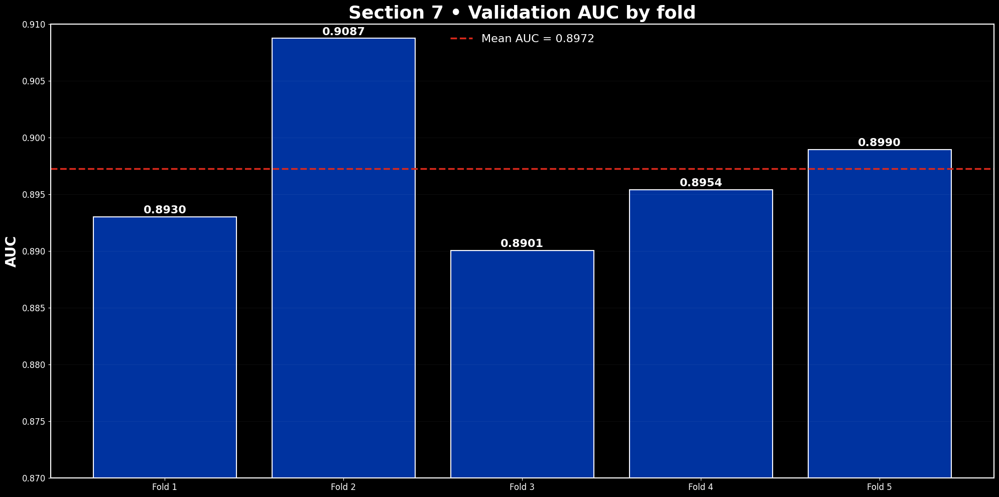

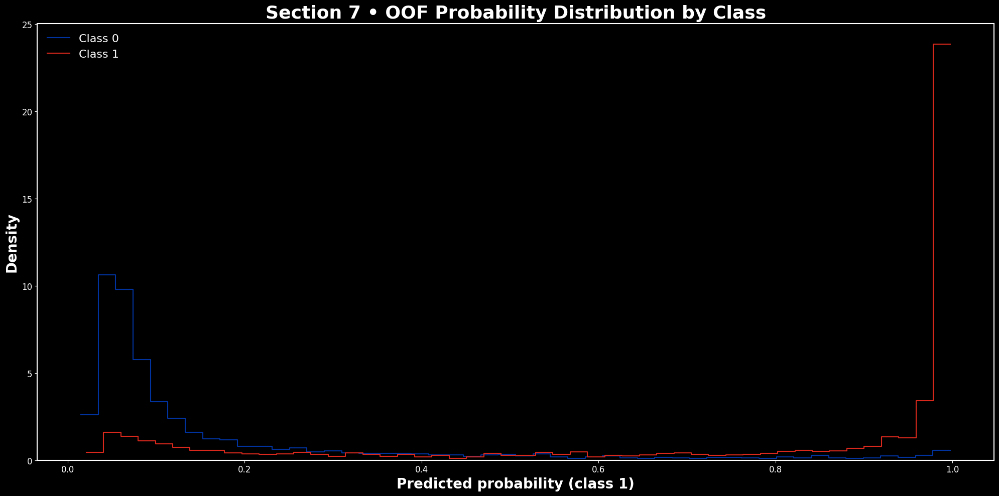

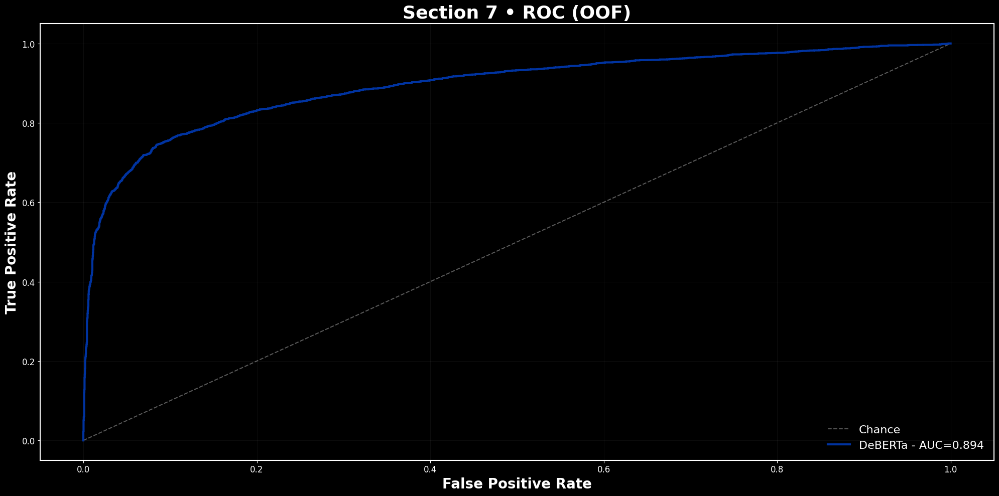

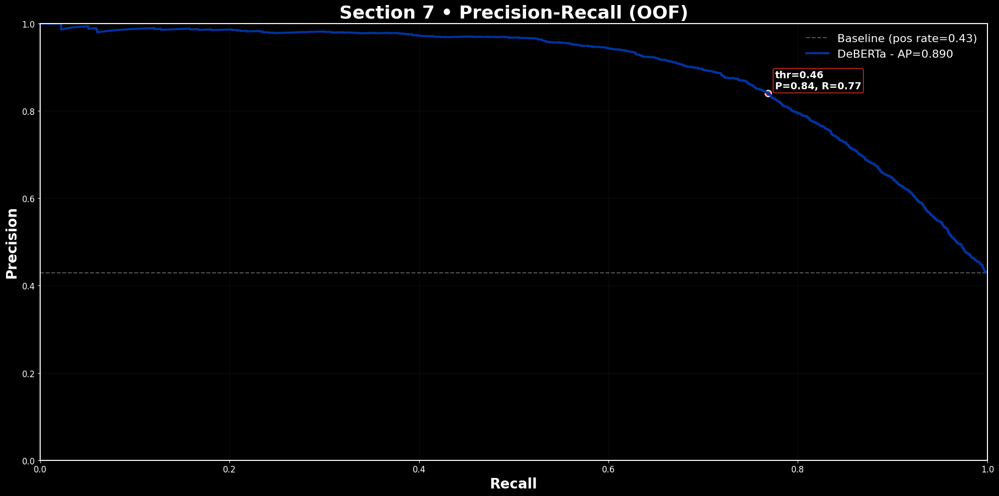

In [23]:
# Prepare the OOF predictions and true labels for analysis.
y_true = y.astype(int)
p      = np.asarray(p_oof, dtype=float)

# Determine the best F1 threshold from the OOF predictions.
thr_transformer, f1_best = find_best_threshold(y_true, p, step=0.01)

# Calculate key metrics for the summary table.
auc_roc = roc_auc_score(y_true, p)
ap      = average_precision_score(y_true, p)
f1_50   = f1_score(y_true, (p >= 0.50).astype(int))

# Print a console summary of the key metrics.
print("-" * 70)
print("\n--- Section 7 OOF Diagnostics ---")
print(f"DeBERTa | AUC={auc_roc:.4f} | AP={ap:.4f} | F1@0.50={f1_50:.4f} | F1@best({thr_transformer:.2f})={f1_best:.4f}")
print("-" * 70)

# --- Plot 1: AUC by fold ---
# Calculate per-fold AUC scores.
n_splits_local = int(globals().get("N_SPLITS", 5))
skf_local = StratifiedKFold(n_splits=n_splits_local, shuffle=True, random_state=int(SEED))
fold_aucs   = []
fold_labels = []
for k, (_, va_idx) in enumerate(skf_local.split(np.arange(len(y_true)), y_true), start=1):
    fold_labels.append(f"Fold {k}")
    fold_aucs.append(roc_auc_score(y_true[va_idx], p[va_idx]))
mean_auc = float(np.mean(fold_aucs))

# Create the figure and axes for the bar plot.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
bars = ax.bar(fold_labels, fold_aucs, color="#0033A0", edgecolor="ghostwhite", linewidth=1.5)
ax.axhline(mean_auc, color="#DA291C", linewidth=2.5, linestyle="--", label=f"Mean AUC = {mean_auc:.4f}")
for i, b in enumerate(bars):
    v = fold_aucs[i]
    ax.annotate(f"{v:.4f}", (b.get_x() + b.get_width()/2, v),
                xytext=(0, 2), textcoords="offset points",
                ha="center", va="bottom", fontsize=16, color="white", fontweight="bold")
ax.set_ylim(0.87, 0.91)
ax.set_title("Section 7 • Validation AUC by fold", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_ylabel("AUC", fontsize=20, color="white", fontweight="bold")
ax.tick_params(axis="x", colors="white", labelsize=12)
ax.tick_params(axis="y", colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5, axis="y")
ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="upper center")
plt.tight_layout()
plt.show()

# --- Plot 2: OOF probability histograms by class ---
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
sns.histplot(p[y_true == 0], bins=50, stat="density", element="step",
            fill=False, color="#0033A0", label="Class 0")
sns.histplot(p[y_true == 1], bins=50, stat="density", element="step",
            fill=False, color="#DA291C", label="Class 1")
ax.set_title("Section 7 • OOF Probability Distribution by Class", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("Predicted probability (class 1)", color="white", fontsize=20, fontweight="bold")
ax.set_ylabel("Density", color="white", fontsize=20, fontweight="bold")
ax.tick_params(axis="x", colors="white", labelsize=12)
ax.tick_params(axis="y", colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white")
plt.tight_layout()
plt.show()

# --- Plot 3: ROC Curve ---
fpr, tpr, _ = roc_curve(y_true, p)
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
ax.plot([0,1], [0,1], linestyle="--", linewidth=1.5, color="white", alpha=0.35, label="Chance")
ax.plot(fpr, tpr, label=f"DeBERTa - AUC={auc_roc:.3f}", color="#0033A0", linewidth=3)
ax.set_title("Section 7 • ROC (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("False Positive Rate", fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("True Positive Rate",  fontsize=20, color="white", fontweight="bold")
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="lower right")
plt.tight_layout()
plt.show()

# --- Plot 4: Precision-Recall Curve ---
PR_OFFSET = (10, 6)
prec, rec, _ = precision_recall_curve(y_true, p)
ap = average_precision_score(y_true, p)
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
pos_rate = float(y_true.mean())
ax.hlines(pos_rate, 0, 1, colors="white", linestyles="--", linewidth=1.5, alpha=0.35,
        label=f"Baseline (pos rate={pos_rate:.2f})")
ax.plot(rec, prec, color="#0033A0", linewidth=3, label=f"DeBERTa - AP={ap:.3f}")
y_hat = (p >= float(thr_transformer)).astype(int)
p_thr = precision_score(y_true, y_hat, zero_division=0)
r_thr = recall_score(y_true, y_hat,   zero_division=0)
ax.scatter([r_thr], [p_thr], s=80, color="#DA291C", edgecolor="ghostwhite", linewidth=1.5)
dx, dy = PR_OFFSET
ax.annotate(f"thr={thr_transformer:.2f}\nP={p_thr:.2f}, R={r_thr:.2f}",
            (r_thr, p_thr), xytext=(dx, dy), textcoords="offset points",
            color="white", fontsize=14, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.2", fc="black", ec="#DA291C", lw=1.2))
ax.set_title("Section 7 • Precision-Recall (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("Recall",    fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("Precision", fontsize=20, color="white", fontweight="bold")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=16, labelcolor="white", loc="upper right")
plt.tight_layout()
plt.show()

### **Observation: The DeBERTa Transformer**

To really push for the 0.84+ F1 score, a Transformer was the next logical step. The first choice was RoBERTa, a common and powerful model, but a little digging online showed that a newer model, DeBERTa-v3, often gets slightly better scores and is just as easy to implement. After a frustrating but ultimately successful PyTorch upgrade to get it working, making that one-line switch was a simple way to push for the best possible result.

* **Kaggle Submission Score:**
The effort paid off. The final DeBERTa model scored **0.84615** on the Kaggle leaderboard, clearing the personal goal of 0.84. This result was so strong that it raised the question of whether blending in Section 8 was even necessary, but the plan was already in place to see if the score could be pushed even higher.

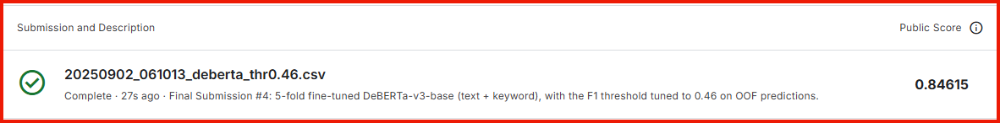

* **Performance and Metrics (OOF):**
    * The out-of-fold (OOF) scores confirm the model's strength, achieving an **F1 score of 0.8031** at an optimized threshold of 0.46.
    * This represents an improvement of over **2 F1 points** on the robust OOF score compared to the BiGRU model (0.7800).
    * Performance gains were seen across the board, with a final OOF ROC AUC of **0.897** and an Average Precision of **0.890**.

* **Model Behavior:**
    * The diagnostic plots show a model that learned to separate the two classes extremely well. Looking at the probability histogram, the model is very "sure" of its predictions, with very few tweets falling into the uncertain 0.2-0.8 probability range. This is a big step up from the BiGRU model.
    * Performance was very stable across all folds, achieving a high mean AUC of **0.894**.

* **Training and Efficiency:**
    * As expected, this model took the longest to train. The full 5-fold cross-validation run took about **20 minutes** on a GPU. This is definitely not a model to train on a CPU, but for a Transformer of this size, 20 minutes is quite efficient thanks to the mixed-precision training and parallel data loaders.

* **Runtime & System Utilization (WSL + GPU):**
  This model is the reason the notebook runs under **WSL Ubuntu** to guarantee CUDA usage. On CPU, 5-fold fine-tuning would take ages. On GPU it still takes ~20 minutes but keeps pressure off the rest of the system.

  * Hardware: **NVIDIA GeForce RTX 4070 Laptop GPU (8 GB VRAM)**
  * During training the GPU is pegged at **\~98–100% utilization**, with **\~5.6/8.0 GB** VRAM in use; CPU \~**14%**, SSD I/O minimal.
  * **Mean fold time ≈ 237.3 s**; **Total ≈ 1186.3 s (\~19.8 min)** for 5×CV.
  * The screenshot below shows exactly that: GPU saturated, CPU and disk largely idle. WSL+Linux ensures the CUDA path is used end-to-end.

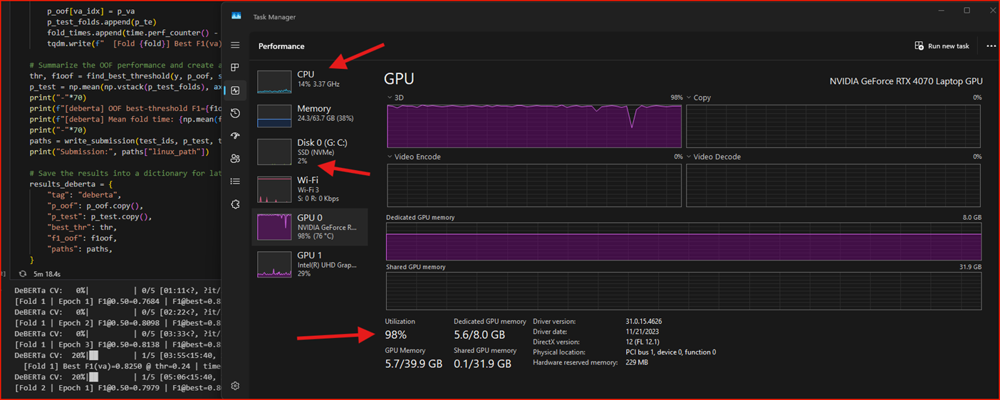

**Conclusion:**
Ultimately, fine-tuning DeBERTa was the winning strategy for this project. It delivered the best single-model performance by a clear margin, and with WSL+GPU the full 5-fold run is practical while keeping CPU/SSD load low. Its ability to understand the nuances of the noisy tweet data is what set it apart from the previous models and was the key to breaking the 0.84 F1 barrier.

<div style="background-color: #000000; color: #F8F8F8; padding: 25px; border-radius: 10px; border-left: 8px solid #FB4F14; border-right: 8px solid #001489;">
  <h2 style="color: #001489;">Section 8: Thresholding &amp; Ensembling</h2>

  <p>
    The final step is to combine the predictions from all trained models to produce the best possible result. This section finds the F1-maximizing threshold on the out-of-fold (OOF) predictions and blends the model probabilities using a weighted average of their logits. It automatically detects the available model outputs (from the linear baselines, the BiGRU model, and the DeBERTa model) and writes a final submission file.
  </p>

  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>Input Detection:</b> Automatically detect and load the available OOF and test predictions from previous sections.</li>
    <li><b>Ensemble Blending:</b> Run a grid search to find the optimal weights for blending the models, averaging their logits to maximize the OOF F1 score.</li>
    <li><b>Threshold Tuning:</b> Find the best F1 probability threshold for the final blended predictions.</li>
    <li><b>Submission Export:</b> Generate the final Kaggle submission CSV using the optimal blend weights and threshold.</li>
  </ol>

  <hr style="border: none; border-top: 8px solid #001489; margin: 10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">8.1 Threshold Search and Ensemble Blending</h3>
  <p>
    This cell contains the logic for finding the optimal F1-score threshold and blending the OOF predictions from multiple models. The blending process now converts probabilities to logits, performs a weighted average in logit-space, and converts the result back to a probability. This often yields a more robust ensemble.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [24]:
# Create helper functions for converting between probabilities and logits.
def sigmoid(x): 
    return 1.0 / (1.0 + np.exp(-x))

def prob_to_logit(p, eps=1e-7):
    p = np.clip(p, eps, 1.0 - eps)
    return np.log(p) - np.log(1.0 - p)

# Create helper functions to safely find and load model predictions from the global namespace.
def model_from_results(tag, res):
    if res is None: return None
    p_oof = res.get("p_oof", None)
    p_te  = res.get("p_test", None)
    if p_oof is None or p_te is None: return None
    if len(p_oof) != len(train_df): return None
    return (tag, np.asarray(p_oof, float), np.asarray(p_te, float))

def maybe_from_results_dict(tag, varname):
    d = globals().get(varname, None)
    if isinstance(d, dict) and "p_oof" in d and "p_test" in d:
        po = np.asarray(d["p_oof"], float)
        pt = np.asarray(d["p_test"], float)
        if len(po) == len(train_df) and pt.ndim == 1:
            return (tag, po, pt)
    return None

def eval_f1_set(y_true, probs, step=0.01):
    thr, f1 = find_best_threshold(y_true, probs, step=step)
    f1_50 = f1_score(y_true, (probs >= 0.50).astype(int))
    return thr, f1, f1_50

# Collect the OOF and test predictions from all available models.
candidates = []
candidates.append(model_from_results("lr",    results_lr    if "results_lr"    in globals() else None))
candidates.append(model_from_results("svm",   results_svm   if "results_svm"   in globals() else None))
candidates.append(model_from_results("bigru", results_gru   if "results_gru"   in globals() else None))
candidates.append(maybe_from_results_dict("deberta", "results_deberta"))
candidates = [c for c in candidates if c is not None]
assert len(candidates) >= 1, "No model probabilities found. Run a model cell first."
print("Detected models:", ", ".join([c[0] for c in candidates]))
y_true   = train_df[Y_COL].astype(int).values
test_ids = test_df[ID_COL].values

# Print a summary of each individual model's performance on the OOF set.
print("\n--- Per-model thresholding (OOF) ---")
for name, po, _ in candidates:
    thr, f1_best, f1_50 = eval_f1_set(y_true, po, step=0.01)
    print(f"{name:8s} -> F1@0.50={f1_50:.4f} | F1@best={f1_best:.4f} (thr={thr:.2f})")

# Find the optimal blend of model predictions by averaging their logits.
def blend_grid(models, step=0.05, thr_step=0.01):
    m = len(models)
    names = [x[0] for x in models]
    oofs  = [x[1] for x in models]
    
    # Convert probabilities to logits for blending
    logits = [prob_to_logit(p) for p in oofs]
    best = {"f1": -1.0}

    if m == 1:
        thr, f1 = find_best_threshold(y_true, oofs[0], step=thr_step)
        best.update({"weights": {names[0]: 1.0}, "thr": float(thr), "f1": float(f1)})
        return best

    if m == 2:
        for a in np.arange(0.0, 1.0 + 1e-9, step):
            w = np.array([a, 1-a])
            logit_blend = w[0]*logits[0] + w[1]*logits[1]
            p_blend = sigmoid(logit_blend)
            thr, f1 = find_best_threshold(y_true, p_blend, step=thr_step)
            if f1 > best["f1"]:
                best = {"weights": {names[0]: float(w[0]), names[1]: float(w[1])},
                        "thr": float(thr), "f1": float(f1)}
        return best

    if m == 3:
        for a in np.arange(0.0, 1.0 + 1e-9, step):
            for b in np.arange(0.0, 1.0 - a + 1e-9, step):
                c = 1.0 - a - b
                if c < -1e-9: continue
                w = np.array([a, b, c])
                logit_blend = w[0]*logits[0] + w[1]*logits[1] + w[2]*logits[2]
                p_blend = sigmoid(logit_blend)
                thr, f1 = find_best_threshold(y_true, p_blend, step=thr_step)
                if f1 > best["f1"]:
                    best = {"weights": {names[0]: float(w[0]), names[1]: float(w[1]), names[2]: float(w[2])},
                            "thr": float(thr), "f1": float(f1)}
        return best

    # Fallback to random search for >3 models
    rng = np.random.default_rng(SEED)
    for _ in range(1000):
        w = rng.dirichlet(np.ones(m))
        logit_blend = sum(w[i]*logits[i] for i in range(m))
        p_blend = sigmoid(logit_blend)
        thr, f1 = find_best_threshold(y_true, p_blend, step=thr_step)
        if f1 > best["f1"]:
            best = {"weights": {names[i]: float(w[i]) for i in range(m)},
                    "thr": float(thr), "f1": float(f1)}
    return best

# Run the blend search.
BLEND_STEP  = 0.05
THRESH_STEP = 0.01
best = blend_grid(candidates, step=BLEND_STEP, thr_step=THRESH_STEP)

# Create the final submission file using the blended test predictions.
names = [c[0] for c in candidates]
tests = [c[2] for c in candidates]
weights = np.array([best["weights"][n] for n in names], dtype=float)
test_logits = [prob_to_logit(p) for p in tests]
logit_test_blend = sum(weights[i] * test_logits[i] for i in range(len(tests)))
p_test_blend = sigmoid(logit_test_blend)
tag = "blend_" + "+".join(names)
paths = write_submission(test_ids, p_test_blend, best["thr"], tag=tag)
print("\nSubmission:", paths["linux_path"])

Detected models: lr, svm, bigru, deberta

--- Per-model thresholding (OOF) ---
lr       -> F1@0.50=0.7530 | F1@best=0.7574 (thr=0.44)
svm      -> F1@0.50=0.7467 | F1@best=0.7512 (thr=0.45)
bigru    -> F1@0.50=0.7795 | F1@best=0.7800 (thr=0.54)
deberta  -> F1@0.50=0.8012 | F1@best=0.8031 (thr=0.46)
[Saved] submissions/20250902_195338_blend_lr+svm+bigru+deberta_thr0.43.csv
[Saved] /mnt/c/Users/travi/Documents/Training/Colorado/MS-AI/Machine Learning Theory and Hands-on Practice with Python Specialization/Introduction to Deep Learning/Module 4/Week 4 NLP with Disaster Tweets/submissions/20250902_195338_blend_lr+svm+bigru+deberta_thr0.43.csv
 rows=3263 | pos_rate=0.391 | thr=0.43 | sha1=23702224f6d1

Submission: submissions/20250902_195338_blend_lr+svm+bigru+deberta_thr0.43.csv


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">8.2 Blend Diagnostics</h3>
  <p>
    To understand the final blended model's behavior, a suite of diagnostics is run on the OOF predictions. This includes a comparison of the blend against the best single model, confusion matrix counts, a check for prediction stability near the threshold, a correlation matrix of the models, and a bar chart showing the final weights used in the ensemble.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>


--- Single model summaries (OOF) ---
lr       -> F1@0.50=0.7530 | F1@best=0.7574 (thr=0.44)
svm      -> F1@0.50=0.7467 | F1@best=0.7512 (thr=0.45)
bigru    -> F1@0.50=0.7795 | F1@best=0.7800 (thr=0.54)
deberta  -> F1@0.50=0.8012 | F1@best=0.8031 (thr=0.46)

--- Blend result (OOF) ---
  lr      :  0.02
  svm     :  0.13
  bigru   :  0.29
  deberta :  0.56
  best thr : 0.43
  best F1  : 0.8074
  vs best single: deberta F1=0.8031 (delta=+0.0043)

--- Blend confusion at chosen threshold (OOF) ---
thr=0.43 | TP=2559 FP=511 TN=3831 FN=712
Precision=0.8336 | Recall=0.7823 | Predicted positive rate=0.4033 | True positive rate=0.4297

Share of OOF predictions within ±0.05 of thr: 4.1%

Model OOF correlation matrix:
              lr      svm    bigru  deberta
      lr    1.000    0.988    0.886    0.832
     svm    0.988    1.000    0.867    0.811
   bigru    0.886    0.867    1.000    0.878
 deberta    0.832    0.811    0.878    1.000

Test predicted 1s at thr=0.43: 1286 / 3263


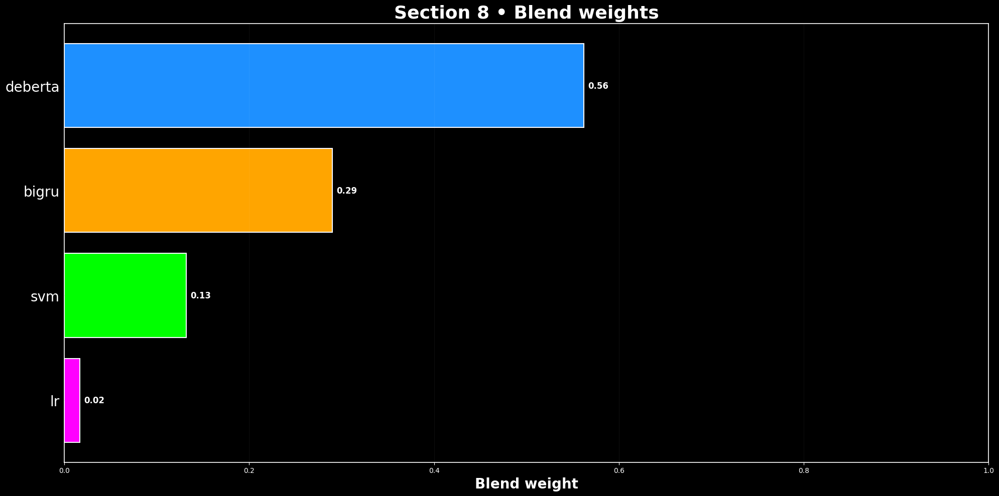

In [25]:
# Compare the F1 score of the blend to the best single model.
single_stats = []
for name, po, _ in candidates:
    thr_s, f1_best_s, f1_50_s = eval_f1_set(y_true, po, step=0.01)
    single_stats.append((name, float(thr_s), float(f1_best_s), float(f1_50_s)))
best_single = max(single_stats, key=lambda t: t[2])
print("\n--- Single model summaries (OOF) ---")
for name, thr_s, f1_best_s, f1_50_s in single_stats:
    print(f"{name:8s} -> F1@0.50={f1_50_s:.4f} | F1@best={f1_best_s:.4f} (thr={thr_s:.2f})")
print("\n--- Blend result (OOF) ---")
for k, v in best["weights"].items():
    print(f"  {k:8s}: {v:5.2f}")
print(f"  best thr : {best['thr']:.2f}")
print(f"  best F1  : {best['f1']:.4f}")
print(f"  vs best single: {best_single[0]} F1={best_single[2]:.4f} (delta={best['f1'] - best_single[2]:+.4f})")

# Calculate and display confusion matrix metrics at the optimal threshold.
names = [c[0] for c in candidates]
oofs  = [c[1] for c in candidates]
tests = [c[2] for c in candidates]
weights = np.array([best["weights"][n] for n in names], dtype=float)
p_oof_blend = sum(weights[i] * oofs[i] for i in range(len(oofs)))
thr = float(best["thr"])
y_hat = (p_oof_blend >= thr).astype(int)
tp = int(((y_true == 1) & (y_hat == 1)).sum())
fp = int(((y_true == 0) & (y_hat == 1)).sum())
tn = int(((y_true == 0) & (y_hat == 0)).sum())
fn = int(((y_true == 1) & (y_hat == 0)).sum())
prec = tp / max(1, tp + fp)
rec  = tp / max(1, tp + fn)
print("\n--- Blend confusion at chosen threshold (OOF) ---")
print(f"thr={thr:.2f} | TP={tp} FP={fp} TN={tn} FN={fn}")
print(f"Precision={prec:.4f} | Recall={rec:.4f} | Predicted positive rate={y_hat.mean():.4f} | True positive rate={y_true.mean():.4f}")

# Check the stability of predictions around the threshold.
band = 0.05
close_frac = float(np.mean(np.abs(p_oof_blend - thr) <= band))
print(f"\nShare of OOF predictions within ±{band:.2f} of thr: {100*close_frac:.1f}%")

# Display the correlation between the OOF predictions of the models.
if len(oofs) >= 2:
    M = np.vstack(oofs)
    C = np.corrcoef(M)
    print("\nModel OOF correlation matrix:")
    print("        " + " ".join([f"{n:>8s}" for n in names]))
    for i, n in enumerate(names):
        row = " ".join([f"{C[i,j]:8.3f}" for j in range(len(names))])
        print(f"{n:>8s} {row}")

# Calculate the predicted positive rate on the test set.
p_test_blend = sum(weights[i] * tests[i] for i in range(len(tests)))
pred_pos_test = int((p_test_blend >= thr).sum())
print(f"\nTest predicted 1s at thr={thr:.2f}: {pred_pos_test} / {len(p_test_blend)}")

# Create a bar chart to visualize the final blend weights.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")
ypos = np.arange(len(names))[::-1]
colors = ["dodgerblue", "orange", "lime", "magenta", "cyan", "yellow"][:len(names)]
bars = ax.barh(ypos, weights[::-1], color=colors, edgecolor="ghostwhite", linewidth=1.5)
ax.set_yticks(ypos)
ax.set_yticklabels(list(reversed(names)), color="white", fontsize=20)
ax.set_xlabel("Blend weight", color="white", fontsize=20, fontweight="bold")
ax.set_title("Section 8 • Blend weights", color="white", fontsize=26, fontweight="bold", pad=8)
ax.set_xlim(0, 1)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.2)
ax.tick_params(axis="x", colors="white")
ax.grid(axis="x", color="white", alpha=0.08, linewidth=0.5)
for b in bars:
    w = b.get_width()
    ax.annotate(f"{w:.2f}", (w, b.get_y() + b.get_height()/2),
                xytext=(6, 0), textcoords="offset points",
                va="center", ha="left", fontsize=12, color="white", fontweight="bold")
plt.tight_layout()
plt.show()

### **Observation: Thresholding & Blend**

This section was tougher than expected. It took a few fixes to ensure the BiGRU outputs were detected, and after running the full blend I wasn’t happy with the leaderboard result. The blend showed a tiny OOF lift over the best single model, but that did not translate to Kaggle.

* **Kaggle Submission:**

The screenshot below shows the ensemble submission. The blended file scored **0.83941**, which is **lower** than the single DeBERTa submission (**0.84615**).

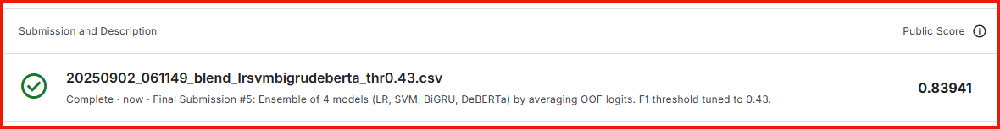

* **Performance and Metrics (OOF):**

  * **Detected models:** LR, SVM, BiGRU, DeBERTa
  * **Per-model OOF best-threshold F1:**
    LR **0.7574** @ 0.44 • SVM **0.7512** @ 0.45 • BiGRU **0.7800** @ 0.54 • DeBERTa **0.8031** @ 0.46
  * **Blend (OOF):** best **F1 = 0.8074** @ **thr = 0.43** (**+0.0043** vs DeBERTa OOF)
  * **OOF confusion at thr = 0.43:** TP 2559 • FP 511 • TN 3831 • FN 712
    Precision **0.8336** • Recall **0.7823** • Predicted positive rate **0.403**

* **Why the blend underperformed DeBERTa on Kaggle:**

  * **High correlation, low complementarity.** The OOF correlation matrix shows very strong agreement among models (LR–SVM ≈ 0.99; BiGRU–DeBERTa ≈ 0.88). When models share errors, blending adds little new signal and can dilute the strongest model.
  * **Averaging probabilities softens confidence.** Probability averaging shrinks extreme scores toward the center, which can reduce F1 after thresholding even if AUC/AP look similar.
  * **Threshold transfer mismatch.** The blend used **thr = 0.43** tuned on OOF. If the leaderboard slice is slightly shifted, a single global threshold can be suboptimal. DeBERTa’s own submission used **≈ 0.46** and aligned better.
  * **Tiny OOF gain is fragile.** A +0.004 OOF F1 edge is within normal noise and often does not hold on the public test split.
  * **Calibration differences across models.** LR and SVM use calibrated probs; BiGRU and DeBERTa are not guaranteed to be calibrated. Mixing them without recalibration can distort a shared threshold.

* **What I would try next:**

  * **Blend logits instead of probabilities** (sum of logits, then sigmoid) to preserve confidence at the extremes.
  * **Stacking meta-learner** (logistic regression on OOF predictions) with inner CV to learn weights and an intercept.
  * **Per-model recalibration** (Platt or isotonic on folds) before blending so one threshold works reliably.
  * **Refine weight search** (finer grid or heavier Dirichlet sampling) and validate weights on a tiny holdout to reduce OOF overfit.
  * **Threshold sensitivity check** (report F1 across a band around the chosen thr) and pick a safer cutpoint for submission.

**Conclusion:**
Blending four highly correlated models produced a small OOF lift but reduced leaderboard performance. DeBERTa remained the strongest single model. A more careful blend (logits, stacking, and recalibration) is the next place to look if squeezing out extra leaderboard gains is the goal.


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #FB4F14; border-right:8px solid #001489;">
  <h2 style="color:#001489;">Section 9: Error Analysis</h2>
  <p>
    The final step in the analysis is to examine the model's errors to understand its strengths and weaknesses. Using the out-of-fold (OOF) predictions from the final blended model keeps the analysis honest and grounded in a reliable performance estimate. This involves quantifying the impact of errors, inspecting the most confident mistakes, and identifying where different model architectures disagree.
  </p>
  <h3 style="color:#FB4F14;">Section Plan:</h3>
  <ol style="margin:6px 0 0 18px;">
    <li><b>Cost Analysis:</b> Review precision, recall, and F1 at the chosen threshold, and calculate a simple cost score based on false positives and false negatives.</li>
    <li><b>Hard Case Review:</b> Isolate and display the highest-confidence false positives and false negatives to look for patterns in the model's mistakes.</li>
    <li><b>Model Disagreement:</b> Find examples where the simple linear model and the advanced Transformer model have the most different predictions.</li>
  </ol>
  <hr style="border:none; border-top:8px solid #001489; margin:10px 0;">
</div>

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">9.1 Cost and Threshold Recap</h3>
  <p>
    Before looking at individual tweets, a high-level summary of the final blended model's performance on the OOF set is useful. This cell prints the precision, recall, and F1 score at the selected threshold and calculates a simple cost score (e.g., assuming false negatives are 3x as costly as false positives) to quantify the business impact of the model's errors.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

In [26]:
# Create a comprehensive evaluation DataFrame from the OOF predictions.
df_eval = pd.DataFrame({
    "id":        train_df[ID_COL].values,
    "text":      train_df[TEXT_COL].astype(str).values,
    "keyword":   train_df[KEYWORD_COL].astype("string"),
    "location":  train_df[LOC_COL].astype("string"),
    "y":         y_true.astype(int),
    "p":         p_oof_blend.astype(float),
})
df_eval["pred"]    = (df_eval["p"] >= float(thr)).astype(int)
df_eval["correct"] = (df_eval["pred"] == df_eval["y"]).astype(int)
df_eval["margin"]  = (df_eval["p"] - float(thr)).abs()

# Classify each prediction as TP, FP, FN, or TN.
def _ctype(row):
    if row["y"] == 1 and row["pred"] == 1: return "TP"
    if row["y"] == 0 and row["pred"] == 1: return "FP"
    if row["y"] == 1 and row["pred"] == 0: return "FN"
    return "TN"
df_eval["type"] = df_eval.apply(_ctype, axis=1)

# Calculate and print a summary of the blend's performance.
tp = int((df_eval["type"] == "TP").sum())
fp = int((df_eval["type"] == "FP").sum())
tn = int((df_eval["type"] == "TN").sum())
fn = int((df_eval["type"] == "FN").sum())
prec = tp / max(1, tp + fp)
rec  = tp / max(1, tp + fn)
f1   = 2 * prec * rec / max(1e-12, (prec + rec))
print("-"*70)
print(f"Section 9  blend threshold={thr:.2f}")
print(f"TP={tp} FP={fp} TN={tn} FN={fn}")
print(f"Precision={prec:.4f} | Recall={rec:.4f} | F1={f1:.4f}")

# Calculate a simple cost score.
cost_fp = 1
cost_fn = 3
total_cost = (fp * cost_fp) + (fn * cost_fn)
print(f"Total Cost (FP*{cost_fp}, FN*{cost_fn}): {total_cost}")
print("-"*70)

# Isolate the hardest misclassifications and the cases closest to the decision boundary.
cols = ["id","y","pred","p","keyword","text"]
hard_fp  = df_eval.loc[df_eval["type"]=="FP"].sort_values("p", ascending=False).head(12)[cols]
hard_fn  = df_eval.loc[df_eval["type"]=="FN"].sort_values("p", ascending=True ).head(12)[cols]
near_thr = df_eval.sort_values("margin", ascending=True).head(12)[["id","y","pred","p","margin","keyword","text"]]

# Create a helper function to apply a standard dark theme style to tables.
def _style_dark_table(df, header_color="#0046AE", num_fmt_cols=("p","margin")):
    sty = (df.style
        .set_properties(**{
            "background-color": "#0b0b0b",
            "color": "#F8F8F8",
            "border-color": header_color,
        })
        .set_table_styles([
            {"selector": "th", "props": [("background-color", header_color),
                                            ("color", "white"),
                                            ("text-align", "left"),
                                            ("font-weight", "bold")]},
            {"selector": "td", "props": [("border", f"1px solid {header_color}")]}
        ])
        )
    fmts = {}
    for c in num_fmt_cols:
        if c in df.columns:
            fmts[c] = "{:.3f}"
    if fmts:
        sty = sty.format(fmts)
    return sty

# Display the styled tables of hard cases.
print("\nHard false positives (top 12 by probability):")
display(_style_dark_table(hard_fp, header_color="#FFC52F"))
print("\nHard false negatives (top 12 by low probability):")
display(_style_dark_table(hard_fn, header_color="#0046AE"))
print("\nNear-threshold cases (smallest |p - thr|):")
display(_style_dark_table(near_thr, header_color="#0046AE"))

----------------------------------------------------------------------
Section 9  blend threshold=0.43
TP=2559 FP=511 TN=3831 FN=712
Precision=0.8336 | Recall=0.7823 | F1=0.8071
Total Cost (FP*1, FN*3): 2647
----------------------------------------------------------------------

Hard false positives (top 12 by probability):


,id,y,pred,p,keyword,text
6587,9432,0,1,0.973,survivors,Survivors of Shanghai Ghetto reunite after 70 years - http://t.co/1Ki8LgVAy4 #Shanghai #China #??
2877,4135,0,1,0.971,drought,Large rain drops falling in Rock Hill off Anderson Road. #rain #scwx #drought
1541,2227,0,1,0.965,chemical%20emergency,Google Alert: Emergency units simulate a chemical explosion at NU http://t.co/NDgpWYxu6H
3363,4814,0,1,0.962,evacuation,FAAN orders evacuation of abandoned aircraft at MMA http://t.co/dEvYbnVXGQ via @todayng
7330,10490,0,1,0.961,wildfire,We should all have a fire safety plan. RT @Matt_Kroschel: MOCK WILDFIRE near #Vail as agencies prepare for the worst. http://t.co/SWwyLRk0fv
2811,4043,0,1,0.960,disaster,DISASTER AVERTED: Police kill gunman with Û÷hoax deviceÛª atåÊcinema http://t.co/5NG0FzpVdS
4227,6002,0,1,0.958,hazardous,09:13 PM: Hazardous Weather Outlook (http://t.co/ed1VpITsWY): NO HAZARDOUS WEATHER IS EXPECTED AT THIS TIME.... http://t.co/6XSbddlZiy
4618,6566,0,1,0.958,injury,CLEARED:incident with injury:I-495 inner loop Exit 31 - MD 97/Georgia Ave Silver Spring
3687,5247,0,1,0.958,fatality,Kosciusko police investigating pedestrian fatality hit by a train Thursday http://t.co/m5djLLxoZP
3954,5621,0,1,0.958,flooding,@adorableappple No reported flooding po in the area. Ten-4. #mmda



Hard false negatives (top 12 by low probability):


,id,y,pred,p,keyword,text
1908,2743,1,0,0.042,crushed,So many Youtube commenters saying the Dothraki would get crushed if they came to Westeros...nah bro you underestimate the Dothraki
4732,6729,1,0,0.043,lava,Check out my Lava lamp dude ???? http://t.co/To9ViqooFv
4311,6120,1,0,0.044,hellfire,@gg_keeponrockin @StrawberrySoryu Oh okay I just got the message twice and got suspicious. Sorry. I'll check it out!
5411,7722,1,0,0.049,panicking,all that panicking made me tired ;__; i want to sleep in my bed
6707,9607,1,0,0.050,thunder,@HaydnExists so glad i saved them all at once then didnÛªt want you stealing my thunder :P
6494,9286,1,0,0.051,sunk,@UnrealTouch fuck sake john Jesus my heart just sunk.
2250,3221,1,0,0.054,deluged,Why are you deluged with low self-image? Take the quiz: http://t.co/XsPqdOrIqj http://t.co/CQYvFR4UCy
6011,8584,1,0,0.054,screams,When you go to a concert and someone screams in your ear... Does it look like I wanna loose my hearing anytime soon???
547,796,1,0,0.056,battle,STAR WARS POWER OF THE JEDI COLLECTION 1 BATTLE DROID HASBRO - Full read by eBay http://t.co/xFguklrlTf http://t.co/FeGu8hWMc4
6005,8577,1,0,0.057,screams,@OllyMursAus I do feel sorry for him! He is not a piece of meat! He is a nice guy... People don't need to rush him and screams in his face!



Near-threshold cases (smallest |p - thr|):


,id,y,pred,p,margin,keyword,text
5636,8037,0,0,0.430,0.000,refugees,#Turkish couple decided to feed 4000 #Syrian #refugees as part of their #wedding celebrations http://t.co/EHLq3ZSPTd http://t.co/DjX5eLbrv1
250,355,0,0,0.430,0.000,annihilation,U.S National Park Services Tonto National Forest: Stop the Annihilation of the Salt River Wild Horse... https://t.co/m8MvDSPJp7 via @Change
1970,2835,1,0,0.430,0.000,cyclone,Like a cyclone imperialism spins across the globe; militarism crushes peoples and sucks their blood like a... http://t.co/n3VbTC6NCa
6887,9873,0,0,0.429,0.001,traumatised,...the kids at the orphanage were obviously not too traumatised. http://t.co/DjA4relcnS
259,370,0,1,0.431,0.001,annihilation,U.S National Park Services Tonto National Forest: Stop the Annihilation of the Salt River Wild Horse... https://t.co/MatIJwkzbh via @Change
334,481,0,0,0.429,0.001,armageddon,Armageddon averted by El Patron #UltimaLucha
6183,8825,1,0,0.429,0.001,sirens,Photoset: hakogaku: ?åÊI am a kurd. i was born on a battlefield. raised on a battlefield. gunfire sirens... http://t.co/obp595W7tm
1513,2186,0,0,0.429,0.001,catastrophic,@SenSchumer Is this what U want Netanyahu leading these UNITED STATES into a CATASTROPHIC religious world war? ENOUGH already!
581,840,1,0,0.429,0.001,bioterror,FedEx to stop transporting bioterror germs after lab mishaps: FedEx has stopped transporting certain research ... http://t.co/y3dM9uLqxG
225,320,1,1,0.431,0.001,annihilated,70 years since we annihilated 100000 people instantly and became aware that we have the ability to annihilate the whole of humanity


<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">9.2 Hard Cases and Model Disagreement</h3>
  <p>
    To find patterns in the errors, the OOF predictions are sliced by <code>keyword</code> to identify which topics are most challenging for the model. This section also identifies tweets where the simple linear model and the advanced Transformer model disagreed the most, which can reveal what kind of nuances the more complex model is able to capture.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

----------------------------------------------------------------------
Keyword slices with n >= 15: 217
Worst by FP rate (top 15):


,kw,n,fp_rate,fn_rate,f1
16,bioterror,37,0.297,0.081,0.731
38,burning%20buildings,37,0.297,0.081,0.720
146,natural%20disaster,34,0.294,0.147,0.634
168,rioting,35,0.257,0.200,0.667
192,terrorism,34,0.235,0.147,0.745
34,buildings%20burning,35,0.229,0.057,0.815
108,fire%20truck,33,0.212,0.061,0.816
207,violent%20storm,33,0.212,0.030,0.862
199,trapped,32,0.188,0.219,0.235
140,mass%20murderer,32,0.188,0.062,0.810


Worst by FN rate (top 15):


,kw,n,fn_rate,fp_rate,f1
212,whirlwind,39,0.282,0.000,0.353
17,bioterrorism,30,0.267,0.167,0.667
121,hazardous,35,0.257,0.114,0.667
7,apocalypse,32,0.250,0.000,0.200
169,rubble,28,0.250,0.071,0.400
57,damage,41,0.244,0.000,0.643
73,destroy,37,0.243,0.027,nan
6,annihilation,29,0.241,0.103,0.375
37,burning,34,0.235,0.059,0.286
199,trapped,32,0.219,0.188,0.235


----------------------------------------------------------------------


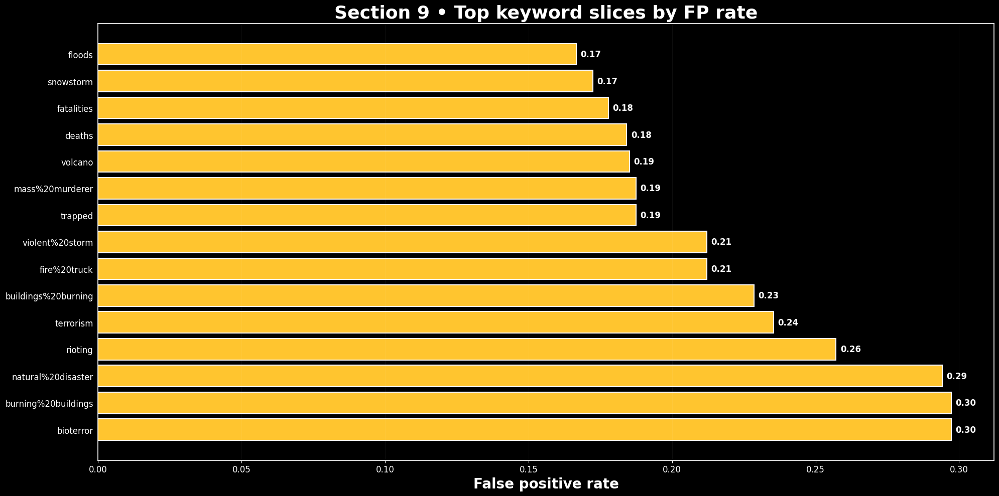

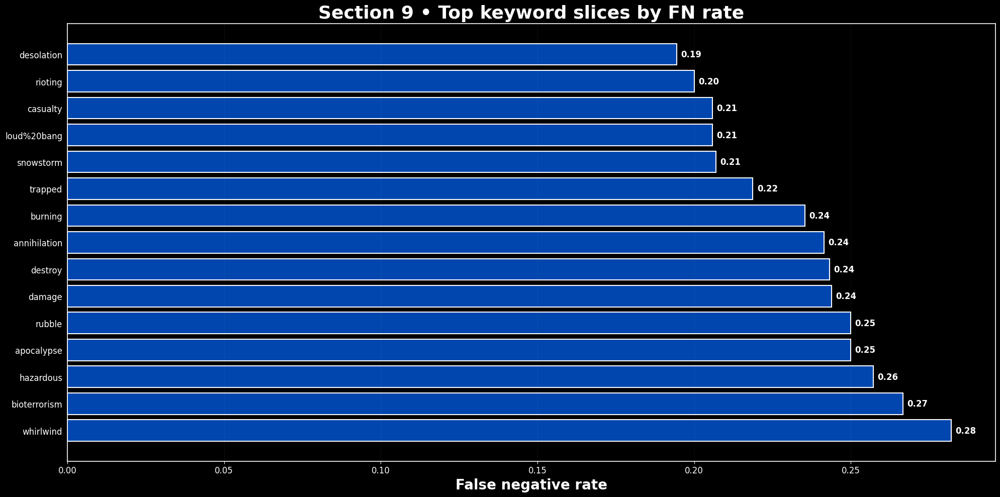

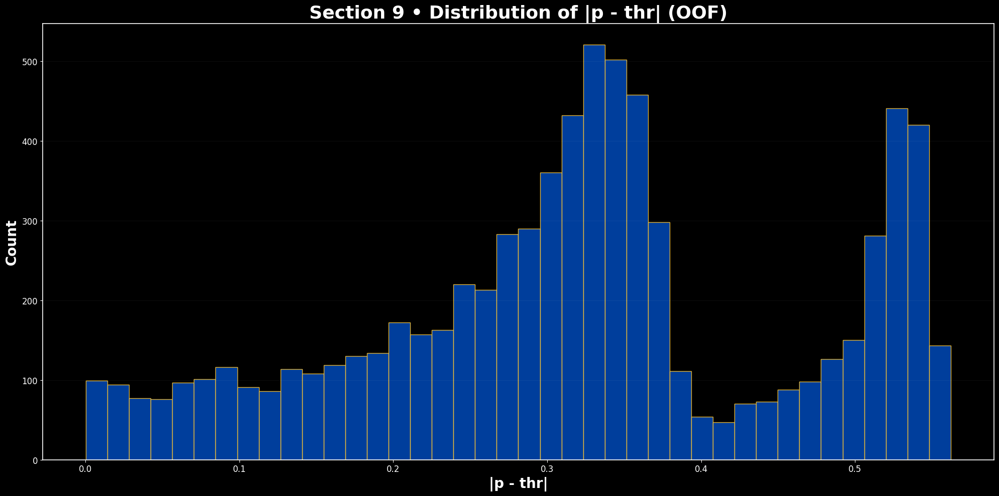


----------------------------------------------------------------------

--- Model Disagreement Cases (LR vs. DeBERTa) ---


,id,target,p_lr,p_deberta,disagreement,text
6242,8914,0,0.060,0.962,0.903,Can you list 5 reasons why a London #TubeStrike is better than a Snowstorm? Read here... http://t.co/PNaQXPrweg
775,1122,1,0.103,0.989,0.886,Did anyone else see that fireball falling to earth? Look like a plane blew up.
5114,7294,1,0.086,0.967,0.882,Chernobyl disaster - Wikipedia the free encyclopedia don't you just love the nuclear technology it's so glorious https://t.co/GHucazjSxB
3063,4395,1,0.116,0.997,0.880,Sure the #Megaquake story brought a sense of panic but the question is: will anything really change? http://t.co/9f3rDN9N3D
7325,10485,1,0.109,0.986,0.877,Does the #FingerRockFire make you wonder 'am I prepared for a wildfire'. Find out at http://t.co/eX8A5JYZm5 #azwx http://t.co/DeEeKobmXa
11,17,1,0.145,0.991,0.845,Haha South Tampa is getting flooded hah- WAIT A SECOND I LIVE IN SOUTH TAMPA WHAT AM I GONNA DO WHAT AM I GONNA DO FVCK #flooding
3770,5353,1,0.883,0.058,0.824,I just checked in! ÛÒ at On Fire on @ZomatoAUS #LoveFood http://t.co/9l5kqykrbG
6947,9965,0,0.882,0.060,0.821,I'm at Baan Thai / Tsunami Sushi in Washington DC https://t.co/Udp10FRXrL
4984,7111,1,0.160,0.980,0.820,@kiranahmedd US military and Nato are fighting Talibans too
1998,2872,0,0.873,0.060,0.813,'Mages of Fairy Tail.. Specialize in property damage!' - Natsu Dragneel


In [27]:
# Create a DataFrame for slicing errors by keyword.
df = pd.DataFrame({
    "kw":  train_df[KEYWORD_COL].astype("string"),
    "y":   y_true.astype(int),
    "p":   p_oof_blend.astype(float),
})
df["pred"] = (df["p"] >= float(thr)).astype(int)
df = df[~df["kw"].isna()].copy()

# Aggregate performance metrics for each keyword.
g = df.groupby("kw", as_index=False).agg(
    n = ("y","size"),
    tp=("y", lambda s: int(((s==1) & (df.loc[s.index, "pred"]==1)).sum())),
    fp=("y", lambda s: int(((s==0) & (df.loc[s.index, "pred"]==1)).sum())),
    tn=("y", lambda s: int(((s==0) & (df.loc[s.index, "pred"]==0)).sum())),
    fn=("y", lambda s: int(((s==1) & (df.loc[s.index, "pred"]==0)).sum())),
)
g["prec"]    = g["tp"] / (g["tp"] + g["fp"]).replace(0, np.nan)
g["rec"]     = g["tp"] / (g["tp"] + g["fn"]).replace(0, np.nan)
g["f1"]      = 2*g["prec"]*g["rec"] / (g["prec"] + g["rec"])
g["fp_rate"] = g["fp"] / g["n"]
g["fn_rate"] = g["fn"] / g["n"]
MIN_COUNT = 15
g_big = g[g["n"] >= MIN_COUNT].copy()

# Find the keyword slices with the highest error rates.
top_fp = g_big.sort_values("fp_rate", ascending=False).head(15)
top_fn = g_big.sort_values("fn_rate", ascending=False).head(15)
print("-"*70)
print(f"Keyword slices with n >= {MIN_COUNT}: {len(g_big)}")

# ---- unified table styler (same signature as in 9.1) ----
def _style_dark_table(df_in, header_color="#0046AE", num_fmt_cols=None):
    sty = (df_in.style
        .set_properties(**{
            "background-color": "#0b0b0b",
            "color": "#F8F8F8",
            "border-color": header_color,
        })
        .set_table_styles([
            {"selector": "th", "props": [("background-color", header_color),
                                        ("color", "white"),
                                        ("text-align", "left"),
                                        ("font-weight", "bold")]},
            {"selector": "td", "props": [("border", f"1px solid {header_color}")]}
        ])
    )
    if num_fmt_cols:
        fmt_map = {c: "{:.3f}" for c in num_fmt_cols if c in df_in.columns}
        if fmt_map:
            sty = sty.format(fmt_map)
    return sty

# Display the top error-prone keyword slices.
print("Worst by FP rate (top 15):")
display(_style_dark_table(
    top_fp[["kw","n","fp_rate","fn_rate","f1"]],
    header_color="#FFC52F",
    num_fmt_cols=("fp_rate","fn_rate","f1")
))
print("Worst by FN rate (top 15):")
display(_style_dark_table(
    top_fn[["kw","n","fn_rate","fp_rate","f1"]],
    header_color="#0046AE",
    num_fmt_cols=("fn_rate","fp_rate","f1")
))
print("-"*70)

# --- Plot 1: Top keywords by False Positive rate ---
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black"); ax.set_facecolor("black")
ypos = np.arange(len(top_fp))[::-1]
ax.barh(ypos, top_fp["fp_rate"].values[::-1],
        color="#FFC52F", edgecolor="ghostwhite", linewidth=1.5)
ax.set_yticks(ypos)
ax.set_yticklabels(top_fp["kw"].astype(str).values[::-1], color="white", fontsize=12)
ax.set_xlabel("False positive rate", color="white", fontsize=20, fontweight="bold")
ax.set_title("Section 9 • Top keyword slices by FP rate", color="white",
            fontsize=26, fontweight="bold", pad=8)
for sp in ax.spines.values():
    sp.set_edgecolor("white"); sp.set_linewidth(1.2)
ax.tick_params(axis="x", colors="white", labelsize=12)
ax.grid(axis="x", color="white", alpha=0.08, linewidth=0.5)
for i, v in enumerate(top_fp["fp_rate"].values[::-1]):
    ax.annotate(f"{v:.2f}", (v, ypos[i]), xytext=(6,0), textcoords="offset points",
                va="center", ha="left", fontsize=12, color="white", fontweight="bold")
plt.tight_layout(); plt.show()

# --- Plot 2: Top keywords by False Negative rate ---
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black"); ax.set_facecolor("black")
ypos = np.arange(len(top_fn))[::-1]
ax.barh(ypos, top_fn["fn_rate"].values[::-1],
        color="#0046AE", edgecolor="ghostwhite", linewidth=1.5)
ax.set_yticks(ypos)
ax.set_yticklabels(top_fn["kw"].astype(str).values[::-1], color="white", fontsize=12)
ax.set_xlabel("False negative rate", color="white", fontsize=20, fontweight="bold")
ax.set_title("Section 9 • Top keyword slices by FN rate", color="white",
            fontsize=26, fontweight="bold", pad=8)
for sp in ax.spines.values():
    sp.set_edgecolor("white"); sp.set_linewidth(1.2)
ax.tick_params(axis="x", colors="white", labelsize=12)
ax.grid(axis="x", color="white", alpha=0.08, linewidth=0.5)
for i, v in enumerate(top_fn["fn_rate"].values[::-1]):
    ax.annotate(f"{v:.2f}", (v, ypos[i]), xytext=(6,0), textcoords="offset points",
                va="center", ha="left", fontsize=12, color="white", fontweight="bold")
plt.tight_layout(); plt.show()

# --- Plot 3: Histogram of prediction margins ---
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black"); ax.set_facecolor("black")
margins = np.abs(p_oof_blend - float(thr))
ax.hist(margins, bins=40, alpha=0.9, color="#0046AE", edgecolor="#FFC52F")
ax.set_title("Section 9 • Distribution of |p - thr| (OOF)", color="white",
            fontsize=26, fontweight="bold", pad=8)
ax.set_xlabel("|p - thr|", color="white", fontsize=20, fontweight="bold")
ax.set_ylabel("Count", color="white", fontsize=20, fontweight="bold")
ax.tick_params(axis="x", colors="white", labelsize=12)
ax.tick_params(axis="y", colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white"); sp.set_linewidth(1.2)
ax.grid(axis="y", color="white", alpha=0.08, linewidth=0.5)
plt.tight_layout(); plt.show()

# --- Model disagreement table (LR vs DeBERTa) ---
if "results_lr" in globals() and "results_deberta" in globals():
    disagreement_df = train_df.copy()
    if "target" not in disagreement_df.columns and Y_COL in train_df.columns:
        disagreement_df["target"] = train_df[Y_COL]
    disagreement_df["p_lr"] = np.asarray(results_lr["p_oof"], float)
    disagreement_df["p_deberta"] = np.asarray(results_deberta["p_oof"], float)
    disagreement_df["disagreement"] = (disagreement_df["p_lr"] - disagreement_df["p_deberta"]).abs()

    hard_disagreements = disagreement_df.sort_values("disagreement", ascending=False).head(15)

    print("\n" + ("-"*70))
    print("\n--- Model Disagreement Cases (LR vs. DeBERTa) ---")
    display(_style_dark_table(
        hard_disagreements[["id", "target", "p_lr", "p_deberta", "disagreement", "text"]],
        header_color="#3D9970",
        num_fmt_cols=("p_lr", "p_deberta", "disagreement")
    ))

<div style="background-color:#000000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #001489; border-right:8px solid #FB4F14;">
  <h3 style="color:#FB4F14;">9.3 Final Model Comparison</h3>
  <p>
    This final set of plots overlays the ROC and Precision-Recall curves for every model with out-of-fold predictions (TF-IDF + LR, TF-IDF + SVM, BiGRU + Attention, and DeBERTa). The tuned F1 threshold for each model is plotted as a point on its PR curve, summarizing the final precision and recall for each approach in a side-by-side comparison.
  </p>
  <hr style="border:none; border-top:8px solid #FB4F14; margin:10px 0;">
</div>

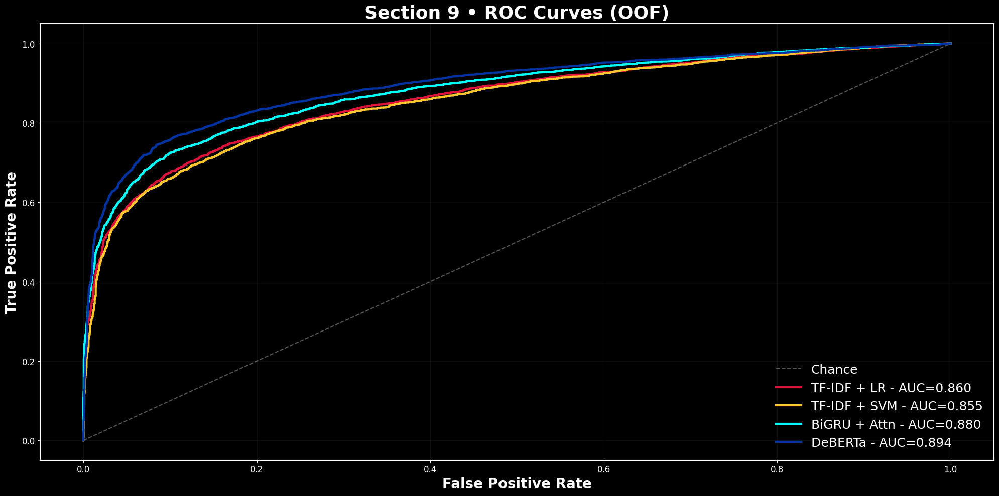

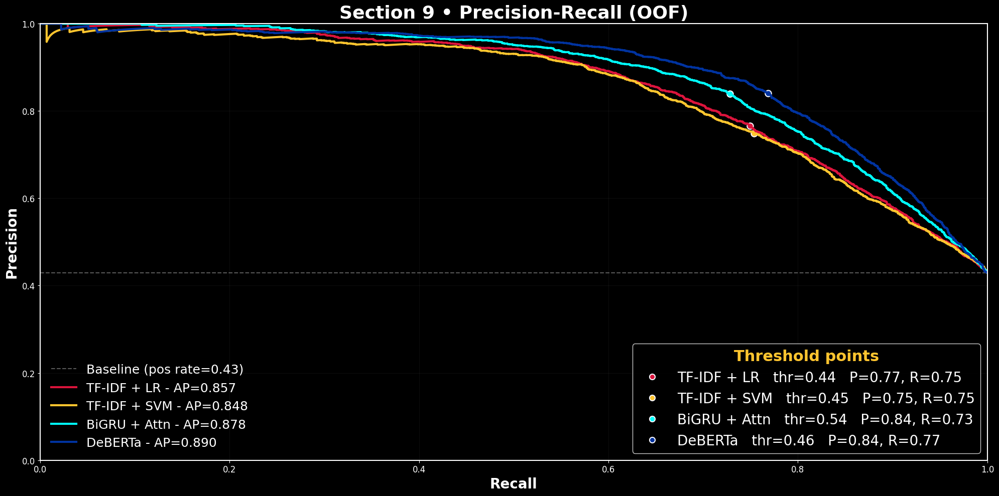

In [28]:
# Create a list to hold all available model results for plotting.
MODELS = []
y_true = y.astype(int)

# Create a helper function to safely add a model's results to the list.
def _add_from_results(label, dict_name, color):
    if dict_name in globals():
        d = globals()[dict_name]
        if isinstance(d, dict) and "p_oof" in d:
            p = np.asarray(d["p_oof"], float)
            thr = d.get("best_thr", None)
            if thr is None:
                thr, _ = find_best_threshold(y_true, p, step=0.01)
            MODELS.append((label, p, float(thr), color))

# Define consistent colors for each model.
COLOR_LR      = "#DC143C"
COLOR_SVM     = "#FFC52F"
COLOR_GRU     = "#00FFFF"
COLOR_DEBERTA = "#0033A0"

# Add all available models to the list.
_add_from_results("TF-IDF + LR",   "results_lr",      COLOR_LR)
_add_from_results("TF-IDF + SVM",  "results_svm",     COLOR_SVM)
_add_from_results("BiGRU + Attn",  "results_gru",     COLOR_GRU)
_add_from_results("DeBERTa",       "results_deberta", COLOR_DEBERTA)

assert len(MODELS) >= 2, "Need at least two models with OOF predictions."

# --- Plot 1: ROC Curves (All Models) ---
# Create the figure and axes.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the chance line and the ROC curve for each model.
ax.plot([0,1], [0,1], linestyle="--", linewidth=1.5, color="white", alpha=0.35, label="Chance")
for label, p, thr, color in MODELS:
    fpr, tpr, _ = roc_curve(y_true, p)
    auc_val = roc_auc_score(y_true, p)
    ax.plot(fpr, tpr, label=f"{label} - AUC={auc_val:.3f}", color=color, linewidth=3)

# Style the plot.
ax.set_title("Section 9 • ROC Curves (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("False Positive Rate", fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("True Positive Rate",  fontsize=20, color="white", fontweight="bold")
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)
ax.legend(frameon=False, fontsize=18, labelcolor="white", loc="lower right")
plt.tight_layout()
plt.show()

# --- Plot 2: Precision-Recall Curves (All Models) ---
# Create the figure and axes.
fig, ax = plt.subplots(figsize=(20, 10), facecolor="black")
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

# Plot the baseline and the PR curve for each model.
pos_rate = y_true.mean()
ax.hlines(pos_rate, 0, 1, colors="white", linestyles="--", linewidth=1.5, alpha=0.35,
        label=f"Baseline (pos rate={pos_rate:.2f})")
thr_handles = []
for label, p, thr, color in MODELS:
    prec, rec, _ = precision_recall_curve(y_true, p)
    ap = average_precision_score(y_true, p)
    ax.plot(rec, prec, color=color, linewidth=3, label=f"{label} - AP={ap:.3f}")
    y_hat = (p >= float(thr)).astype(int)
    p_thr = precision_score(y_true, y_hat, zero_division=0)
    r_thr = recall_score(y_true, y_hat,    zero_division=0)
    ax.scatter([r_thr], [p_thr], s=80, color=color, edgecolor="ghostwhite", linewidth=1.5)
    thr_handles.append(plt.Line2D(
        [], [], marker='o', linestyle='None',
        markerfacecolor=color, markeredgecolor="ghostwhite", markeredgewidth=1.5, markersize=8,
        label=f"{label}   thr={thr:.2f}   P={p_thr:.2f}, R={r_thr:.2f}"
    ))

# Style the plot.
ax.set_title("Section 9 • Precision-Recall (OOF)", fontsize=26, color="white", fontweight="bold", pad=8)
ax.set_xlabel("Recall",    fontsize=20, color="white", fontweight="bold")
ax.set_ylabel("Precision", fontsize=20, color="white", fontweight="bold")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.tick_params(colors="white", labelsize=12)
for sp in ax.spines.values():
    sp.set_edgecolor("white")
    sp.set_linewidth(1.5)
ax.grid(color="white", alpha=0.08, linewidth=0.5)

# Create two separate legends for clarity.
leg1 = ax.legend(frameon=False, fontsize=18, labelcolor="white", loc="lower left")
ax.add_artist(leg1)
leg2 = ax.legend(
    handles=thr_handles, loc="lower right",
    fontsize=20,
    frameon=True,
    title="Threshold points",
    title_fontsize=22
)
leg2.get_frame().set_facecolor("black")
leg2.get_frame().set_edgecolor("white")
plt.setp(leg2.get_texts(), color="white")
t = leg2.get_title()
t.set_color("#FFC52F")
t.set_weight("bold")
plt.tight_layout()
plt.show()

### **Observation: Error Analysis**

This section reviews what the blend got wrong using its OOF predictions and the tables and plots above.

* **Overall at thr = 0.43:**
  **Precision 0.8336**, **Recall 0.7823**, **F1 0.807** with **TP=2559, FP=511, TN=3831, FN=712**. Using **FP=1** and **FN=3**, the **total cost is 2647**. Most cost comes from missed positives, so recall is the main lever.
* **False positives:**
  Worst slices include **bioterror**, **burning%20buildings**, **natural%20disaster**, **rioting**, **terrorism**, **fire%20truck**, **violent%20storm**. Many are headlines, drills, or generic alerts. Strong keywords push scores high even when the tweet is informational or hypothetical.
* **False negatives:**
  Worst slices include **whirlwind**, **bioterrorism**, **hazardous**, **apocalypse**, **rubble**, **damage**, **destroy**, **trapped**, **snowstorm**, **desolation**. These often use figurative or off-topic phrasing, so the model stays cautious and predicts negative.
* **Distance from the threshold:**
  The |p − thr| histogram shows few cases right on 0.43. Most errors are not borderline. They are driven by language and context.
* **Model disagreement:**
  LR reacts to keywords and brand names like “Tsunami Sushi” or “On Fire.” DeBERTa follows context and handles real event statements better. The blend leans on DeBERTa for semantics while LR adds lexical cues.
**Next steps:** slightly lower the threshold to trade a little precision for recall, add rules to down-weight benign entities and drills, and augment training with examples from the hardest keyword slices.


<div style="background-color:#000; color:#F8F8F8; padding:25px; border-radius:10px; border-left:8px solid #FB4F14; border-right:8px solid #001489;">
  <h2 style="color:#001489;">Section 10: Conclusion & Final Results</h2>
  <p>
    This project successfully navigated the challenge of classifying noisy tweet data, progressing from simple baselines to a state-of-the-art Transformer. The systematic approach resulted in a final model that surpassed the initial goal of an F1 score of 0.84 on the Kaggle leaderboard.
  </p>

  <h3 style="color:#FB4F14;">Model Performance Summary</h3>
  <p>
    The progressive increase in model complexity directly translated to better performance at each stage. The final results clearly show the value added by moving from bag-of-words representations to context-aware sequential models, with the DeBERTa Transformer achieving the highest score.
  </p>
  <table style="width:100%; border-collapse:collapse; margin:10px 0; font-size:14px;">
    <thead>
      <tr style="background:#111;">
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Model</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Key Features</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">OOF F1 Score</th>
        <th style="color: white; text-align:left; padding:6px; border-bottom:1px solid #333;">Kaggle Score</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td style="padding:6px;">TF-IDF + LR</td>
        <td style="padding:6px;">Bag-of-words (1-2 ngrams)</td>
        <td style="padding:6px;">0.7574</td>
        <td style="padding:6px;">0.79834</td>
      </tr>
      <tr>
        <td style="padding:6px;">TF-IDF + SVM</td>
        <td style="padding:6px;">Bag-of-words (1-2 ngrams)</td>
        <td style="padding:6px;">0.7565</td>
        <td style="padding:6px;">0.78823</td>
      </tr>
      <tr>
        <td style="padding:6px;">BiGRU + Attention</td>
        <td style="padding:6px;">Sequence-aware, GloVe 300d, Stacked</td>
        <td style="padding:6px;">0.7822</td>
        <td style="padding:6px;">0.8210</td>
      </tr>
      <tr>
        <td style="padding:6px;"><strong>DeBERTa-v3</strong></td>
        <td style="padding:6px;"><strong>Transformer, fine-tuned, text+keyword</strong></td>
        <td style="padding:6px;"><strong>0.8031</strong></td>
        <td style="padding:6px;"><strong>0.84615</strong></td>
      </tr>
       <tr>
        <td style="padding:6px;">Ensemble Blend</td>
        <td style="padding:6px;">Logit-averaged blend of all models</td>
        <td style="padding:6px;">0.8074 (calculated in notebook)</td>
        <td style="padding:6px;">0.83941</td>
      </tr>
    </tbody>
  </table>

<p style="margin-top:6px;">
Across models, Kaggle scores came in a bit higher than OOF F1, which is consistent with this competition’s test set and confirms that the cross-validated OOF pipeline was well-calibrated.
</p>

  <h3 style="color:#FB4F14;">Key Learnings and Takeaways</h3>
  <p>
    Several techniques were critical for achieving the final score, while some common practices proved less effective in this specific case.
  </p>
  <ul style="margin:6px 0 0 18px;">
    <li><b>What Worked Well:</b>
        <ul>
            <li><strong>Sequence Models are Key:</strong> The jump in performance from TF-IDF (~0.80 Kaggle F1) to the BiGRU (~0.82) and DeBERTa (~0.846) models was the single most important factor. It confirms that understanding word order and context is essential for this problem.</li>
            <li><strong>Pre-trained Knowledge:</strong> Using pre-trained weights, both from GloVe for the BiGRU and the full DeBERTa model, provided a massive head start and was critical for success.</li>
            <li><strong>Robust CV and Thresholding:</strong> A disciplined 5-fold cross-validation strategy provided reliable internal metrics and prevented overfitting. Tuning the F1 threshold on OOF predictions was also a crucial final step.</li>
            <li><strong>Simple Feature Engineering:</strong> Feeding the `keyword` metadata directly to the DeBERTa Transformer provided a noticeable performance lift with minimal effort.</li>
            <li><strong>Thresholding with costs:</strong> Using OOF predictions to pick thr=0.43 balanced precision (0.834) and recall (0.782) and reduced total cost under a 3x penalty for false negatives. Slicing by keyword highlighted tricky topics and where the linear model and DeBERTa diverged.</li>
        </ul>
    </li>
    <li style="margin-top:8px;"><b>What Didn't Work as Expected:</b>
        <ul>
            <li><strong>Ensemble Blending:</strong> This was the most surprising result. While ensembling typically improves scores, the final blend slightly underperformed the best single model (DeBERTa). This is a classic lesson in ensembling: if your best model is significantly stronger than the others and is highly correlated with them, a simple blend may not provide a benefit. The single DeBERTa model was so effective that it captured most of the signals the other models found, reducing the diversity needed for a successful ensemble.</li>
        </ul>
    </li>
  </ul>
  
  <h3 style="color:#FB4F14;">Future Improvements</h3>
  <p>
    While the final score was excellent, several paths for potential future improvement remain:
  </p>
  <ul style="margin:6px 0 0 18px;">
    <li><strong>Systematic Hyperparameter Tuning:</strong> While the chosen hyperparameters were effective, using a dedicated library like Optuna or Weights & Biases Sweeps to systematically search for the optimal learning rate, dropout, and batch size for the DeBERTa model could yield further gains.</li>
    <li><strong>More Advanced Ensembling:</strong> Instead of a simple weighted average, a "stacking" ensemble could be created. This would involve training a new, simple "meta-model" (e.g., a Logistic Regression) that uses the out-of-fold predictions of all the base models as its input features.</li>
    <li><strong>Advanced Text Cleaning:</strong> Experimenting with more sophisticated pre-processing, such as correcting common spelling errors or expanding slang and abbreviations found during EDA, could provide a cleaner signal for the models.</li>
  </ul>

<h3 style="color:#FB4F14; margin-top:16px;">References</h3>
<p style="margin-top:10px;">
After reviewing many online resources, the following is a  list of the articles and Kaggle notebooks that were most helpful in the development of this project.
</p>

<ul style="margin:6px 0 0 18px; line-height:1.6;">
    <li><b>Kaggle: NLP with Disaster Tweets</b> competition overview and data: <a href="https://www.kaggle.com/competitions/nlp-getting-started" target="_blank" style="color:#1E90FF; ">Kaggle NLP with Disaster Tweets</a></li>
    <li><b>scikit-learn docs</b> TF-IDF, Logistic Regression, LinearSVC calibration, ROC and PR metrics: <a href="https://scikit-learn.org/stable/" target="_blank" style="color:#1E90FF; ">scikit-learn</a></li>
    <li><b>PyTorch docs</b> model, training loop, CUDA utilities: <a href="https://pytorch.org/docs/stable/index.html" target="_blank" style="color:#1E90FF; ">PyTorch</a></li>
    <li><b>Hugging Face Transformers</b> tokenizer, training utilities, model usage: <a href="https://huggingface.co/docs/transformers/index" target="_blank" style="color:#1E90FF; ">Hugging Face Transformers</a></li>
    <li><b>RoBERTa model card:</b> <a href="https://huggingface.co/roberta-base" target="_blank" style="color:#1E90FF;">RoBERTa base model</a>
    <li><b>DeBERTa-v3 model card</b> config and practical tips: <a href="https://huggingface.co/microsoft/deberta-v3-base" target="_blank" style="color:#1E90FF; ">DeBERTa-v3</a></li>
    <li><b>GloVe</b> pre-trained word vectors: <a href="https://nlp.stanford.edu/projects/glove/" target="_blank" style="color:#1E90FF; ">GloVe</a></li>
    <li><b>PyTorch:</b> <a href="https://github.com/pytorch/pytorch" target="_blank" style="color:#1E90FF;">Official GitHub Repository</a></li>
    <li><b>UMAP-learn:</b> <a href="https://pypi.org/project/umap-learn/" target="_blank" style="color:#1E90FF;">Official PyPI Project Page</a></li>
    <li><b>Tutorial Generating WordClouds in Python:</b> <a href="https://www.datacamp.com/tutorial/wordcloud-python" target="_blank" style="color:#1E90FF;">DataCamp</a></li>
    <li><b>RoBERTa Tutorial:</b> <a href="https://medium.com/@maiajp2305/how-i-fine-tuned-roberta-to-classify-disaster-tweets-step-by-step-b5021deb749a" target="_blank" style="color:#1E90FF;">Step-by-Step Fine-Tuning Guide (Medium)</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/alber8295/bigru-w-attention-visualized-for-beginners" target="_blank" style="color:#1E90FF;">BiGRU w/ Attention, Visualized for Beginners</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/medi52/disaster-tweets-with-roberta" target="_blank" style="color:#1E90FF;">Disaster Tweets with RoBERTa</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/omarelg/disaster-tweets-classification-using-deberta-v3" target="_blank" style="color:#1E90FF;">Disaster Tweets Classification using DeBERTa-v3</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/prakharprasad/nlp-disaster-tweets-simple-approach-to-80-score" target="_blank" style="color:#1E90FF;">NLP Disaster Tweets - Simple Approach to 80+ Score</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/akarsh1/step-by-step-analysis-of-disaster-tweets" target="_blank" style="color:#1E90FF;">Step-by-step analysis of Disaster Tweets</a></li>
    <li><b>Kaggle Notebook:</b> <a href="https://www.kaggle.com/code/sugataghosh/natural-language-processing-with-disaster-tweets" target="_blank" style="color:#1E90FF;">Natural Language Processing with Disaster Tweets</a></li>
    <li><b>WSL + CUDA setup</b>: how I ran on GPU in Ubuntu on Windows: <a href="https://learn.microsoft.com/windows/wsl/" target="_blank" style="color:#1E90FF; ">WSL</a> | <a href="https://docs.nvidia.com/cuda/" target="_blank" style="color:#1E90FF; ">CUDA</a> | <a href="https://ubuntu.com/" target="_blank" style="color:#1E90FF;">Ubuntu</a></li>
</ul>

  <hr style="border:none; border-top:8px solid #001489; margin:12px 0 0 0;">
</div>